In [425]:
 from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [426]:
from datetime import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from scipy import stats
from scipy.stats import ttest_ind
import warnings
warnings.filterwarnings('ignore')

In [427]:
df=pd.read_excel("/content/drive/MyDrive/marketing_campaign.xlsx",sheet_name="marketing_campaign",parse_dates=['Dt_Customer'])

In [428]:
data_Original=df.copy()

In [429]:
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,5,0,0,0,0,0,0,3,11,0


In [430]:
df.tail()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,...,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,...,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,...,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,...,3,0,0,0,0,0,0,3,11,0
2239,9405,1954,PhD,Married,52869.0,1,1,2012-10-15,40,84,...,7,0,0,0,0,0,0,3,11,1


In [431]:
df.shape

(2240, 29)

In [432]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2240 non-null   int64         
 1   Year_Birth           2240 non-null   int64         
 2   Education            2240 non-null   object        
 3   Marital_Status       2240 non-null   object        
 4   Income               2216 non-null   float64       
 5   Kidhome              2240 non-null   int64         
 6   Teenhome             2240 non-null   int64         
 7   Dt_Customer          2240 non-null   datetime64[ns]
 8   Recency              2240 non-null   int64         
 9   MntWines             2240 non-null   int64         
 10  MntFruits            2240 non-null   int64         
 11  MntMeatProducts      2240 non-null   int64         
 12  MntFishProducts      2240 non-null   int64         
 13  MntSweetProducts     2240 non-nul

In [433]:
df.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,2013-07-10 10:01:42.857142784,49.109375,303.935714,26.302232,166.950000,...,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,2012-07-30 00:00:00,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,2013-01-16 00:00:00,24.000000,23.750000,1.000000,16.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,2013-07-08 12:00:00,49.000000,173.500000,8.000000,67.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,2013-12-30 06:00:00,74.000000,504.250000,33.000000,232.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,2014-06-29 00:00:00,99.000000,1493.000000,199.000000,1725.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,NaN,28.962453,336.597393,39.773434,225.715373,...,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274


In [434]:
df.isnull().sum()

,0
ID,0
Year_Birth,0
Education,0
Marital_Status,0
Income,24
Kidhome,0
Teenhome,0
Dt_Customer,0
Recency,0
MntWines,0


In [435]:
df.dtypes

,0
ID,int64
Year_Birth,int64
Education,object
Marital_Status,object
Income,float64
Kidhome,int64
Teenhome,int64
Dt_Customer,datetime64[ns]
Recency,int64
MntWines,int64


In [436]:
df.duplicated().sum()

np.int64(0)

In [437]:
df.columns.duplicated().sum()

np.int64(0)

In [438]:
df.corr(numeric_only=True)

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
ID,1.000000,0.000028,0.013095,0.002406,-0.002580,-0.046524,-0.022878,0.004600,-0.004437,-0.024475,...,-0.007446,-0.036040,-0.025387,-0.007517,-0.021614,-0.015061,0.033883,NaN,NaN,-0.021968
Year_Birth,0.000028,1.000000,-0.161791,0.230176,-0.352111,-0.019871,-0.157773,-0.017917,-0.030872,-0.041625,...,0.121139,0.061774,-0.060510,0.007123,-0.005930,-0.006539,-0.030128,NaN,NaN,0.021325
Income,0.013095,-0.161791,1.000000,-0.428669,0.019133,-0.003970,0.578650,0.430842,0.584633,0.438871,...,-0.553088,-0.016174,0.184400,0.335943,0.276820,0.087545,-0.027225,NaN,NaN,0.133047
Kidhome,0.002406,0.230176,-0.428669,1.000000,-0.036133,0.008827,-0.496297,-0.372581,-0.437129,-0.387644,...,0.447846,0.014674,-0.161600,-0.205634,-0.172339,-0.081716,0.040207,NaN,NaN,-0.080008
Teenhome,-0.002580,-0.352111,0.019133,-0.036133,1.000000,0.016198,0.004846,-0.176764,-0.261160,-0.204187,...,0.134884,-0.042677,0.038886,-0.191050,-0.140090,-0.015605,0.003138,NaN,NaN,-0.154446
Recency,-0.046524,-0.019871,-0.003970,0.008827,0.016198,1.000000,0.016064,-0.004306,0.023056,0.001079,...,-0.021445,-0.032991,0.018826,0.000129,-0.019283,-0.001781,0.013231,NaN,NaN,-0.198437
MntWines,-0.022878,-0.157773,0.578650,-0.496297,0.004846,0.016064,1.000000,0.389637,0.562667,0.399753,...,-0.320653,0.062202,0.373286,0.472613,0.354133,0.205907,-0.039007,NaN,NaN,0.247254
MntFruits,0.004600,-0.017917,0.430842,-0.372581,-0.176764,-0.004306,0.389637,1.000000,0.543105,0.594804,...,-0.418383,0.014727,0.010152,0.215833,0.194748,-0.009773,-0.005166,NaN,NaN,0.125289
MntMeatProducts,-0.004437,-0.030872,0.584633,-0.437129,-0.261160,0.023056,0.562667,0.543105,1.000000,0.568402,...,-0.539470,0.018272,0.102912,0.373769,0.309761,0.043033,-0.023483,NaN,NaN,0.236335
MntFishProducts,-0.024475,-0.041625,0.438871,-0.387644,-0.204187,0.001079,0.399753,0.594804,0.568402,1.000000,...,-0.446003,0.000357,0.016843,0.199578,0.260762,0.002577,-0.020953,NaN,NaN,0.111331


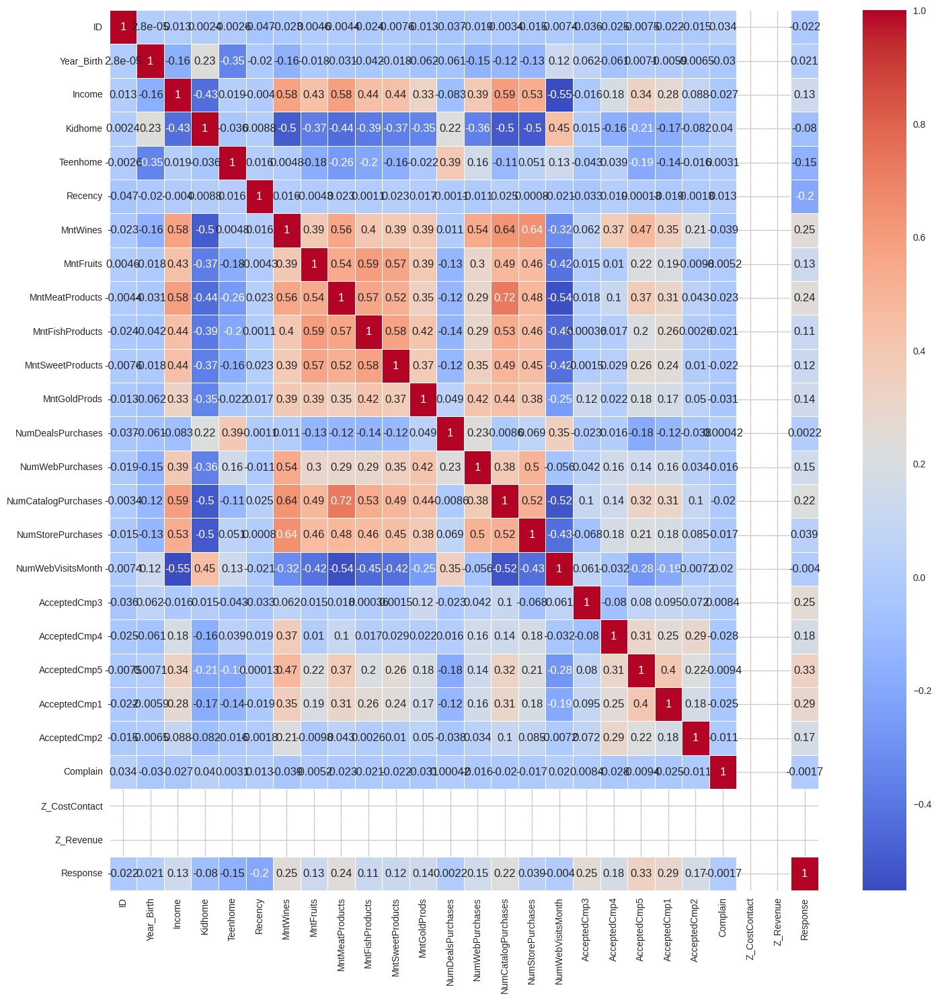

In [439]:
plt.figure(figsize=(17,17))
sns.heatmap(df.corr(numeric_only=True),annot=True,cmap='coolwarm',linewidths=0.5)
plt.show()

# UniVariate Analysis

In [440]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'],
      dtype='object')

In [441]:
df['ID'].nunique()

2240

In [442]:
df['Year_Birth']

,Year_Birth
0,1957
1,1954
2,1965
3,1984
4,1981
...,...
2235,1967
2236,1946
2237,1981
2238,1956


In [443]:
df['Year_Birth'].dtype

dtype('int64')

In [444]:
df['Year_Birth'].describe()

,Year_Birth
count,2240.000000
mean,1968.805804
std,11.984069
min,1893.000000
25%,1959.000000
50%,1970.000000
75%,1977.000000
max,1996.000000


In [445]:

df['Age']=datetime.now().year-df['Year_Birth']

In [446]:
df['Age'].head()

,Age
0,68
1,71
2,60
3,41
4,44


In [447]:
df['Age'].describe()

,Age
count,2240.000000
mean,56.194196
std,11.984069
min,29.000000
25%,48.000000
50%,55.000000
75%,66.000000
max,132.000000


In [448]:
df['Age'].dtype

dtype('int64')

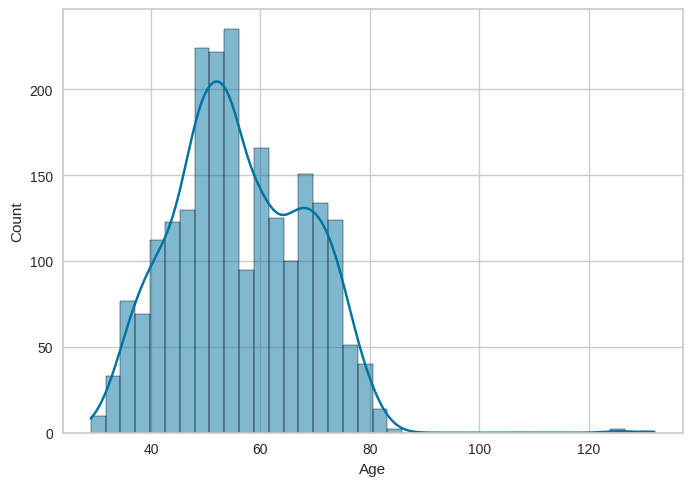

In [449]:
sns.histplot(df['Age'],kde=True)
plt.show()

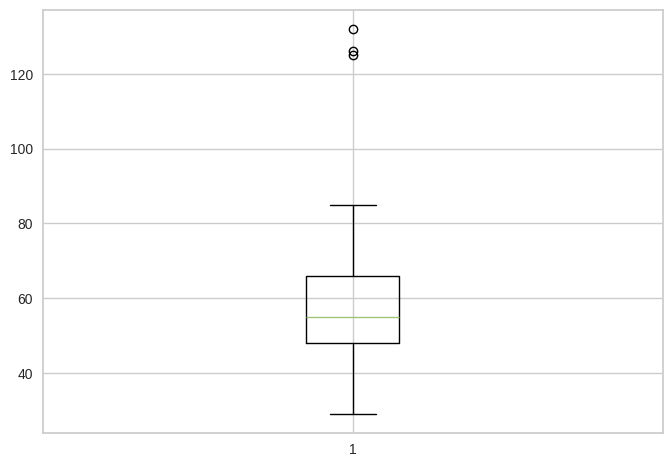

In [450]:
age_box=plt.boxplot(df['Age'])
plt.show()

In [451]:
age_out=[]
for i in age_box['fliers']:
    age_out.append(i.get_ydata())
age_out

[array([125, 132, 126])]

In [452]:
df[df['Age']>100]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age
192,7829,1900,2n Cycle,Divorced,36640.0,1,0,2013-09-26,99,15,...,0,0,0,0,0,1,3,11,0,125
239,11004,1893,2n Cycle,Single,60182.0,0,1,2014-05-17,23,8,...,0,0,0,0,0,0,3,11,0,132
339,1150,1899,PhD,Together,83532.0,0,0,2013-09-26,36,755,...,0,0,1,0,0,0,3,11,0,126


In [453]:
Q1 = df['Age'].quantile(0.25)
Q3 = df['Age'].quantile(0.75)
IQR = Q3 - Q1
# Define lower and upper limits
lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR
# Cap values
df['Age'] = np.where(df['Age'] > upper_limit, upper_limit,
           np.where(df['Age'] < lower_limit, lower_limit, df['Age']))

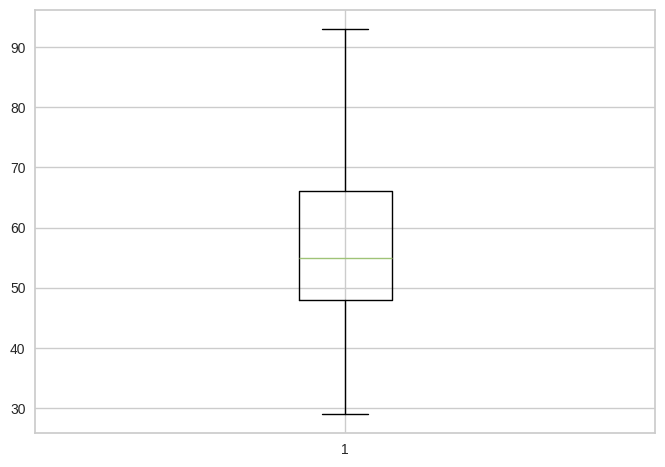

In [454]:
age_box=plt.boxplot(df['Age'])
plt.show()

In [455]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response',
       'Age'],
      dtype='object')

In [456]:
df['Education']

,Education
0,Graduation
1,Graduation
2,Graduation
3,Graduation
4,PhD
...,...
2235,Graduation
2236,PhD
2237,Graduation
2238,Master


In [457]:
df['Education'].unique()

array(['Graduation', 'PhD', 'Master', 'Basic', '2n Cycle'], dtype=object)

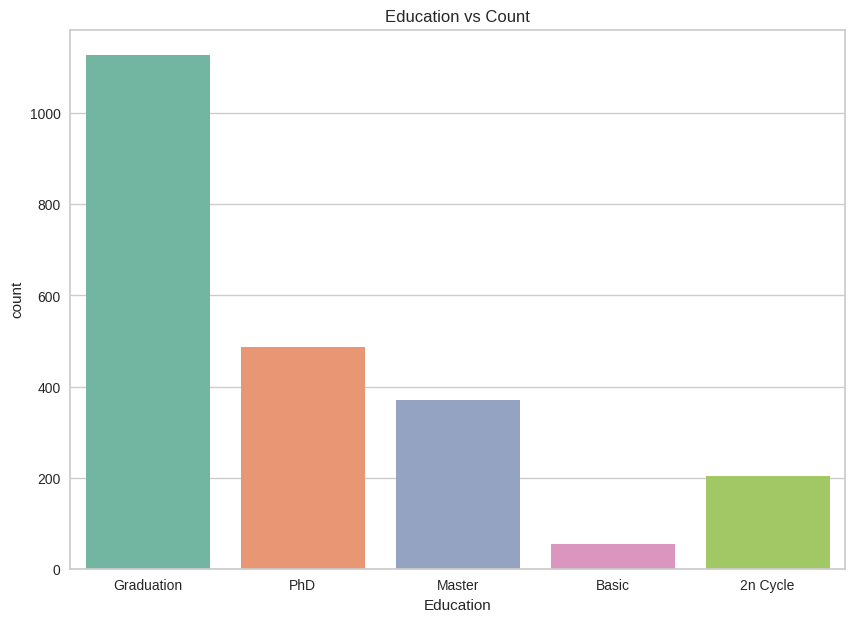

In [458]:
plt.figure(figsize=(10,7))
sns.countplot(x='Education',data=df,palette='Set2')
plt.title('Education vs Count')
plt.show()

In [459]:
df['Marital_Status'].unique()

array(['Single', 'Together', 'Married', 'Divorced', 'Widow', 'Alone',
       'Absurd', 'YOLO'], dtype=object)

In [460]:
df['Marital_Status'].value_counts()

,count
Marital_Status,
Married,864
Together,580
Single,480
Divorced,232
Widow,77
Alone,3
Absurd,2
YOLO,2


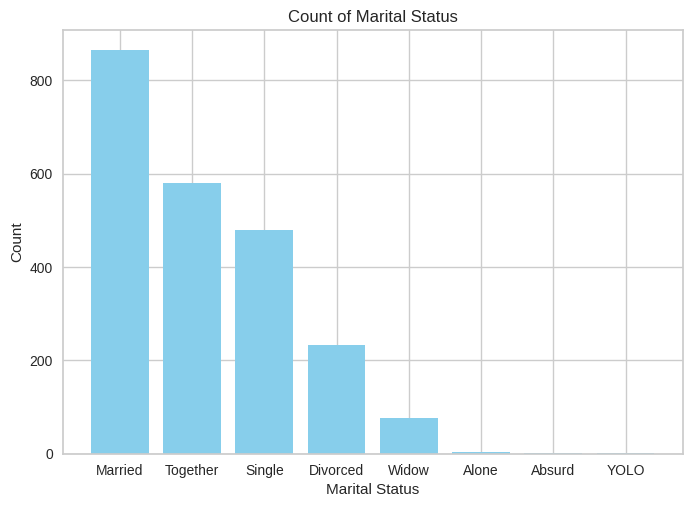

In [461]:
counts = df['Marital_Status'].value_counts()
plt.bar(counts.index, counts.values, color='skyblue')
plt.title('Count of Marital Status')
plt.xlabel('Marital Status')
plt.ylabel('Count')
plt.show()

In [462]:
df['Marital_Status'] = df['Marital_Status'].replace({
    'Alone': 'Single',       # treat alone as single
    'Absurd': np.nan,        # invalid
    'YOLO': np.nan           # invalid
})

In [463]:
df['Marital_Status'].unique()

array(['Single', 'Together', 'Married', 'Divorced', 'Widow', nan],
      dtype=object)

In [464]:
df['Marital_Status'].isnull().sum()

np.int64(4)

In [465]:
df['Marital_Status'].value_counts()

,count
Marital_Status,
Married,864
Together,580
Single,483
Divorced,232
Widow,77


In [466]:
mar_mode=df['Marital_Status'].mode()[0]
mar_mode

'Married'

In [467]:
df['Marital_Status']=df['Marital_Status'].fillna(mar_mode)

In [468]:
df['Marital_Status'].isnull().sum()

np.int64(0)

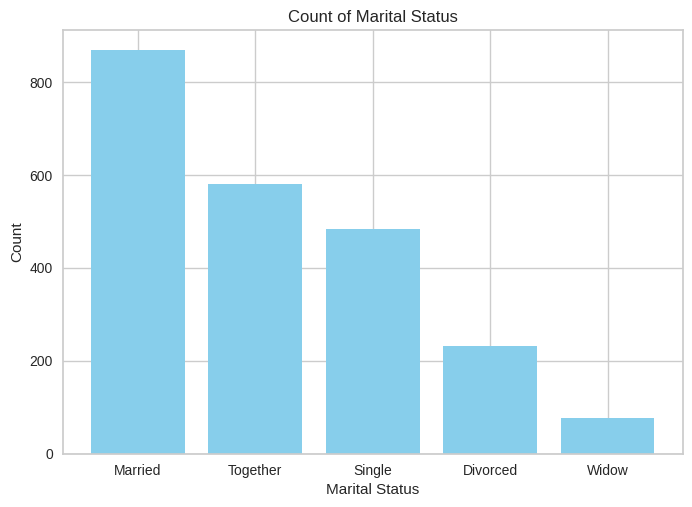

In [469]:
counts = df['Marital_Status'].value_counts()
plt.bar(counts.index, counts.values, color='skyblue')
plt.title('Count of Marital Status')
plt.xlabel('Marital Status')
plt.ylabel('Count')
plt.show()

In [470]:
df['Income'].head()

,Income
0,58138.0
1,46344.0
2,71613.0
3,26646.0
4,58293.0


In [471]:
df['Income'].dtype

dtype('float64')

In [472]:
df['Income'].describe()

,Income
count,2216.000000
mean,52247.251354
std,25173.076661
min,1730.000000
25%,35303.000000
50%,51381.500000
75%,68522.000000
max,666666.000000


In [473]:
df['Income'].isnull().sum()

np.int64(24)

In [474]:
edu=df.groupby('Education')['Income'].agg(['min','max','mean']).reset_index()
print(edu)

    Education     min       max          mean
0    2n Cycle  7500.0   96547.0  47633.190000
1       Basic  7500.0   34445.0  20306.259259
2  Graduation  1730.0  666666.0  52720.373656
3      Master  6560.0  157733.0  52917.534247
4         PhD  4023.0  162397.0  56145.313929


In [475]:
# Group by Martial Status and find Min & Max Income
result = df.groupby('Marital_Status').agg(
    Min_Salary=('Income', 'min'),
    Max_Salary=('Income', 'max'),
    mean_salary=('Income','mean')
).reset_index()

print(result)

  Marital_Status  Min_Salary  Max_Salary   mean_salary
0       Divorced      1730.0    153924.0  52834.228448
1        Married      2447.0    160803.0  51765.275261
2         Single      3502.0    113734.0  50949.740506
3       Together      5648.0    666666.0  53245.534031
4          Widow     22123.0     85620.0  56481.552632


In [476]:
result = df.groupby(['Marital_Status', 'Education']).agg(
    Min_Income=('Income', 'min'),
    Max_Income=('Income', 'max'),
    Mean_Income=('Income', 'mean'),
    Median_Income=('Income', 'median')
).reset_index()
print(result)

   Marital_Status   Education  Min_Income  Max_Income   Mean_Income  \
0        Divorced    2n Cycle     11448.0     87305.0  49395.130435   
1        Divorced       Basic      9548.0      9548.0   9548.000000   
2        Divorced  Graduation      1730.0    153924.0  54526.042017   
3        Divorced      Master     10979.0     81380.0  50331.945946   
4        Divorced         PhD     14849.0     90687.0  53096.615385   
5         Married    2n Cycle      7500.0     96547.0  46201.100000   
6         Married       Basic      7500.0     34445.0  21960.500000   
7         Married  Graduation      2447.0     94642.0  50866.406977   
8         Married      Master      7500.0     92163.0  53373.805755   
9         Married         PhD      4023.0    160803.0  58036.927083   
10         Single    2n Cycle     23331.0     89572.0  53673.944444   
11         Single       Basic      7500.0     26868.0  18238.666667   
12         Single  Graduation      3502.0    101970.0  51252.765182   
13    

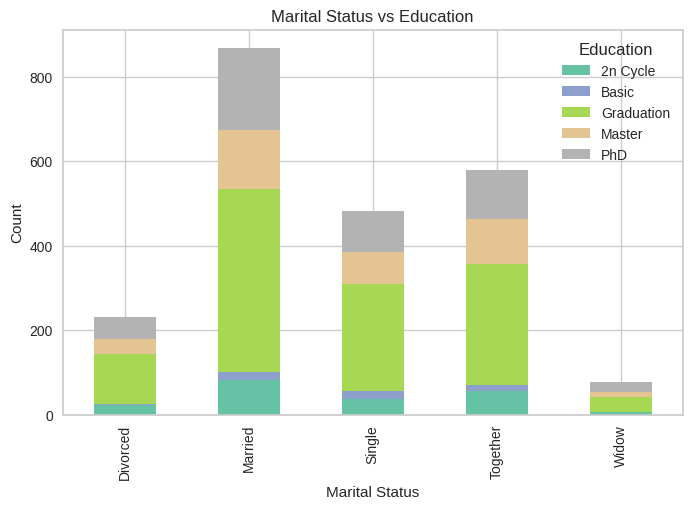

In [477]:
cross_tab = pd.crosstab(df['Marital_Status'], df['Education'])
cross_tab.plot(kind='bar', stacked=True, figsize=(8,5), colormap='Set2')
plt.title('Marital Status vs Education')
plt.xlabel('Marital Status')
plt.ylabel('Count')
plt.show()


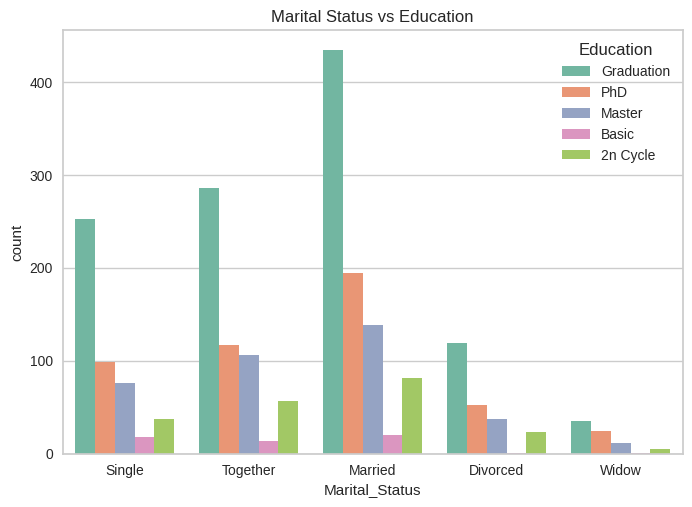

In [478]:
sns.countplot(x='Marital_Status', hue='Education', data=df, palette='Set2')
plt.title('Marital Status vs Education')
plt.show()

In [479]:
df['Income'].isnull().sum()

np.int64(24)

In [480]:
# Fill NaN in Income with the mean income for each Marital_Status + Education group
df['Income'] = df['Income'].fillna(
    df.groupby(['Marital_Status', 'Education'])['Income'].transform('mean')
)

In [481]:
df['Income'].isnull().sum()

np.int64(0)

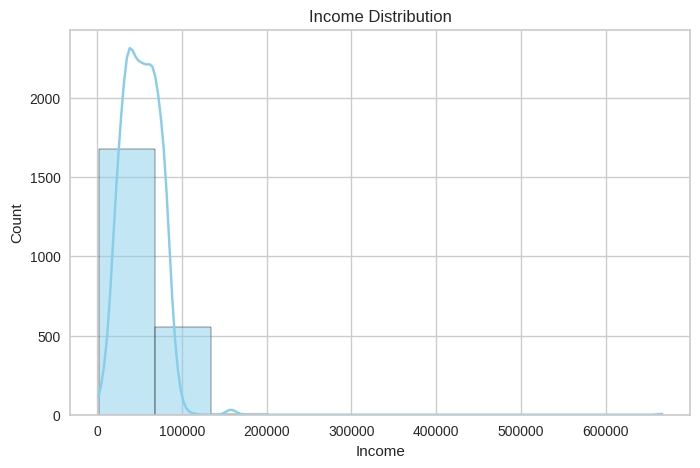

In [482]:
plt.figure(figsize=(8,5))
sns.histplot(df['Income'],bins=10, kde=True, color='skyblue')
plt.title('Income Distribution')
plt.xlabel('Income')
plt.ylabel('Count')
plt.show()

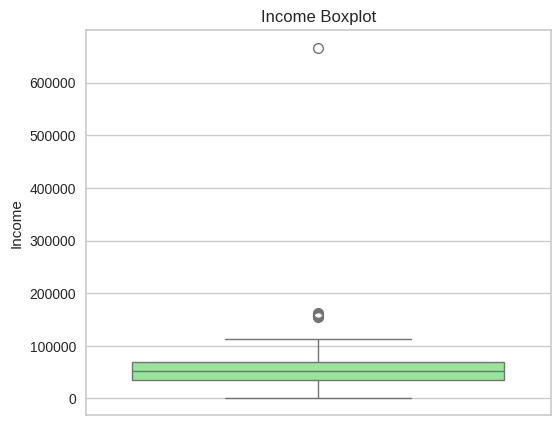

In [483]:
plt.figure(figsize=(6,5))
sns.boxplot(y=df['Income'], color='lightgreen')
plt.title('Income Boxplot')
plt.ylabel('Income')
plt.show()


In [484]:
Q1=df['Income'].quantile(0.25)
Q3=df['Income'].quantile(0.75)
IQR=Q3-Q1
lower_bound=Q1-1.5*IQR
upper_bound=Q3+1.5*IQR

In [485]:
print(lower_bound)
print(upper_bound)

-13587.75
117416.25


In [486]:
# Income can't be negative So
lower_bound=0

In [487]:
income_box=df[(df['Income']<lower_bound) | (df['Income']>upper_bound)]
income_box['Income']

,Income
164,157243.0
617,162397.0
655,153924.0
687,160803.0
1300,157733.0
1653,157146.0
2132,156924.0
2233,666666.0


In [488]:
len(income_box)

8

In [489]:
# As per the dataset is about the customers can have income ~ 150000-200000
# So we are going to cap the values that are greater than 200000

In [490]:
df.loc[df['Income']>=upper_bound,'Income'] = upper_bound

In [491]:
df['Income'].describe()

,Income
count,2240.000000
mean,51876.329177
std,20938.680462
min,1730.000000
25%,35538.750000
50%,51381.500000
75%,68289.750000
max,117416.250000


In [492]:
df['Income'].skew()

np.float64(0.08851124379950276)

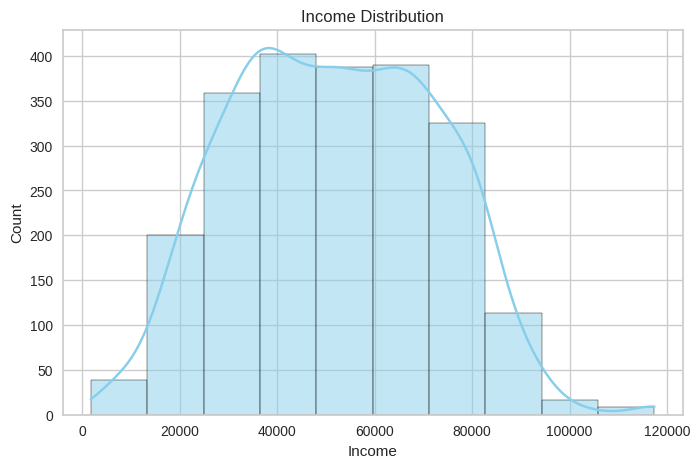

In [493]:
plt.figure(figsize=(8,5))
sns.histplot(df['Income'], bins=10, kde=True, color='skyblue')
plt.title('Income Distribution')
plt.xlabel('Income')
plt.ylabel('Count')
plt.show()

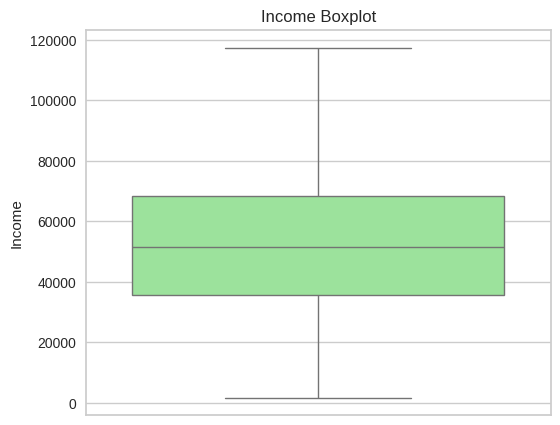

In [494]:
plt.figure(figsize=(6,5))
sns.boxplot(y=df['Income'], color='lightgreen')
plt.title('Income Boxplot')
plt.ylabel('Income')
plt.show()


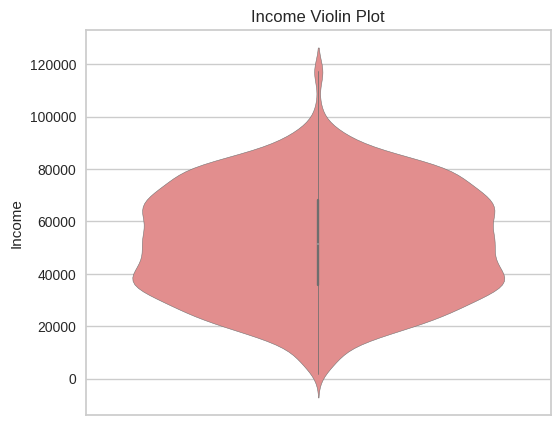

In [495]:
plt.figure(figsize=(6,5))
sns.violinplot(y=df['Income'], color='lightcoral')
plt.title('Income Violin Plot')
plt.show()

In [496]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response',
       'Age'],
      dtype='object')

In [497]:
df['Kidhome'].head()

,Kidhome
0,0
1,1
2,0
3,1
4,1


In [498]:
df['Kidhome'].dtype

dtype('int64')

In [499]:
df['Kidhome']=df['Kidhome'].astype('int64')

In [500]:
df['Kidhome'].dtype

dtype('int64')

In [501]:
df['Kidhome'].value_counts()

,count
Kidhome,
0,1293
1,899
2,48


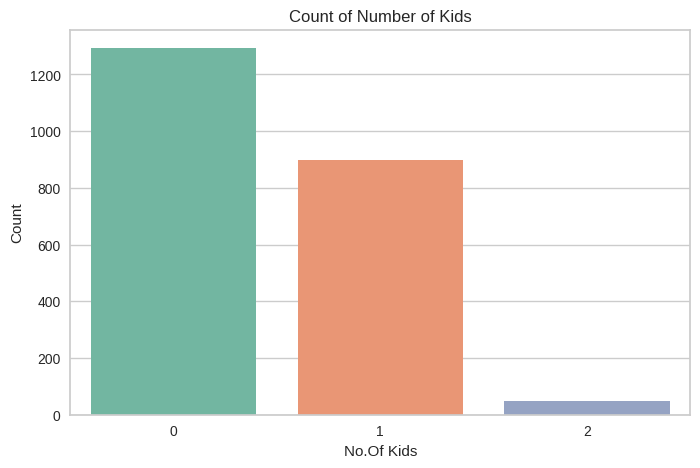

In [502]:
# Vertical countplot
plt.figure(figsize=(8,5))
sns.countplot(x='Kidhome', data=df, palette='Set2')
plt.title('Count of Number of Kids')
plt.xlabel('No.Of Kids')
plt.ylabel('Count')
plt.show()

In [503]:
df['Teenhome'].head()

,Teenhome
0,0
1,1
2,0
3,0
4,0


In [504]:
df['Teenhome'].dtype

dtype('int64')

In [505]:
df['Teenhome']=df['Teenhome'].astype('int64')

In [506]:
df['Teenhome'].dtype

dtype('int64')

In [507]:
df['Teenhome'].value_counts()

,count
Teenhome,
0,1158
1,1030
2,52


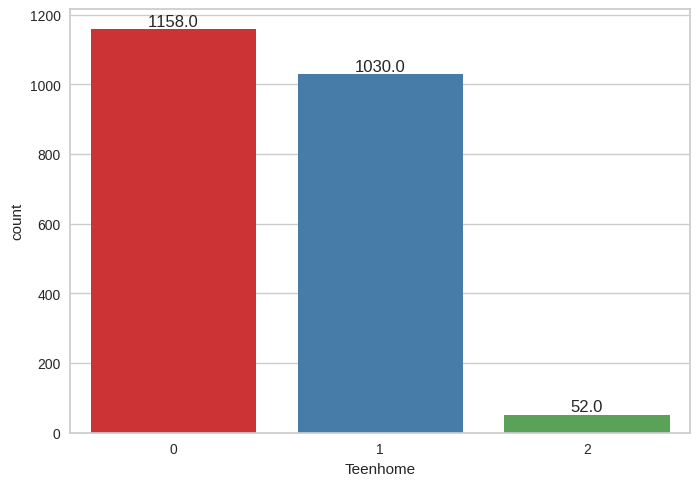

In [508]:
ax = sns.countplot(x='Teenhome', data=df, palette='Set1')
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width()/2., p.get_height()),
                ha='center', va='bottom')
plt.show()


In [509]:
# Define a function for FamilySize
def calculate_family_size(row):
    base = row['Kidhome'] + row['Teenhome']
    if row['Marital_Status'] in ['Single','Divorced','Widow']:
        return base + 1
    elif row['Marital_Status'] in ['Together', 'Married']:
        return base + 2
# Apply function row-wise
df['FamilySize'] = df.apply(calculate_family_size, axis=1)
# Check
print(df[['Kidhome','Teenhome','Marital_Status','FamilySize']].head())

   Kidhome  Teenhome Marital_Status  FamilySize
0        0         0         Single           1
1        1         1         Single           3
2        0         0       Together           2
3        1         0       Together           3
4        1         0        Married           3


In [510]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response',
       'Age', 'FamilySize'],
      dtype='object')

In [511]:
# Date the customer enrolled or became a client.
df['Dt_Customer']

,Dt_Customer
0,2012-09-04
1,2014-03-08
2,2013-08-21
3,2014-02-10
4,2014-01-19
...,...
2235,2013-06-13
2236,2014-06-10
2237,2014-01-25
2238,2014-01-24


In [512]:
df['Dt_Customer'].dtype

dtype('<M8[ns]')

In [513]:
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], errors='coerce')

In [514]:
df['Dt_Customer'].describe()

,Dt_Customer
count,2240
mean,2013-07-10 10:01:42.857142784
min,2012-07-30 00:00:00
25%,2013-01-16 00:00:00
50%,2013-07-08 12:00:00
75%,2013-12-30 06:00:00
max,2014-06-29 00:00:00


In [515]:
#Number of days since the customer’s last purchase
df['Recency']

,Recency
0,58
1,38
2,26
3,26
4,94
...,...
2235,46
2236,56
2237,91
2238,8


In [516]:
df['Recency'].dtype

dtype('int64')

In [517]:
df['Recency'].describe()

,Recency
count,2240.000000
mean,49.109375
std,28.962453
min,0.000000
25%,24.000000
50%,49.000000
75%,74.000000
max,99.000000


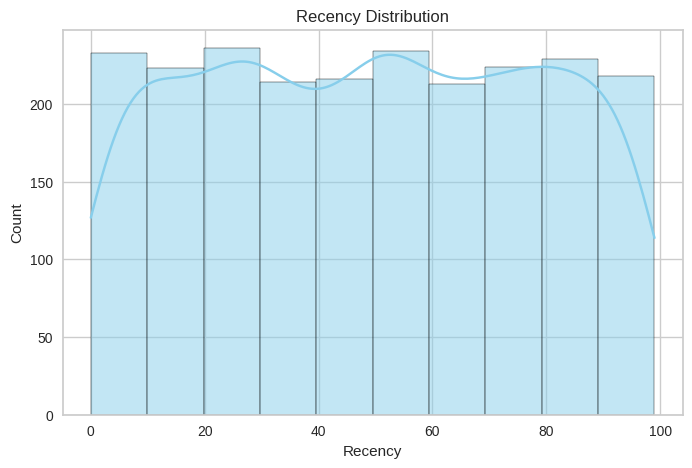

In [518]:
plt.figure(figsize=(8,5))
sns.histplot(df['Recency'], bins=10, kde=True, color='skyblue')
plt.title('Recency Distribution')
plt.xlabel('Recency')
plt.ylabel('Count')
plt.show()

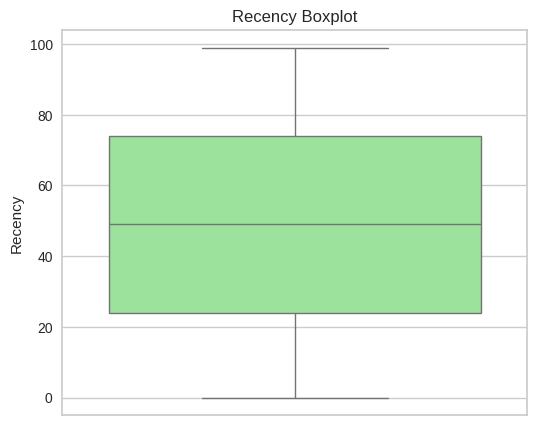

In [519]:
plt.figure(figsize=(6,5))
sns.boxplot(y=df['Recency'], color='lightgreen')
plt.title('Recency Boxplot')
plt.ylabel('Recency')
plt.show()


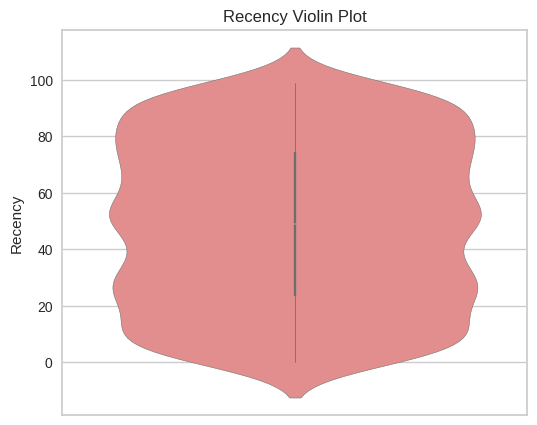

In [520]:
plt.figure(figsize=(6,5))
sns.violinplot(y=df['Recency'], color='lightcoral')
plt.title('Recency Violin Plot')
plt.show()


In [521]:
Q1=df['Recency'].quantile(0.25)
Q3=df['Recency'].quantile(0.75)
IQR=Q3-Q1
lower_bound=0
upper_bound=Q3+1.5*IQR

In [522]:
print(lower_bound,upper_bound)

0 149.0


In [523]:
outliers=df[(df['Recency']<lower_bound) | (df['Recency']>upper_bound)]

In [524]:
outliers # Since there are no outliers

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,FamilySize


In [525]:
# amount spent on the Wines
df['MntWines']

,MntWines
0,635
1,11
2,426
3,11
4,173
...,...
2235,709
2236,406
2237,908
2238,428


In [526]:
df['MntWines'].dtype

dtype('int64')

In [527]:
df['MntWines'].describe()

,MntWines
count,2240.000000
mean,303.935714
std,336.597393
min,0.000000
25%,23.750000
50%,173.500000
75%,504.250000
max,1493.000000


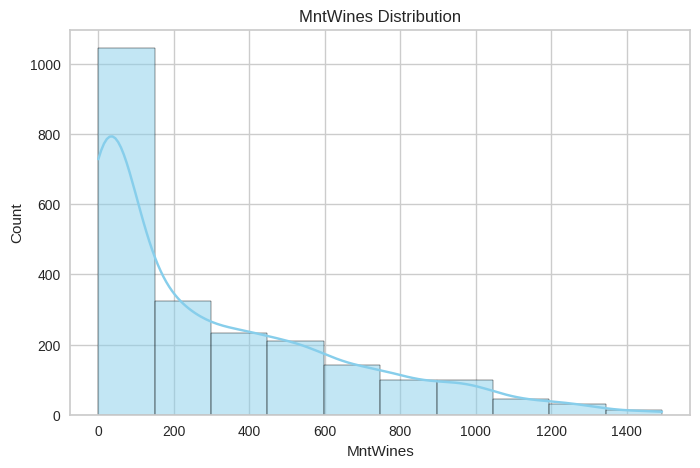

In [528]:
plt.figure(figsize=(8,5))
sns.histplot(df['MntWines'], bins=10, kde=True, color='skyblue')
plt.title('MntWines Distribution')
plt.xlabel('MntWines')
plt.ylabel('Count')
plt.show()
# Right skewed(+ve Skew

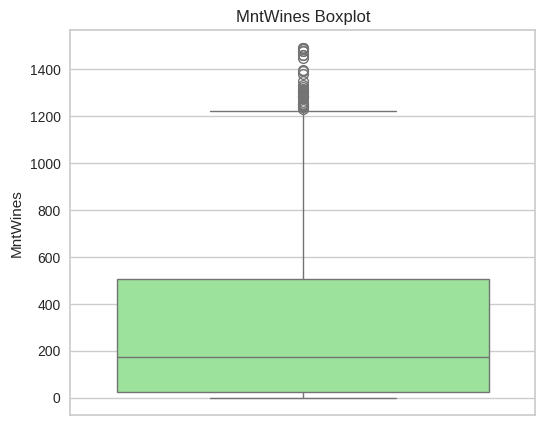

In [529]:
plt.figure(figsize=(6,5))
sns.boxplot(y=df['MntWines'], color='lightgreen')
plt.title('MntWines Boxplot')
plt.ylabel('MntWines')
plt.show()


In [530]:
df['MntWines'].skew()

np.float64(1.1757705637550502)

In [531]:
df['MntWines_transformed']=np.sqrt(df['MntWines'])

In [532]:
df['MntWines_transformed'].skew()

np.float64(0.39351239091266954)

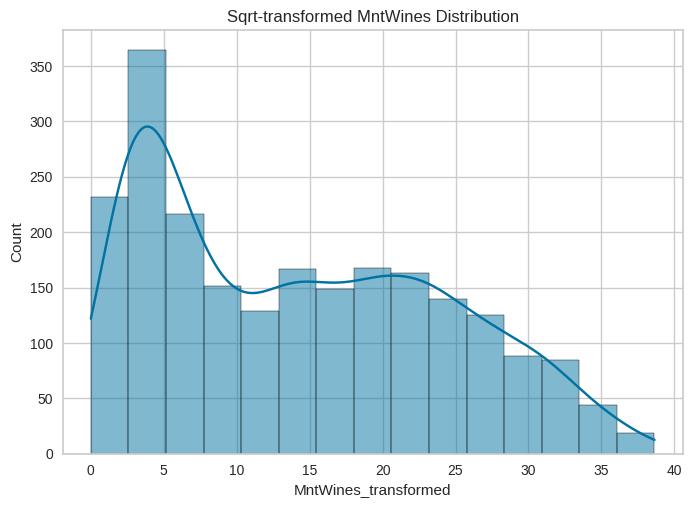

In [533]:
sns.histplot(df['MntWines_transformed'], kde=True)
plt.title('Sqrt-transformed MntWines Distribution')
plt.show()


In [534]:
df['MntWines_transformed'].describe()

,MntWines_transformed
count,2240.000000
mean,14.301935
std,9.971698
min,0.000000
25%,4.873192
50%,13.171926
75%,22.455510
max,38.639358


In [535]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response',
       'Age', 'FamilySize', 'MntWines_transformed'],
      dtype='object')

In [536]:
# Amount spent on fruits.
df['MntFruits']

,MntFruits
0,88
1,1
2,49
3,4
4,43
...,...
2235,43
2236,0
2237,48
2238,30


In [537]:
df['MntFruits'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2240 entries, 0 to 2239
Series name: MntFruits
Non-Null Count  Dtype
--------------  -----
2240 non-null   int64
dtypes: int64(1)
memory usage: 17.6 KB


In [538]:
df['MntFruits'].describe()

,MntFruits
count,2240.000000
mean,26.302232
std,39.773434
min,0.000000
25%,1.000000
50%,8.000000
75%,33.000000
max,199.000000


In [539]:
df['MntFruits'].dtype

dtype('int64')

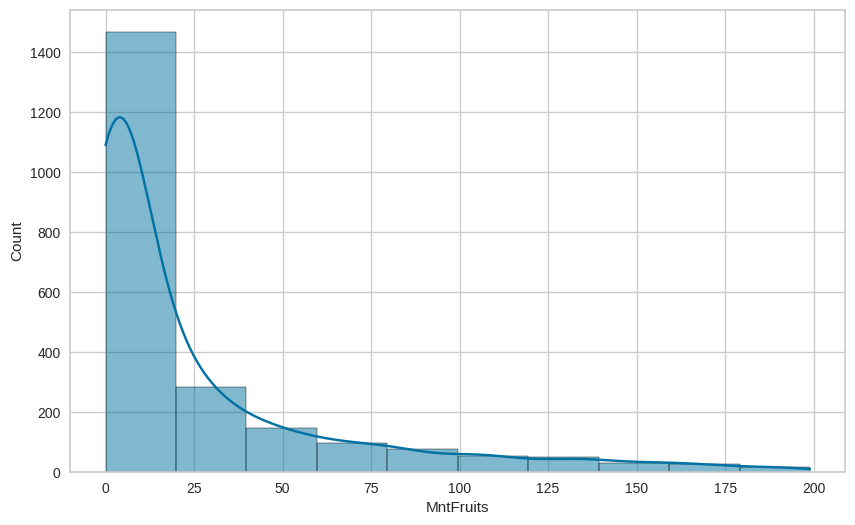

In [540]:
plt.figure(figsize=(10,6))
sns.histplot(df['MntFruits'],bins=10,kde=True)
plt.show()

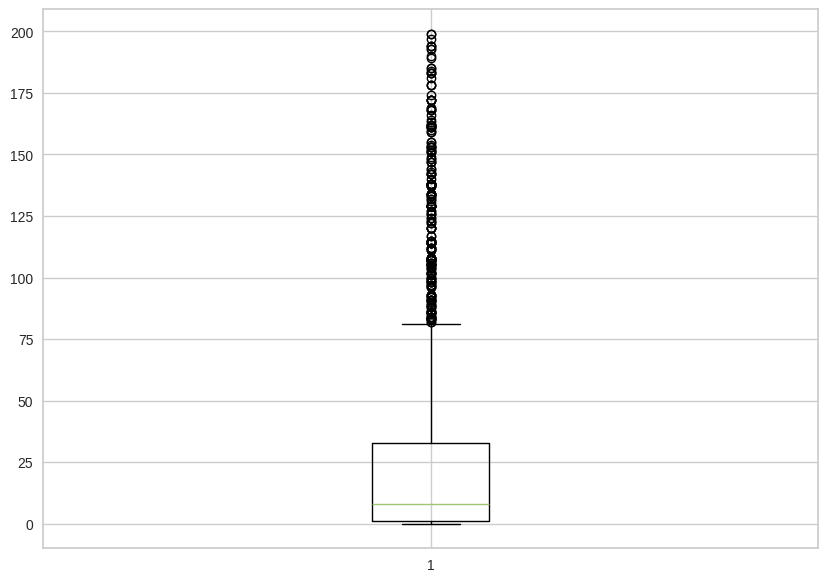

In [541]:
plt.figure(figsize=(10,7))
fruits_box=plt.boxplot(df['MntFruits'])
plt.show()

In [542]:

# saving the outliers in a list
out=[]
for i in fruits_box['fliers']:
    out.append(i.get_ydata())
out

[array([ 88, 100, 164, 120, 107, 111, 105, 172, 106, 194, 115,  99,  90,
        133, 106, 162, 189, 138,  86, 114, 153, 134, 148,  84, 162, 129,
         98, 183, 129, 147, 138, 153, 144, 104,  91, 163, 134, 152, 105,
        114, 137, 190,  96,  84, 162, 138,  83,  92, 134, 155, 151,  85,
        129, 153, 129, 183, 127,  91, 107, 129, 103,  89, 105, 181, 112,
        159, 134, 102,  86, 123, 166, 142, 133, 178,  93, 107,  97, 115,
        168,  91, 148, 174, 122, 123,  91, 199, 102, 138, 101,  92,  99,
        111, 152,  86,  98,  85, 107, 137, 138, 168,  93, 114,  98, 172,
         96, 114,  83, 117, 114, 178, 108, 130, 161, 138, 124, 126, 105,
         83, 120, 142, 104, 100,  83, 106, 161, 185, 147, 112, 162,  86,
        108, 161, 129,  93,  93, 172,  87, 168, 151, 102,  84, 199,  97,
        127,  89, 172, 161, 104, 197, 137, 111,  98, 194,  82, 184,  88,
         99, 120, 160, 107, 108, 185, 115,  96, 133, 112, 140, 107, 107,
        102, 117, 131,  91, 126, 129, 147,  97, 132

In [543]:
len(out[0])

227

In [544]:
df['MntFruits'].skew()

np.float64(2.1020633046228268)

In [545]:
df['MntFruits_transformed']=np.log1p(df['MntFruits'])

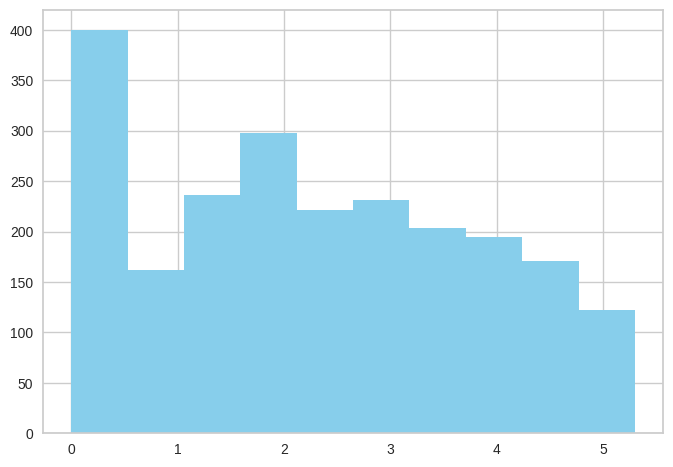

In [546]:
plt.hist(df['MntFruits_transformed'],bins=10,color='skyblue')
plt.show()

In [547]:
df['MntFruits_transformed'].skew()

np.float64(0.08385812808822958)

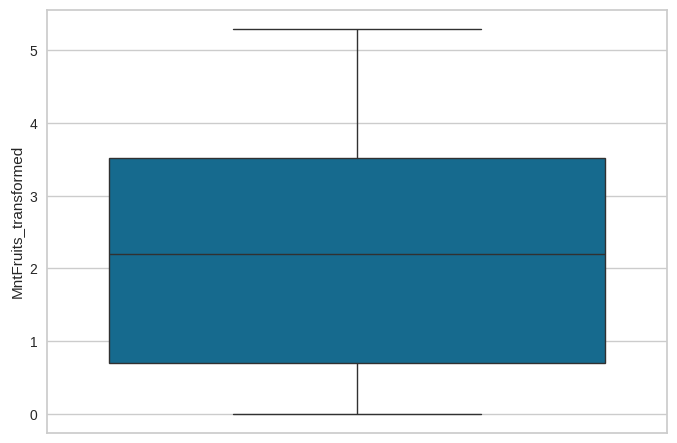

In [548]:
sns.boxplot(df['MntFruits_transformed'])
plt.show()

In [549]:
df['MntFruits_transformed'].describe()

,MntFruits_transformed
count,2240.000000
mean,2.238966
std,1.570430
min,0.000000
25%,0.693147
50%,2.197225
75%,3.526361
max,5.298317


In [550]:
# Amount spent on meat products.
df['MntMeatProducts']

,MntMeatProducts
0,546
1,6
2,127
3,20
4,118
...,...
2235,182
2236,30
2237,217
2238,214


In [551]:
df['MntMeatProducts'].describe()

,MntMeatProducts
count,2240.000000
mean,166.950000
std,225.715373
min,0.000000
25%,16.000000
50%,67.000000
75%,232.000000
max,1725.000000


In [552]:
df['MntMeatProducts'].dtype

dtype('int64')

In [553]:
df['MntMeatProducts'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2240 entries, 0 to 2239
Series name: MntMeatProducts
Non-Null Count  Dtype
--------------  -----
2240 non-null   int64
dtypes: int64(1)
memory usage: 17.6 KB


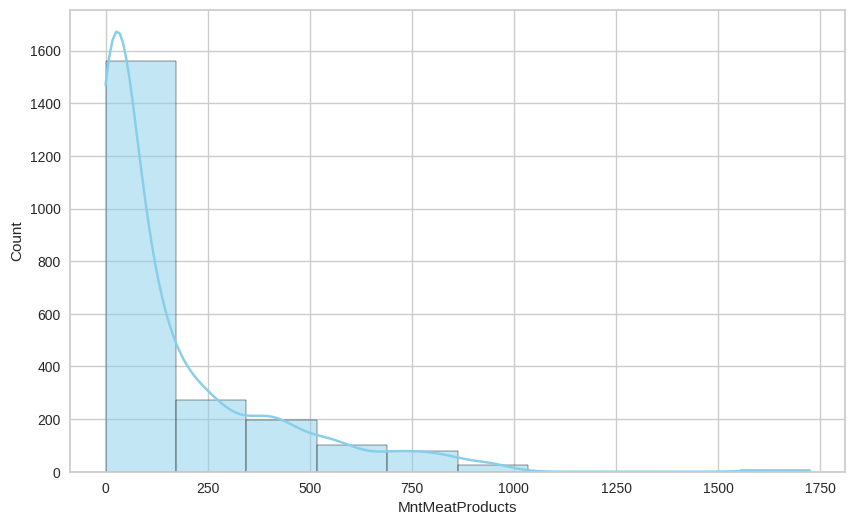

In [554]:
plt.figure(figsize=(10,6))
sns.histplot(x=df['MntMeatProducts'],bins=10,kde=True,color='skyblue')
plt.show()

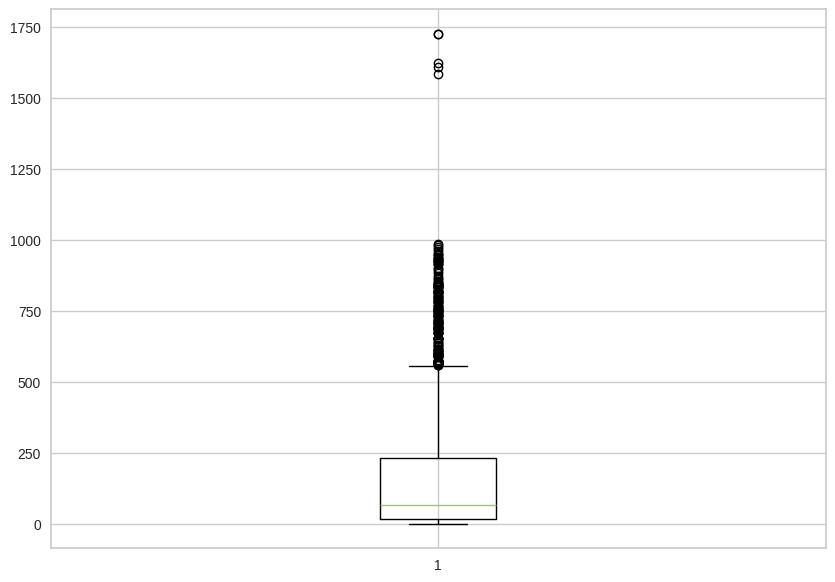

In [555]:
plt.figure(figsize=(10,7))
meat_box=plt.boxplot(df['MntMeatProducts'])
plt.show()

In [556]:
df['MntMeatProducts'].skew()

np.float64(2.083233112943474)

In [557]:
meat_out=[]
for i in meat_box['fliers']:
    meat_out.append(i.get_ydata())
print(len(meat_out[0]))
meat_out

175


[array([1725,  801,  780,  925,  779,  568,  690,  812,  951,  590,  921,
         756, 1582,  813,  740,  757,  768,  565,  573,  561,  570,  562,
         832,  785,  818,  815,  786,  591,  716,  792,  974,  594,  613,
         670,  925,  761,  940,  797,  635,  592,  572,  732,  713,  653,
         758,  711,  838, 1622,  559,  597,  706,  617,  742,  689,  898,
         706,  597,  747,  804,  774,  929,  845,  569,  838,  685,  873,
         674,  890,  704,  606,  790,  925,  651,  708,  640,  733,  961,
         568,  780,  678,  842,  843,  711,  818,  864,  750,  731,  604,
         915,  689,  801,  913,  946,  672,  611,  687,  842,  622,  790,
         717,  573,  984,  694,  595,  672,  573,  601,  731,  717,  687,
         815,  706,  724,  827,  560,  701,  915,  639,  573,  625,  649,
         832,  575,  599, 1725,  768,  673,  850,  835,  936,  935,  853,
         558,  751,  693,  629,  981,  586,  565,  697,  736,  602,  590,
         899,  816,  603,  754,  835, 

In [558]:
df['MntMeatProducts_transformed']=np.log1p(df['MntMeatProducts'])

In [559]:
df['MntMeatProducts_transformed'].skew()

np.float64(-0.08269187787516818)

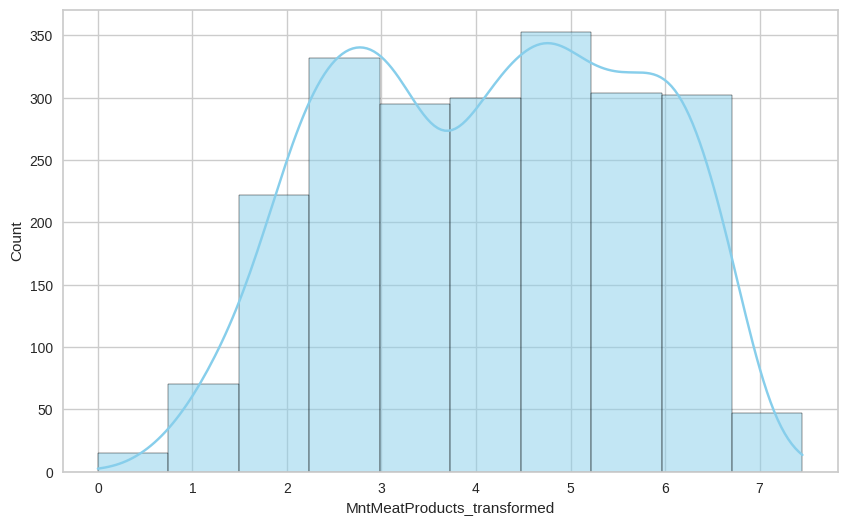

In [560]:
plt.figure(figsize=(10,6))
sns.histplot(x=df['MntMeatProducts_transformed'],bins=10,kde=True,color='skyblue')
plt.show()

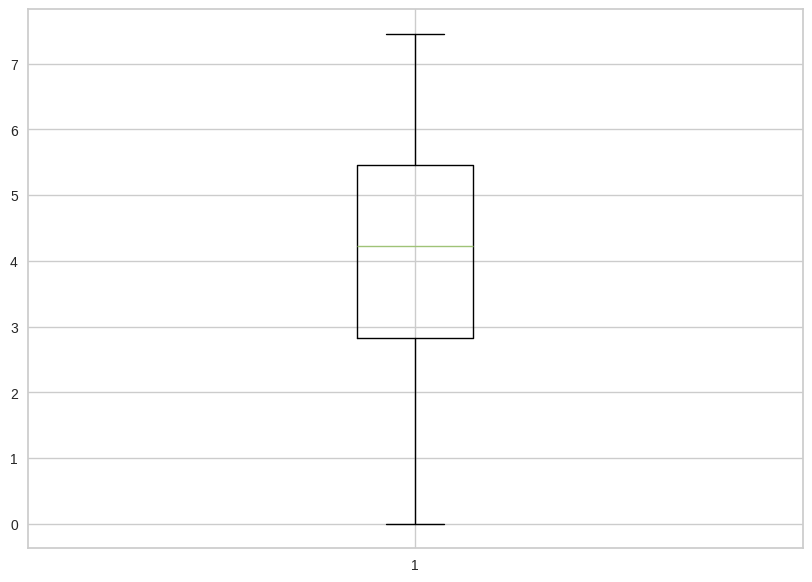

In [561]:
plt.figure(figsize=(10,7))
meat_box=plt.boxplot(df['MntMeatProducts_transformed'])
plt.show()

In [562]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response',
       'Age', 'FamilySize', 'MntWines_transformed', 'MntFruits_transformed',
       'MntMeatProducts_transformed'],
      dtype='object')

In [563]:
df['MntFishProducts']

,MntFishProducts
0,172
1,2
2,111
3,10
4,46
...,...
2235,42
2236,0
2237,32
2238,80


In [564]:
df['MntFishProducts'].describe()

,MntFishProducts
count,2240.000000
mean,37.525446
std,54.628979
min,0.000000
25%,3.000000
50%,12.000000
75%,50.000000
max,259.000000


In [565]:
df['MntFishProducts'].dtype

dtype('int64')

In [566]:
df['MntFishProducts'].skew()

np.float64(1.9197689706698498)

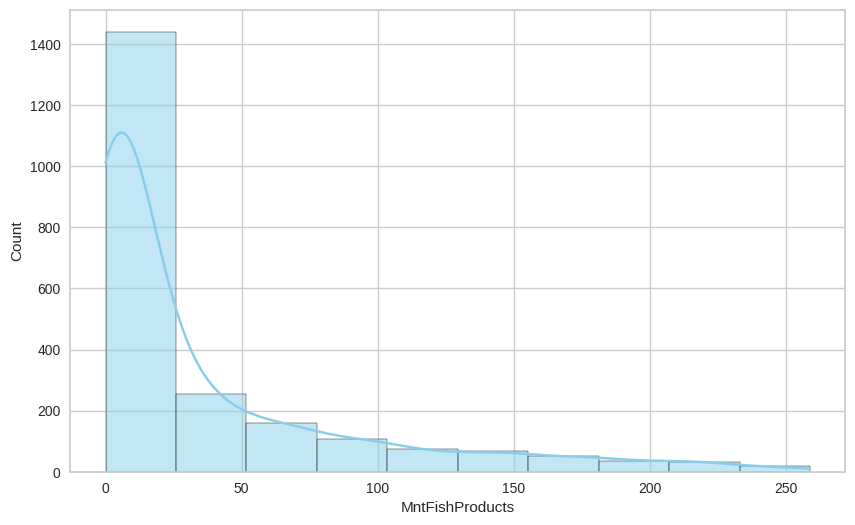

In [567]:
plt.figure(figsize=(10,6))
sns.histplot(x=df['MntFishProducts'],bins=10,kde=True,color='skyblue')
plt.show()

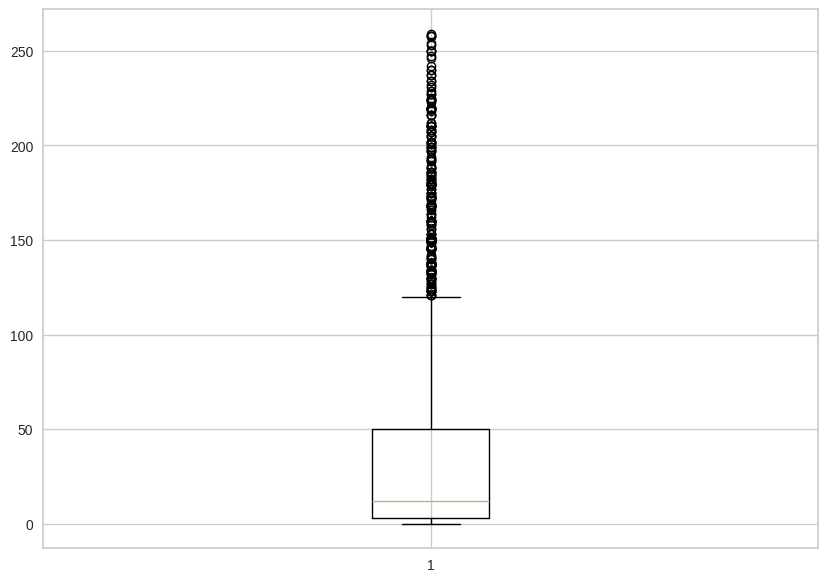

In [568]:
plt.figure(figsize=(10,7))
fish_box=plt.boxplot(df['MntFishProducts'])
plt.show()

<Axes: ylabel='MntFishProducts'>

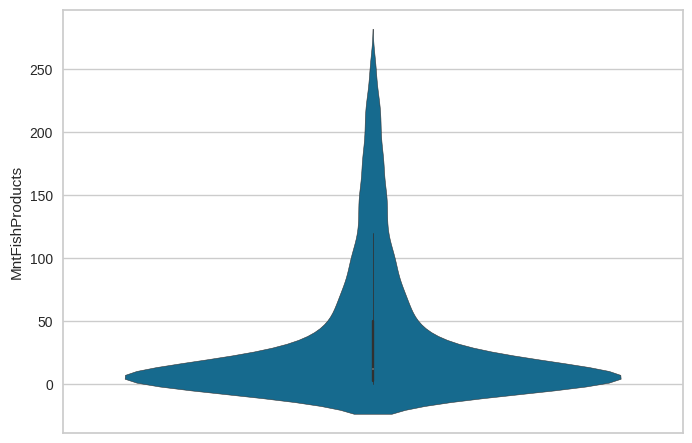

In [569]:
sns.violinplot(df['MntFishProducts'])

In [570]:
fish_out=[]
for i in fish_box['fliers']:
    fish_out.append(i.get_ydata())
fish_out

[array([172, 225, 150, 160, 227, 156, 180, 121, 201, 189, 137, 185, 151,
        123, 173, 149, 134, 173, 140, 147, 224, 254, 180, 186, 218, 133,
        150, 220, 205, 162, 188, 150, 150, 166, 216, 219, 151, 172, 212,
        129, 151, 137, 156, 179, 179, 149, 197, 220, 199, 205, 169, 240,
        146, 224, 127, 136, 168, 132, 147, 231, 168, 202, 125, 175, 179,
        133, 121, 172, 164, 177, 138, 138, 175, 247, 127, 150, 227, 159,
        153, 123, 134, 202, 234, 210, 133, 168, 160, 160, 194, 250, 138,
        146, 220, 237, 250, 145, 167, 160, 150, 168, 192, 180, 137, 130,
        232, 132, 125, 168, 132, 145, 184, 134, 240, 186, 125, 219, 237,
        123, 138, 158, 216, 259, 168, 219, 186, 151, 145, 133, 137, 207,
        160, 210, 172, 182, 141, 182, 124, 171, 193, 160, 130, 242, 175,
        180, 246, 188, 210, 234, 197, 210, 197, 219, 149, 149, 185, 142,
        140, 253, 169, 220, 258, 134, 123, 146, 258, 179, 207, 198, 153,
        141, 168, 138, 223, 151, 258, 188, 145, 224

In [571]:
len(fish_out[0])

223

In [572]:
df['MntFishProducts_transformed']=np.log1p(df['MntFishProducts'])


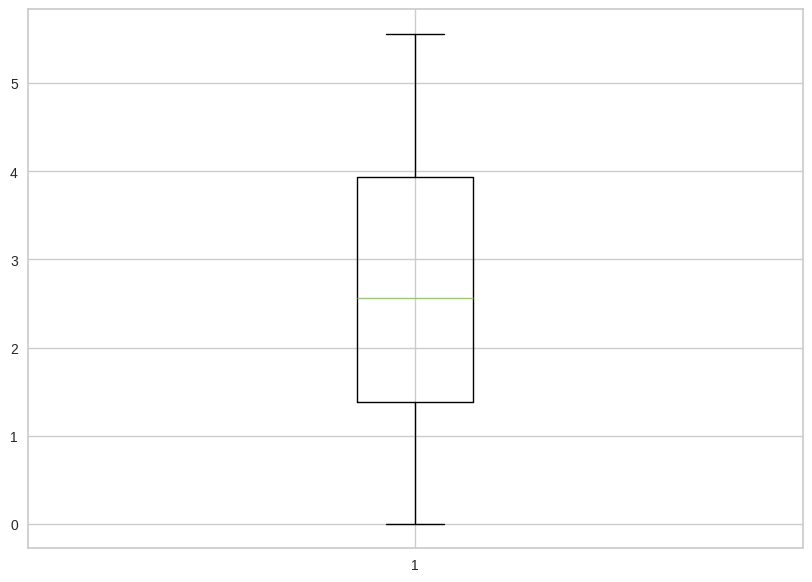

In [573]:
plt.figure(figsize=(10,7))
fish_box=plt.boxplot(df['MntFishProducts_transformed'])
plt.show()

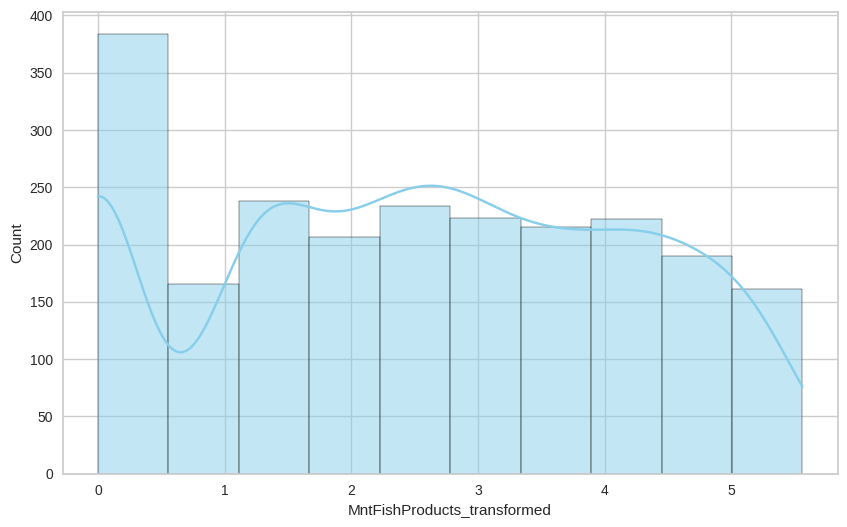

In [574]:
plt.figure(figsize=(10,6))
sns.histplot(x=df['MntFishProducts_transformed'],bins=10,kde=True,color='skyblue')
plt.show()

In [575]:
df['MntFishProducts_transformed'].describe()

,MntFishProducts_transformed
count,2240.000000
mean,2.534820
std,1.657324
min,0.000000
25%,1.386294
50%,2.564949
75%,3.931826
max,5.560682


In [576]:
#Amount spent on sweets.
df['MntSweetProducts']

,MntSweetProducts
0,88
1,1
2,21
3,3
4,27
...,...
2235,118
2236,0
2237,12
2238,30


In [577]:
df['MntSweetProducts'].describe()

,MntSweetProducts
count,2240.000000
mean,27.062946
std,41.280498
min,0.000000
25%,1.000000
50%,8.000000
75%,33.000000
max,263.000000


In [578]:
df['MntSweetProducts'].dtype

dtype('int64')

In [579]:
def visualize_column(df, column):
    #Plots Histogram, Boxplot, and Violin Plot for one numeric column
    # Create the 3 plots
    plt.figure(figsize=(15, 6))
    # Histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df[column], kde=True, bins=10)
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    # Boxplot
    plt.subplot(1, 3, 2)
    sns.boxplot(x=df[column], fliersize=3)
    plt.title(f'Boxplot of {column}')
    plt.xlabel(column)
    # Violin Plot
    plt.subplot(1, 3, 3)
    sns.violinplot(x=df[column], inner='box')
    plt.title(f'Violin Plot of {column}')
    plt.xlabel(column)
    plt.tight_layout()
    plt.show()

<Figure size 1500x1000 with 0 Axes>

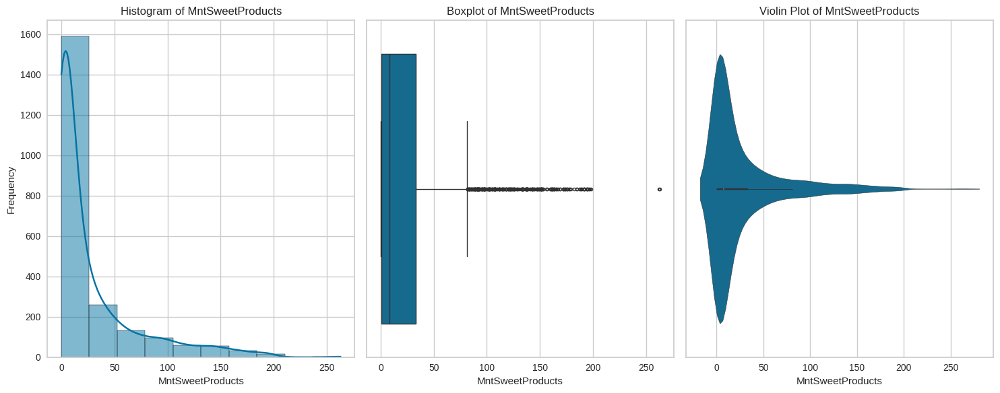

In [580]:
plt.figure(figsize=(15,10))

visualize_column(df,'MntSweetProducts')

In [581]:
df['MntSweetProducts'].skew()

np.float64(2.136080712154738)

In [582]:
Q1=df['MntSweetProducts'].quantile(0.25)
Q3=df['MntSweetProducts'].quantile(0.75)
IQR=Q3-Q1
lower_bound=0
upper_bound=Q3+1.5*IQR

In [583]:
print(upper_bound)

81.0


In [584]:
sweet_out=df[(df['MntSweetProducts']<lower_bound) | (df['MntSweetProducts']>upper_bound)]

In [585]:
sweet_out['MntSweetProducts']

,MntSweetProducts
0,88
12,112
27,263
40,178
51,167
...,...
2175,92
2190,111
2193,133
2217,125


In [586]:
df['MntSweetProducts_transformed']=np.log1p(df['MntSweetProducts'])
df['MntSweetProducts_transformed'].skew()

np.float64(0.0856828614720598)

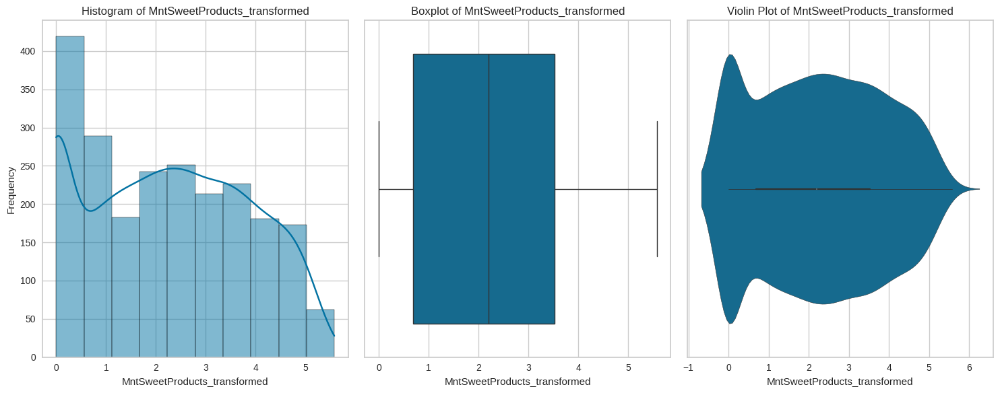

In [587]:
visualize_column(df,'MntSweetProducts_transformed')

In [588]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response',
       'Age', 'FamilySize', 'MntWines_transformed', 'MntFruits_transformed',
       'MntMeatProducts_transformed', 'MntFishProducts_transformed',
       'MntSweetProducts_transformed'],
      dtype='object')

In [589]:
# Amount spent on gold or luxury products.
df['MntGoldProds']

,MntGoldProds
0,88
1,6
2,42
3,5
4,15
...,...
2235,247
2236,8
2237,24
2238,61


In [590]:
df['MntGoldProds'].dtype

dtype('int64')

In [591]:
df['MntGoldProds'].describe()

,MntGoldProds
count,2240.000000
mean,44.021875
std,52.167439
min,0.000000
25%,9.000000
50%,24.000000
75%,56.000000
max,362.000000


In [592]:
df['MntGoldProds'].skew()

np.float64(1.8861056091894417)

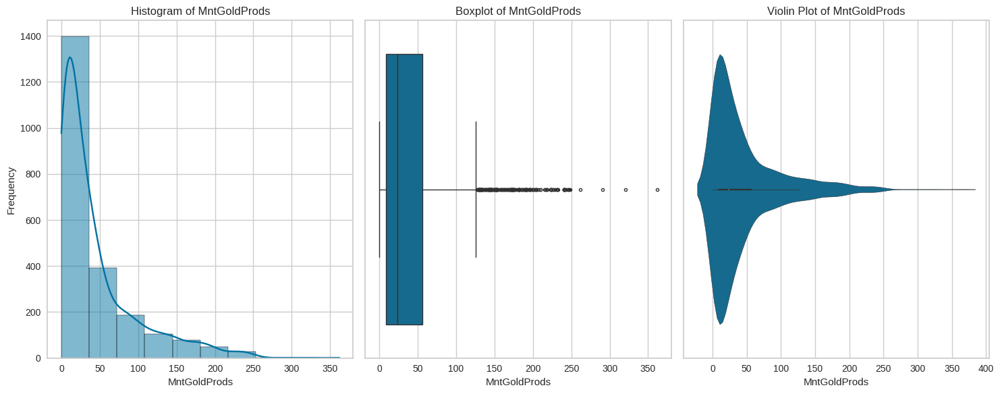

In [593]:
visualize_column(df,'MntGoldProds')

In [594]:
Q1=df['MntGoldProds'].quantile(0.25)
Q3=df['MntGoldProds'].quantile(0.75)
IQR=Q3-Q1
lower_bound=0
upper_bound=Q3+1.5*IQR

In [595]:
gold_out=df[(df['MntGoldProds']<lower_bound) | (df['MntGoldProds']>upper_bound)]

In [596]:
gold_out['MntGoldProds']

,MntGoldProds
18,176
27,362
45,174
53,241
55,190
...,...
2178,227
2188,163
2194,174
2198,152


In [597]:
x=np.sqrt(df['MntGoldProds'])
x.skew()

np.float64(0.8089730305841049)

In [598]:
y=np.log1p(df['MntGoldProds'])
y.skew()

np.float64(-0.3414276776271396)

In [599]:
y_original=np.exp(y)
y_original.skew()

np.float64(1.886105609189442)

In [600]:

df['MntGoldProds_transformed'] , fitted_lambda = stats.boxcox(df['MntGoldProds'] + 1)  # added 1 if zeros exist


In [601]:
fitted_lambda

np.float64(0.11350711836273918)

In [602]:
df['MntGoldProds_transformed'].skew()

np.float64(-0.030452681605448964)

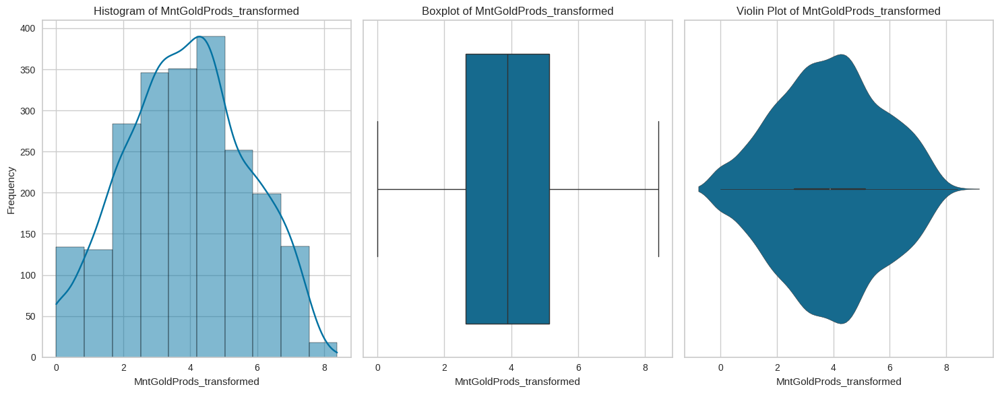

In [603]:
visualize_column(df,'MntGoldProds_transformed')

In [604]:
df['MntGoldProds_transformed'].describe()

,MntGoldProds_transformed
count,2240.000000
mean,3.878042
std,1.813349
min,0.000000
25%,2.631508
50%,3.885574
75%,5.130571
max,8.390617


In [605]:
# Number of purchses made on offers
df['NumDealsPurchases']

,NumDealsPurchases
0,3
1,2
2,1
3,2
4,5
...,...
2235,2
2236,7
2237,1
2238,2


In [606]:
df['NumDealsPurchases'].dtype

dtype('int64')

In [607]:
df['NumDealsPurchases'].describe()

,NumDealsPurchases
count,2240.000000
mean,2.325000
std,1.932238
min,0.000000
25%,1.000000
50%,2.000000
75%,3.000000
max,15.000000


In [608]:
df['NumDealsPurchases'].value_counts()

,count
NumDealsPurchases,
1,970
2,497
3,297
4,189
5,94
6,61
0,46
7,40
8,14


<Axes: xlabel='NumDealsPurchases', ylabel='count'>

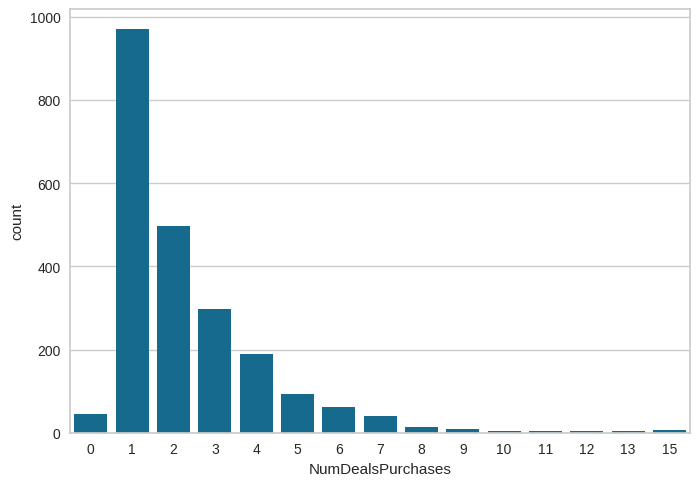

In [609]:
sns.countplot(x='NumDealsPurchases',data=df)

Most of the customers are purchasing one or 2 purchases on deals.
there are less numbers customers made more purchases during deals

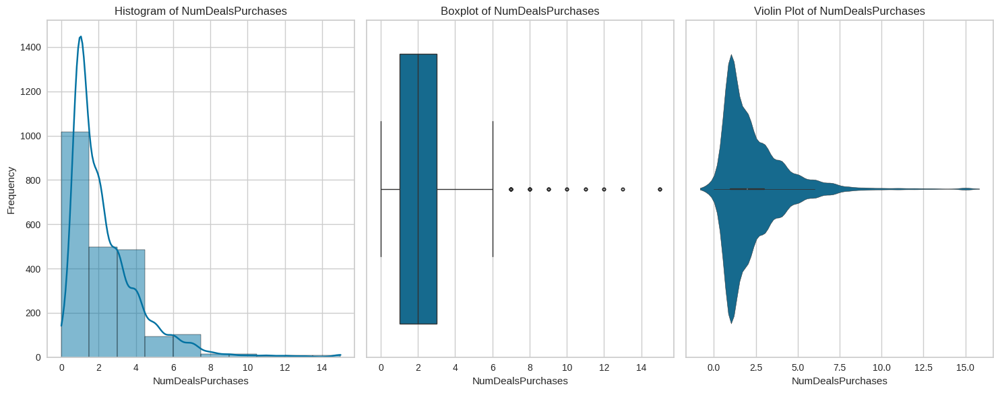

In [610]:
visualize_column(df,'NumDealsPurchases')

In [611]:
x=np.sqrt(df['NumDealsPurchases'])
x.skew()

np.float64(0.8628134648466159)

In [612]:
y=np.log1p(df['NumDealsPurchases'])
y.skew()

np.float64(0.6665067265184852)

In [613]:
df['NumDealsPurchases'].skew()

np.float64(2.4185693876889256)

Box–Cox Transformation Formula
Works only if x > 0

y' = (x^λ - 1) / λ        , if λ ≠ 0

y' = ln(x)                , if λ = 0

In [614]:
# WE can use the Yeo-johnson for this as it has 0's
df['NumDealsPurchases_transformed'] , fitted_lambda = stats.boxcox(df['NumDealsPurchases'] + 1)  # add 1 if zeros exist as the box-cox can't handle the 0's


In [615]:
fitted_lambda

np.float64(-0.4871850676344033)

In [616]:
df['NumDealsPurchases_transformed'].skew()

np.float64(-9.503423717417539e-05)

In [617]:
df['NumDealsPurchases_transformed'].describe()

,NumDealsPurchases_transformed
count,2240.000000
mean,0.808087
std,0.268276
min,0.000000
25%,0.588245
50%,0.850732
75%,1.007909
max,1.520896


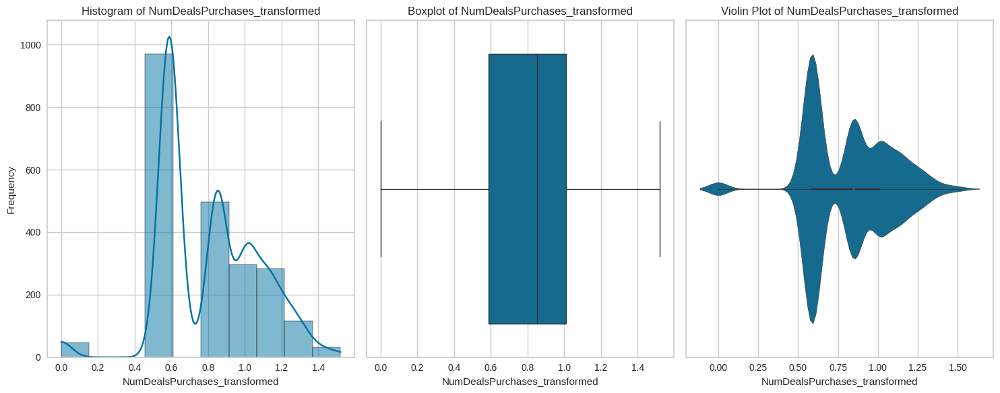

In [618]:
visualize_column(df,'NumDealsPurchases_transformed')

In [619]:
df['NumWebPurchases']

,NumWebPurchases
0,8
1,1
2,8
3,2
4,5
...,...
2235,9
2236,8
2237,2
2238,6


In [620]:
df['NumWebPurchases'].dtype

dtype('int64')

In [621]:
df['NumWebPurchases'].describe()

,NumWebPurchases
count,2240.000000
mean,4.084821
std,2.778714
min,0.000000
25%,2.000000
50%,4.000000
75%,6.000000
max,27.000000


In [622]:
df['NumWebPurchases'].unique()

array([ 8,  1,  2,  5,  6,  7,  4,  3, 11,  0, 27, 10,  9, 23, 25])

<Axes: xlabel='NumWebPurchases', ylabel='count'>

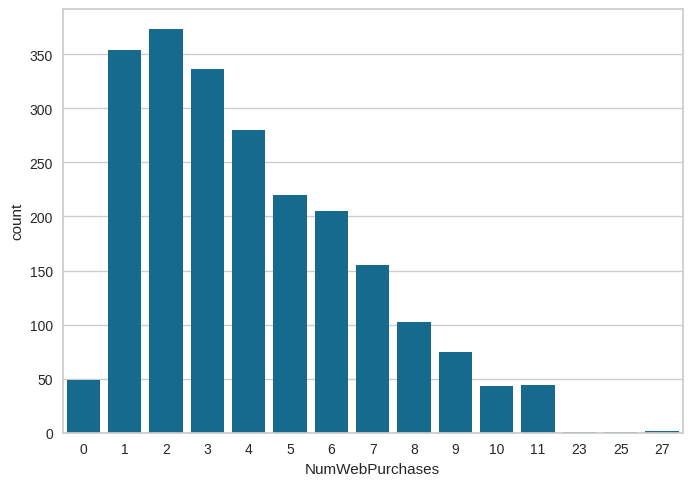

In [623]:
sns.countplot(x='NumWebPurchases',data=df)

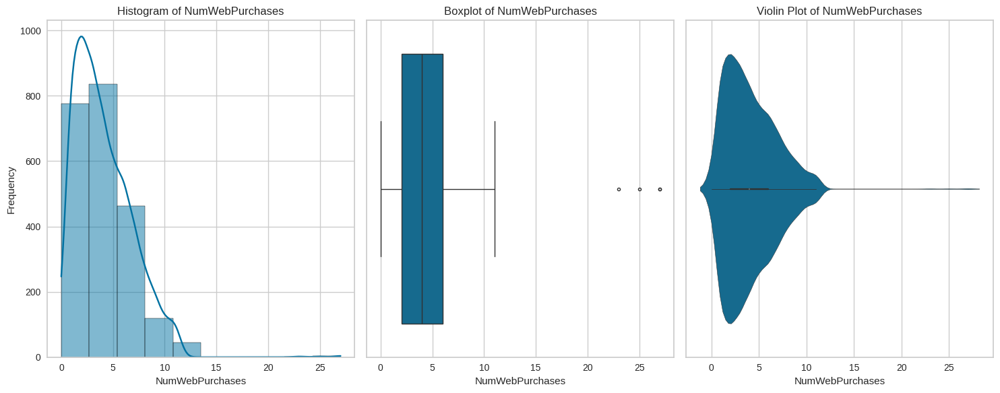

In [624]:
visualize_column(df,'NumWebPurchases')

In [625]:
df['NumWebPurchases'].skew()

np.float64(1.382794296403589)

In [626]:
df['NumWebPurchases_transformed']=np.sqrt(df['NumWebPurchases'])
df['NumWebPurchases_transformed'].skew()

np.float64(0.007850287037913389)

In [627]:
y=np.log1p(df['NumWebPurchases'])
y.skew()

np.float64(-0.26428533757040923)

### Yeo–Johnson Transformation Formula
Works for both positive and negative values

For x ≥ 0:

  y' = ((x + 1)^λ - 1) / λ       , if λ ≠ 0

   y' = ln(x + 1)                 , if λ = 0

 For x < 0:

   y' = -(((-x + 1)^(2 - λ) - 1) / (2 - λ)) , if λ ≠ 2

   y' = -ln(-x + 1)                         , if λ = 2


In [628]:
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer(method='yeo-johnson')
x = pt.fit_transform(df[['NumWebPurchases']])


In [629]:
x=pd.DataFrame(x)

x.skew()

,0
0,-0.016079


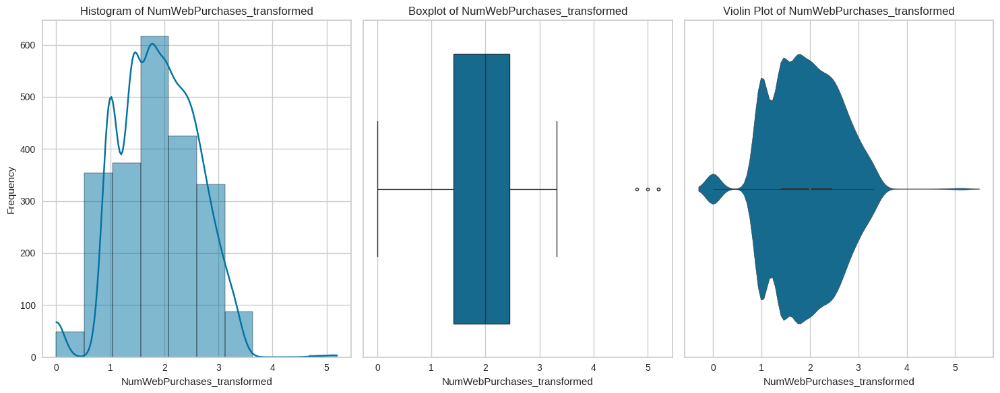

In [630]:
visualize_column(df,'NumWebPurchases_transformed')

In [631]:
df['NumWebPurchases_transformed'].describe()

,NumWebPurchases_transformed
count,2240.000000
mean,1.894303
std,0.704739
min,0.000000
25%,1.414214
50%,2.000000
75%,2.449490
max,5.196152


In [632]:
# Number of times a customer bought through a product catalog (mail/phone order or printed list)
df['NumCatalogPurchases']

,NumCatalogPurchases
0,10
1,1
2,2
3,0
4,3
...,...
2235,3
2236,2
2237,3
2238,5


In [633]:
df['NumCatalogPurchases'].dtype

dtype('int64')

In [634]:
df['NumCatalogPurchases'].describe()

,NumCatalogPurchases
count,2240.000000
mean,2.662054
std,2.923101
min,0.000000
25%,0.000000
50%,2.000000
75%,4.000000
max,28.000000


In [635]:
df['NumCatalogPurchases'].value_counts()

,count
NumCatalogPurchases,
0,586
1,497
2,276
3,184
4,182
5,140
6,128
7,79
8,55


<Axes: xlabel='NumCatalogPurchases', ylabel='count'>

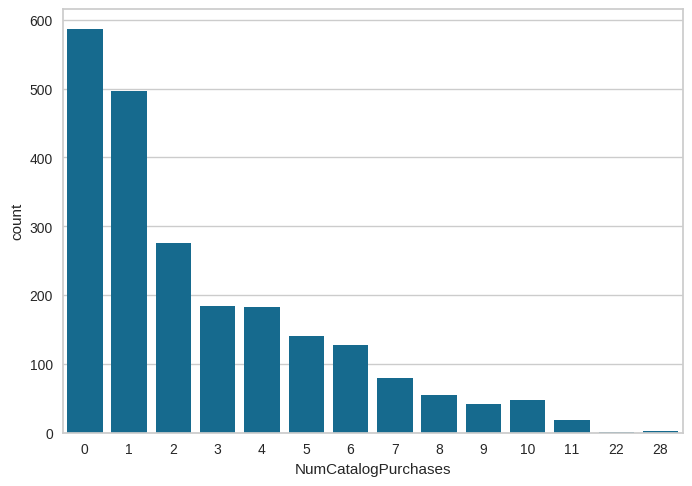

In [636]:
sns.countplot(x='NumCatalogPurchases',data=df)

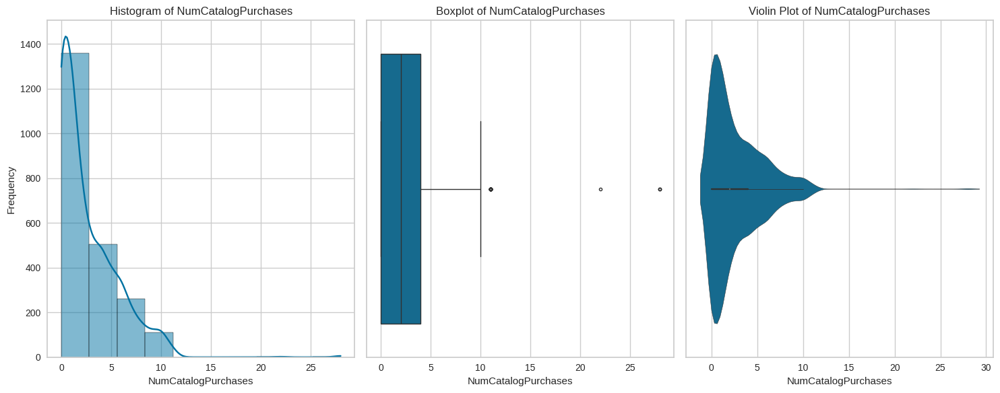

In [637]:
visualize_column(df,'NumCatalogPurchases')

In [638]:
df['NumCatalogPurchases'].skew()

np.float64(1.880988777771172)

In [639]:
x=np.sqrt(df['NumCatalogPurchases'])
x.skew()

np.float64(0.16463188640573553)

In [640]:
df['NumCatalogPurchases_transformed']=np.log1p(df['NumCatalogPurchases'])
df['NumCatalogPurchases_transformed'].skew()

np.float64(0.1322602121899251)

In [641]:
df['NumCatalogPurchases_transformed'].describe()

,NumCatalogPurchases_transformed
count,2240.000000
mean,1.005809
std,0.771292
min,0.000000
25%,0.000000
50%,1.098612
75%,1.609438
max,3.367296


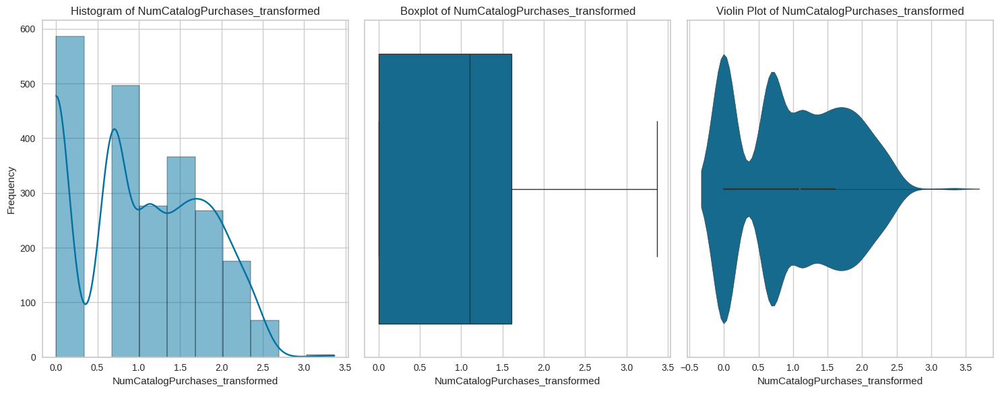

In [642]:
visualize_column(df,'NumCatalogPurchases_transformed')

In [643]:
# Number of purchases made directly in stores.
df['NumStorePurchases']

,NumStorePurchases
0,4
1,2
2,10
3,4
4,6
...,...
2235,4
2236,5
2237,13
2238,10


In [644]:
df['NumStorePurchases'].dtype

dtype('int64')

In [645]:
df['NumStorePurchases'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2240 entries, 0 to 2239
Series name: NumStorePurchases
Non-Null Count  Dtype
--------------  -----
2240 non-null   int64
dtypes: int64(1)
memory usage: 17.6 KB


In [646]:
df['NumStorePurchases'].describe()

,NumStorePurchases
count,2240.000000
mean,5.790179
std,3.250958
min,0.000000
25%,3.000000
50%,5.000000
75%,8.000000
max,13.000000


<Axes: xlabel='NumStorePurchases', ylabel='count'>

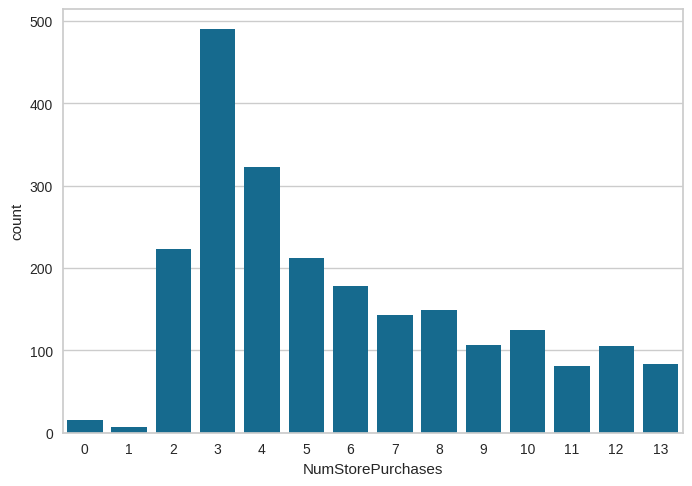

In [647]:
sns.countplot(x='NumStorePurchases',data=df)

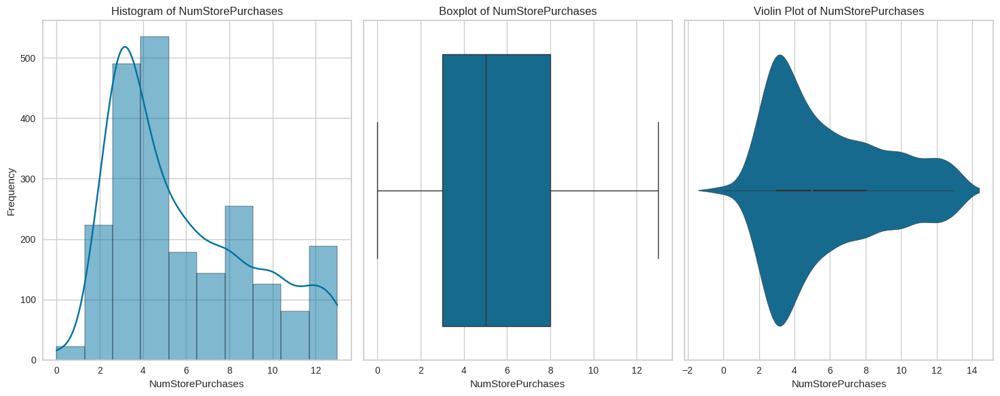

In [648]:
visualize_column(df,'NumStorePurchases')

In [649]:
df['NumStorePurchases'].skew()

np.float64(0.7022372855251121)

In [650]:
x=np.sqrt(df['NumStorePurchases'])
x.skew()

np.float64(0.14589957078178803)

In [651]:
df['NumStorePurchases_transformed']=np.log1p(df['NumStorePurchases'])
df['NumStorePurchases_transformed'].skew()

np.float64(-0.1419560223653825)

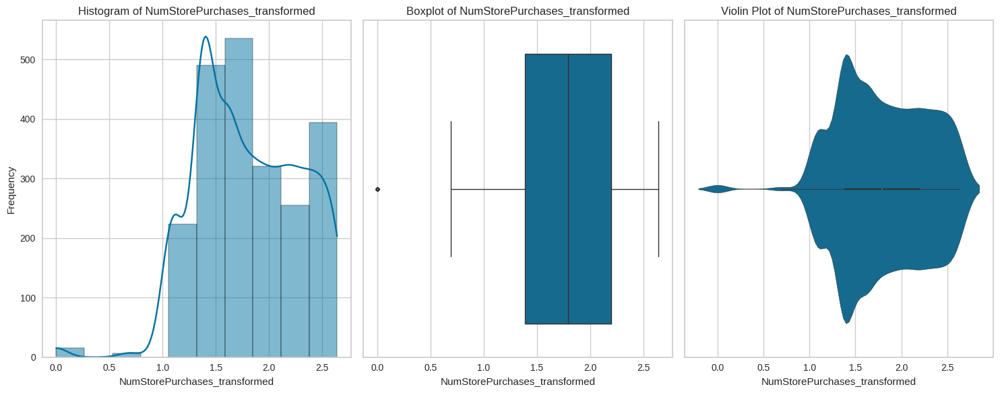

In [652]:
visualize_column(df,'NumStorePurchases_transformed')

In [653]:
df['NumStorePurchases'].describe()

,NumStorePurchases
count,2240.000000
mean,5.790179
std,3.250958
min,0.000000
25%,3.000000
50%,5.000000
75%,8.000000
max,13.000000


In [654]:
df['NumWebVisitsMonth']

,NumWebVisitsMonth
0,7
1,5
2,4
3,6
4,5
...,...
2235,5
2236,7
2237,6
2238,3


In [655]:
df['NumWebVisitsMonth'].dtype

dtype('int64')

In [656]:
df['NumWebVisitsMonth'].describe()

,NumWebVisitsMonth
count,2240.000000
mean,5.316518
std,2.426645
min,0.000000
25%,3.000000
50%,6.000000
75%,7.000000
max,20.000000


<Axes: xlabel='NumWebVisitsMonth', ylabel='count'>

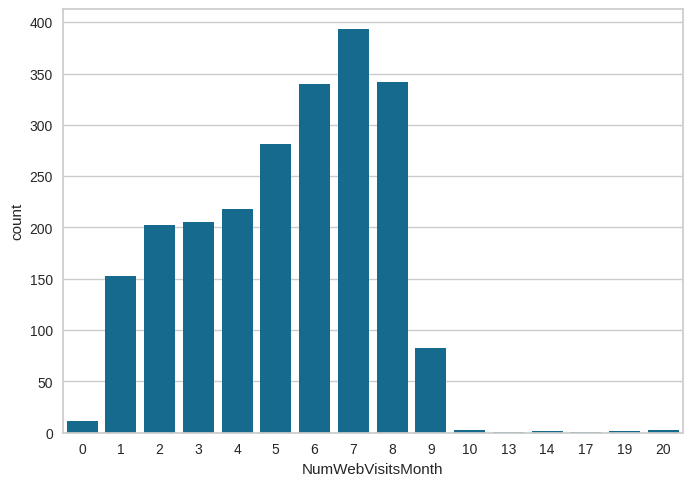

In [657]:
sns.countplot(x='NumWebVisitsMonth',data=df)

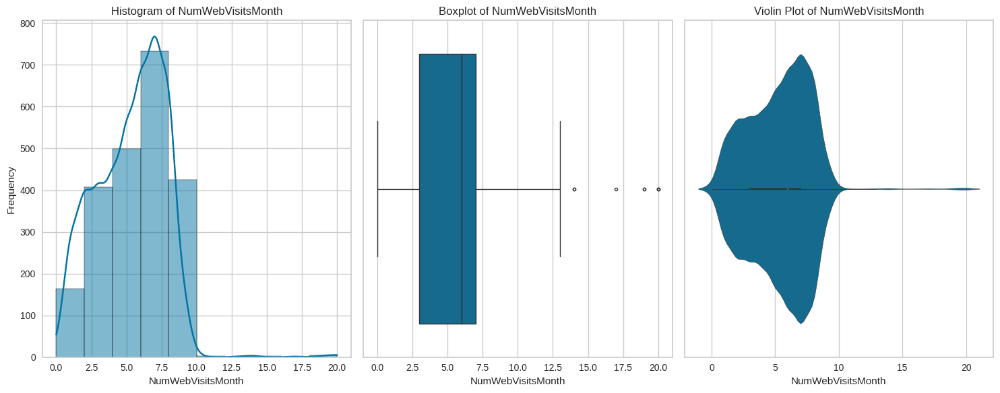

In [658]:
visualize_column(df,'NumWebVisitsMonth')

In [659]:
df['NumWebVisitsMonth'].skew()

np.float64(0.20792555676611646)

In [660]:
def transform_column_skew(df, col):
    """
    Transform a single numerical column to reduce skewness.
    Parameters:
    df : pandas.DataFrame
    col : str : column name to transform
    Returns:
    transformed_series : pd.Series
    info : dict with original skew, best skew, transformation applied
    """
    original_skew = df[col].skew()
    best_skew = original_skew
    best_transformation = 'None'
    transformed_series = df[col].copy()

    # Only transform if skew is outside [-0.5, 0.5]
    if original_skew < -0.5 or original_skew > 0.5:
        transformed_options = {}
        # 1. Square root (non-negative values only)
        if (df[col] >= 0).all():
            sqrt_transformed = np.sqrt(df[col])
            transformed_options['sqrt'] = sqrt_transformed.skew()
        # 2. log1p (log(1+x), x >= -1)
        if (df[col] >= -1).all():
            log1p_transformed = np.log1p(df[col])
            transformed_options['log1p'] = log1p_transformed.skew()
        # 3. Yeo-Johnson
        pt = PowerTransformer(method='yeo-johnson', standardize=False)
        yeo_transformed = pt.fit_transform(df[[col]])
        yeo_transformed = pd.Series(yeo_transformed.flatten(), index=df.index)
        transformed_options['yeo-johnson'] = yeo_transformed.skew()
        # Pick transformation closest to 0
        best_transformation, best_skew = min(transformed_options.items(), key=lambda x: abs(x[1]))
        # Apply the best transformation
        if best_transformation == 'sqrt':
            transformed_series = np.sqrt(df[col])
        elif best_transformation == 'log1p':
            transformed_series = np.log1p(df[col])
        elif best_transformation == 'yeo-johnson':
            transformed_series = yeo_transformed
    info = {
        'original_skew': original_skew,
        'best_skew': best_skew,
        'transformation': best_transformation
    }

    return transformed_series, info

In [661]:

# Suppose our DataFrame is df and column to transform is 'NumWebVisitsMonth'
transformed_col, report = transform_column_skew(df, 'NumWebVisitsMonth')

print(f"Original skew: {report['original_skew']:.2f}")
print(f"Best skew: {report['best_skew']:.2f}")
print(f"Transformation applied: {report['transformation']}")



Original skew: 0.21
Best skew: 0.21
Transformation applied: None


In [662]:
# Replace original column with transformed data
df['NumWebVisitsMonth_transformed'] = transformed_col

In [663]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response',
       'Age', 'FamilySize', 'MntWines_transformed', 'MntFruits_transformed',
       'MntMeatProducts_transformed', 'MntFishProducts_transformed',
       'MntSweetProducts_transformed', 'MntGoldProds_transformed',
       'NumDealsPurchases_transformed', 'NumWebPurchases_transformed',
       'NumCatalogPurchases_transformed', 'NumStorePurchases_transformed',
       'NumWebVisitsMonth_transformed'],
      dtype='object')

In [664]:
df['AcceptedCmp1']

,AcceptedCmp1
0,0
1,0
2,0
3,0
4,0
...,...
2235,0
2236,1
2237,0
2238,0


In [665]:
df['AcceptedCmp1'].dtype

dtype('int64')

In [666]:
df['AcceptedCmp1'].value_counts()

,count
AcceptedCmp1,
0,2096
1,144


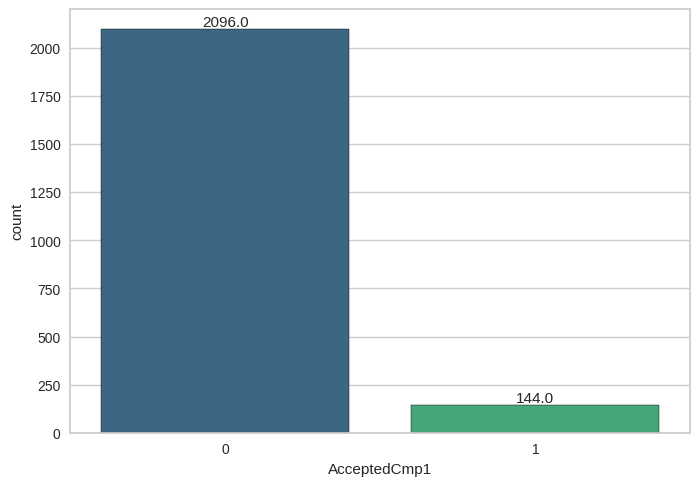

In [667]:
sns.countplot(x='AcceptedCmp1',data=df,palette='viridis',edgecolor='black')
for p in plt.gca().patches:
    height = p.get_height()
    plt.gca().annotate(f'{height}', (p.get_x() + p.get_width()/2., height),
                       ha='center', va='bottom', fontsize=11)
plt.show()


From the above most of the customers did not accept the first campaign offers

In [668]:
df['AcceptedCmp2']

,AcceptedCmp2
0,0
1,0
2,0
3,0
4,0
...,...
2235,0
2236,0
2237,0
2238,0


In [669]:
df['AcceptedCmp2'].dtype

dtype('int64')

In [670]:
df['AcceptedCmp2'].isnull().sum()

np.int64(0)

In [671]:
df['AcceptedCmp2'].value_counts()

,count
AcceptedCmp2,
0,2210
1,30


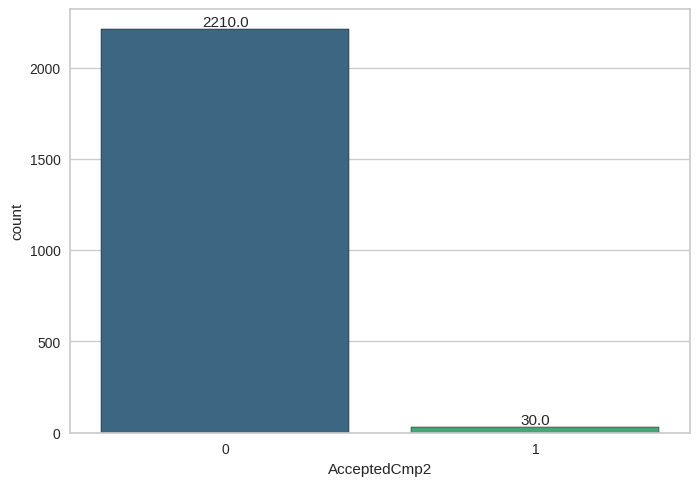

In [672]:
sns.countplot(x='AcceptedCmp2',data=df,palette='viridis',edgecolor='black')
for p in plt.gca().patches:
    height = p.get_height()
    plt.gca().annotate(f'{height}', (p.get_x() + p.get_width()/2., height),
                       ha='center', va='bottom', fontsize=11)
plt.show()


From the above most of the customers did not accept the 2nd campaign

In [673]:
df['AcceptedCmp3']

,AcceptedCmp3
0,0
1,0
2,0
3,0
4,0
...,...
2235,0
2236,0
2237,0
2238,0


In [674]:
df['AcceptedCmp3'].dtype

dtype('int64')

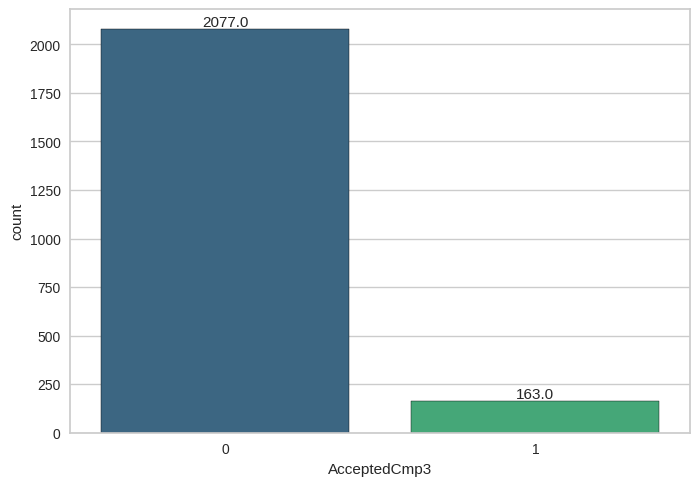

In [675]:
sns.countplot(x='AcceptedCmp3',data=df,palette='viridis',edgecolor='black')
for p in plt.gca().patches:
    height = p.get_height()
    plt.gca().annotate(f'{height}', (p.get_x() + p.get_width()/2., height),
                       ha='center', va='bottom', fontsize=11)
plt.show()


From the above most of the customers did not accept the third campaign but much better than first two




In [676]:
df['AcceptedCmp4']

,AcceptedCmp4
0,0
1,0
2,0
3,0
4,0
...,...
2235,0
2236,0
2237,1
2238,0


In [677]:
df['AcceptedCmp4'].dtype

dtype('int64')

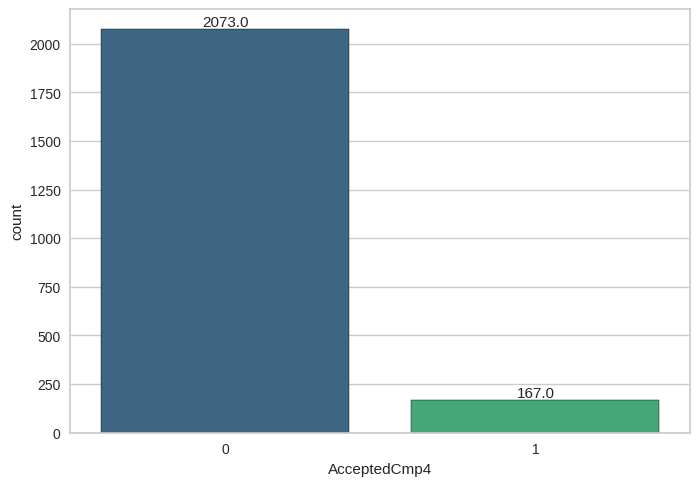

In [678]:
sns.countplot(x='AcceptedCmp4',data=df,palette='viridis',edgecolor='black')
for p in plt.gca().patches:
    height = p.get_height()
    plt.gca().annotate(f'{height}', (p.get_x() + p.get_width()/2., height),
                       ha='center', va='bottom', fontsize=11)
plt.show()


From the above most of the customers did not accept the fourt campaign,but better than before.



In [679]:
df['AcceptedCmp5']

,AcceptedCmp5
0,0
1,0
2,0
3,0
4,0
...,...
2235,0
2236,0
2237,0
2238,0


In [680]:
df['AcceptedCmp5'].dtype

dtype('int64')

In [681]:
df['AcceptedCmp5'].describe()

,AcceptedCmp5
count,2240.000000
mean,0.072768
std,0.259813
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000


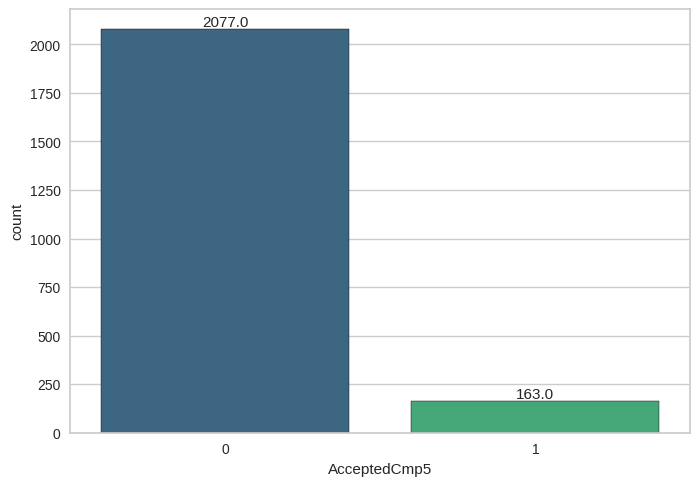

In [682]:
sns.countplot(x='AcceptedCmp5',data=df,palette='viridis',edgecolor='black')
for p in plt.gca().patches:
    height = p.get_height()
    plt.gca().annotate(f'{height}', (p.get_x() + p.get_width()/2., height),
                       ha='center', va='bottom', fontsize=11)
plt.show()


From the above most of the customers did not accept the 5th campaign,little less than 4th.


**From All the 5 campaigns the second campaign has less  acceptences of the offer and mostly cutomers did not accept the offers during campaign**

In [683]:
# Response to the most recent campaign (1 = accepted, 0 = not accepted). This is often the target variable in prediction tasks.
df['Response']

,Response
0,1
1,0
2,0
3,0
4,0
...,...
2235,0
2236,0
2237,0
2238,0


In [684]:
df['Response'].dtype

dtype('int64')

In [685]:
df['Response'].value_counts()

,count
Response,
0,1906
1,334


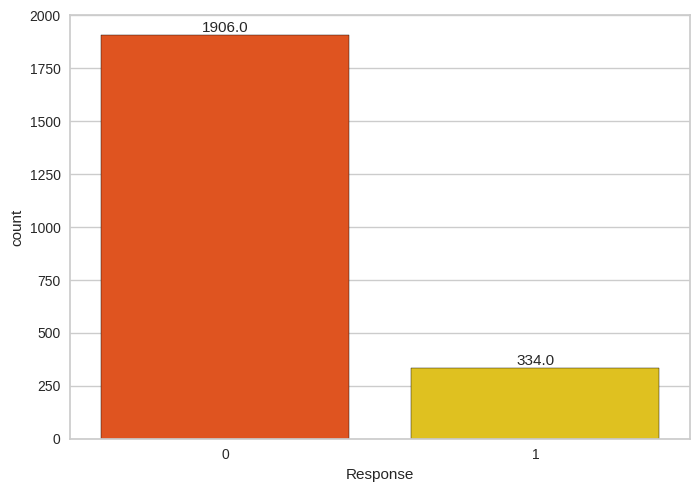

In [686]:
sns.countplot(x='Response',data=df,palette=['#FF4500','#FFD700'],edgecolor='black')
for p in plt.gca().patches:
    height = p.get_height()
    plt.gca().annotate(f'{height}', (p.get_x() + p.get_width()/2., height),
                       ha='center', va='bottom', fontsize=11)
plt.show()


From the recent campaign the customer acceptence of offer is increased by double this means the recent campaign attracts the customers withing their needs a lit bit than other campaigns .


In [687]:
# 1 if the customer has complained in the last 2 years, 0 otherwise.
df['Complain']

,Complain
0,0
1,0
2,0
3,0
4,0
...,...
2235,0
2236,0
2237,0
2238,0


In [688]:
df['Complain'].dtype

dtype('int64')

In [689]:
df['Complain'].value_counts()

,count
Complain,
0,2219
1,21


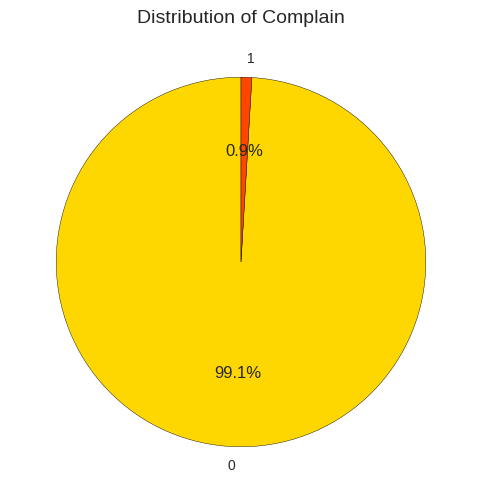

In [690]:
counts = df['Complain'].value_counts()

# Labels
labels = counts.index.astype(str)  # '0' and '1'
# Colors (yellow for 0, red for 1)
colors = ['#FFD700', '#FF4500']  # yellow, red
# Create pie chart
plt.figure(figsize=(6,6))
plt.pie(
    counts,
    labels=labels,
    autopct='%1.1f%%',  # show percentage
    startangle=90,      # rotate start
    colors=colors,
    wedgeprops={'edgecolor':'black'}  # border around slices
)

plt.title('Distribution of Complain', fontsize=14)
plt.show()

From the above there are less than 1% of complaints have been raised this maeans the marketting is going well and but we have to check the complaints nce if there are any major complaints in them.

Any way the marketing was going well


In [691]:
# Cost of a contact to the company .
df['Z_CostContact']

,Z_CostContact
0,3
1,3
2,3
3,3
4,3
...,...
2235,3
2236,3
2237,3
2238,3


In [692]:
df['Z_CostContact'].dtype

dtype('int64')

In [693]:
df['Z_CostContact'].value_counts()

,count
Z_CostContact,
3,2240


In [694]:
df['Z_CostContact'].unique()

array([3])

This column has all values are same as it is has contact cost for all coustomers as 3  so we can drop this column during feature engineering as doesn't give much informstion for clustering

In [695]:
# Revenue from a single sale contact
df['Z_Revenue']

,Z_Revenue
0,11
1,11
2,11
3,11
4,11
...,...
2235,11
2236,11
2237,11
2238,11


In [696]:
df['Z_Revenue'].dtype

dtype('int64')

In [697]:
df['Z_Revenue'].value_counts()

,count
Z_Revenue,
11,2240


<Axes: xlabel='Z_Revenue', ylabel='count'>

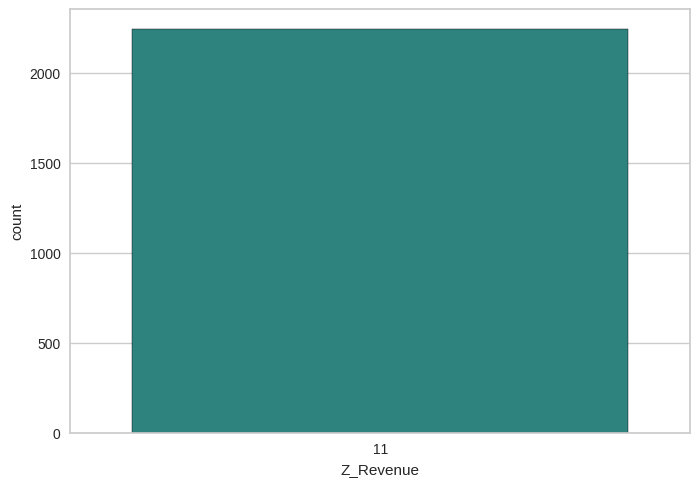

In [698]:
sns.countplot(x='Z_Revenue',data=df,palette='viridis',edgecolor='black')

The Revenue column also have same value as 11 as it the company gets revenue from the each customer is 11.
So we can drop it during the feature engineering or now

In [699]:
# Dropping the columns Z_CostContact and Z_Revenue  and Id Which have unique values
df.drop(columns={'ID','Z_CostContact','Z_Revenue'},inplace=True)

# Bivariate analysis

In [700]:
df.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,MntFruits_transformed,MntMeatProducts_transformed,MntFishProducts_transformed,MntSweetProducts_transformed,MntGoldProds_transformed,NumDealsPurchases_transformed,NumWebPurchases_transformed,NumCatalogPurchases_transformed,NumStorePurchases_transformed,NumWebVisitsMonth_transformed
0,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,...,4.488636,6.304449,5.153292,4.488636,5.853780,1.007909,2.828427,2.397895,1.609438,7
1,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,...,0.693147,1.945910,1.098612,0.693147,2.177547,0.850732,1.000000,0.693147,1.098612,5
2,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,...,3.912023,4.852030,4.718499,3.091042,4.691641,0.588245,2.828427,1.098612,2.397895,4
3,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,...,1.609438,3.044522,2.397895,1.386294,1.986968,0.850732,1.414214,0.000000,1.609438,6
4,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,...,3.784190,4.779123,3.850148,3.332205,3.258474,1.195171,2.236068,1.386294,1.945910,5


In [701]:
df.dtypes

,0
Year_Birth,int64
Education,object
Marital_Status,object
Income,float64
Kidhome,int64
Teenhome,int64
Dt_Customer,datetime64[ns]
Recency,int64
MntWines,int64
MntFruits,int64


In [702]:
df.corr(numeric_only=True)

,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,...,MntFruits_transformed,MntMeatProducts_transformed,MntFishProducts_transformed,MntSweetProducts_transformed,MntGoldProds_transformed,NumDealsPurchases_transformed,NumWebPurchases_transformed,NumCatalogPurchases_transformed,NumStorePurchases_transformed,NumWebVisitsMonth_transformed
Year_Birth,1.000000,-0.202858,0.230176,-0.352111,-0.019871,-0.157773,-0.017917,-0.030872,-0.041625,-0.018133,...,-0.022374,-0.103270,-0.024695,0.005704,-0.061645,-0.063453,-0.148548,-0.167310,-0.142504,0.121139
Income,-0.202858,1.000000,-0.518680,0.036223,0.005239,0.705075,0.520144,0.683031,0.533534,0.532928,...,0.555903,0.785899,0.536856,0.543854,0.454923,-0.213787,0.509240,0.759329,0.662485,-0.648352
Kidhome,0.230176,-0.518680,1.000000,-0.036133,0.008827,-0.496297,-0.372581,-0.437129,-0.387644,-0.370673,...,-0.439815,-0.533952,-0.432642,-0.430628,-0.407066,0.253236,-0.379013,-0.576115,-0.509435,0.447846
Teenhome,-0.352111,0.036223,-0.036133,1.000000,0.016198,0.004846,-0.176764,-0.261160,-0.204187,-0.162475,...,-0.195981,-0.116457,-0.227258,-0.194795,-0.022286,0.450301,0.140174,-0.043348,0.072368,0.134884
Recency,-0.019871,0.005239,0.008827,0.016198,1.000000,0.016064,-0.004306,0.023056,0.001079,0.022670,...,0.023705,0.029396,0.016116,0.023219,0.019649,0.009062,-0.000739,0.030076,0.007471,-0.021445
MntWines,-0.157773,0.705075,-0.496297,0.004846,0.016064,1.000000,0.389637,0.562667,0.399753,0.386581,...,0.447715,0.699717,0.437167,0.442489,0.451548,-0.049630,0.569967,0.723982,0.652255,-0.320653
MntFruits,-0.017917,0.520144,-0.372581,-0.176764,-0.004306,0.389637,1.000000,0.543105,0.594804,0.567164,...,0.813766,0.586974,0.570957,0.571392,0.436987,-0.185318,0.333022,0.537114,0.463824,-0.418383
MntMeatProducts,-0.030872,0.683031,-0.437129,-0.261160,0.023056,0.562667,0.543105,1.000000,0.568402,0.523846,...,0.563532,0.815595,0.563969,0.545234,0.387933,-0.257865,0.322291,0.690933,0.466829,-0.539470
MntFishProducts,-0.041625,0.533534,-0.387644,-0.204187,0.001079,0.399753,0.594804,0.568402,1.000000,0.579870,...,0.584333,0.612668,0.808507,0.579710,0.462869,-0.195106,0.332178,0.574979,0.466171,-0.446003
MntSweetProducts,-0.018133,0.532928,-0.370673,-0.162475,0.022670,0.386581,0.567164,0.523846,0.579870,1.000000,...,0.556532,0.566199,0.570260,0.810657,0.417654,-0.196869,0.364861,0.533300,0.438882,-0.423294


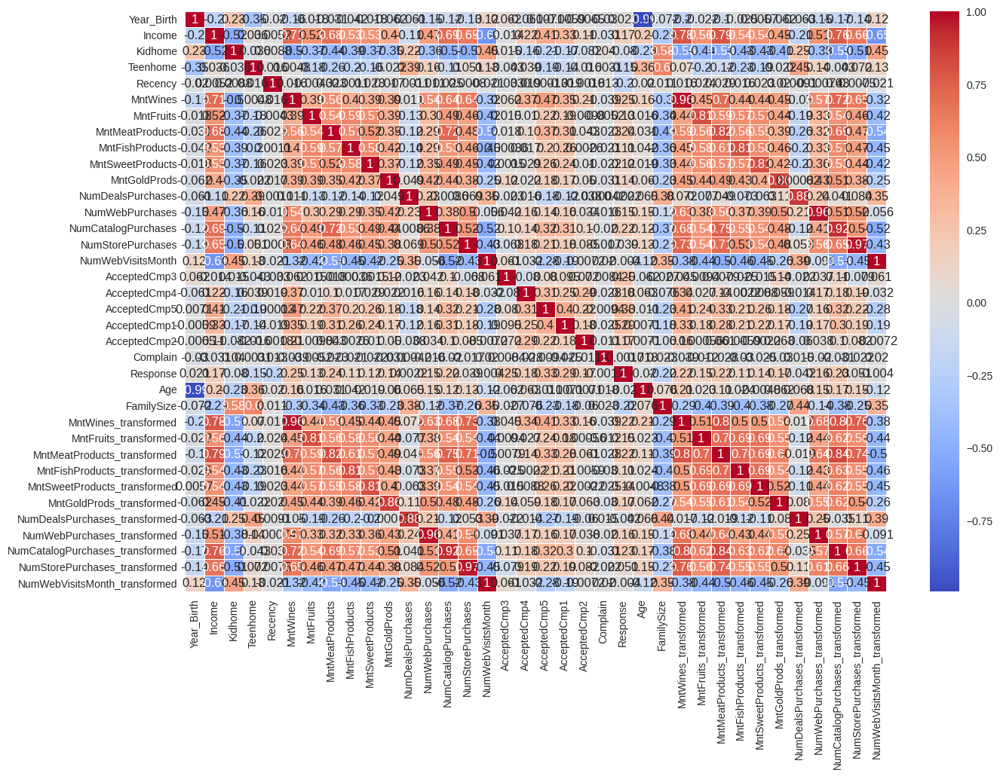

In [703]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(numeric_only=True),annot=True,cmap='coolwarm',linewidth=0.5)
plt.show()

From the above correlation heatmap we can find some Insights are:
* The customer with more income are mostly buying the Meat and Wines aand they prefer purchasing through catalog
* Most income Customers moderately buys the Fishes,sweets ,gold And Moderately uses the purchasing via store and web.
* And The Income is -vely correlated with Numofwebvistit.
* The kids home are mostly the more the kids the less the purchase amount on the wines ,meat, fruits ,fish ,sweet and the custoomers with more kids are not making purchases through the web,catalog,store.But they preffer deal purchases but in less.
* The Customers who purchases the meat are most like buying the wines. And The both Meat and Wines are most likely brought throgh the catalog mean The more catalog purchases the more amount of purchases on meat and wines.
* The wines and meat purchases are more in store and the web,This means lots of customers are purchasing meat and wines and fruits in every purchase platform.
* The more the webVisitmonth the less the purchase of the fruits,sweet,gold,wines,and meat.They mostly purchasing during the deals (offers)
* The more customer with more kid are mostly buying in the deals(offers)
* And Some are like storepurchases are moderately +vely correlated with webpurchases,catlogpurchases.

In [704]:
df.columns

Index(['Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Response', 'Age', 'FamilySize',
       'MntWines_transformed', 'MntFruits_transformed',
       'MntMeatProducts_transformed', 'MntFishProducts_transformed',
       'MntSweetProducts_transformed', 'MntGoldProds_transformed',
       'NumDealsPurchases_transformed', 'NumWebPurchases_transformed',
       'NumCatalogPurchases_transformed', 'NumStorePurchases_transformed',
       'NumWebVisitsMonth_transformed'],
      dtype='object')

In [705]:
df['Total_Purchases']=df['MntFishProducts']+df['MntFruits']+df['MntGoldProds']+df['MntMeatProducts']+df['MntSweetProducts']+df['MntWines']

In [706]:
df['Total_Purchases'].head()

,Total_Purchases
0,1617
1,27
2,776
3,53
4,422


In [707]:
df['Total_Purchases'].describe()

,Total_Purchases
count,2240.000000
mean,605.798214
std,602.249288
min,5.000000
25%,68.750000
50%,396.000000
75%,1045.500000
max,2525.000000


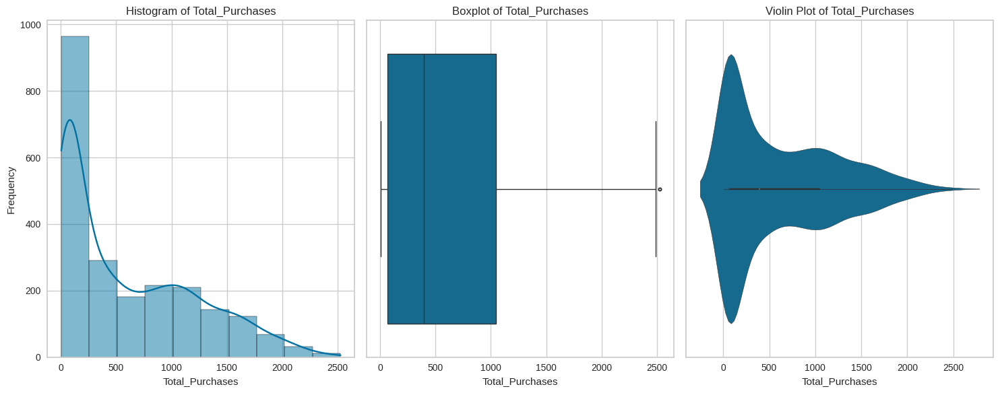

In [708]:
visualize_column(df,'Total_Purchases')

In [709]:
df['Total_Purchases'].skew()

np.float64(0.8608405071736205)

In [710]:
# Suppose our DataFrame is df and column to transform is 'NumWebVisitsMonth'
transformed_col, report = transform_column_skew(df, 'Total_Purchases')

print(f"Original skew: {report['original_skew']:.2f}")
print(f"Best skew: {report['best_skew']:.2f}")
print(f"Transformation applied: {report['transformation']}")


Original skew: 0.86
Best skew: -0.12
Transformation applied: yeo-johnson


In [711]:
df['Total_Purchases_transformed']=transformed_col

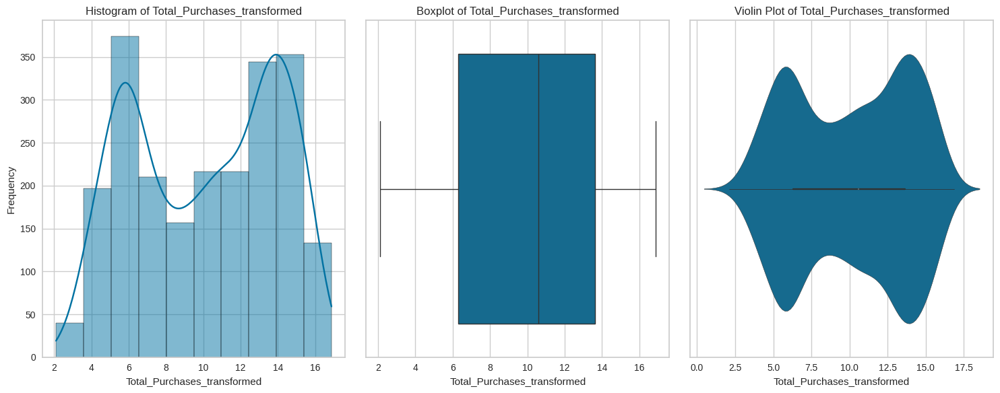

In [712]:
visualize_column(df,'Total_Purchases_transformed')

In [713]:
df['Total_Purchases_transformed'].describe()

,Total_Purchases_transformed
count,2240.000000
mean,10.093665
std,3.859880
min,2.106281
25%,6.310371
50%,10.602922
75%,13.630784
max,16.869333


In [714]:
df['Total_Num_Purchases']=df['NumWebPurchases']+df['NumCatalogPurchases']+df['NumStorePurchases']+df['NumDealsPurchases']

In [715]:
df['Total_Num_Purchases'].head()

,Total_Num_Purchases
0,25
1,6
2,21
3,8
4,19


In [716]:
df['Total_Num_Purchases'].describe()

,Total_Num_Purchases
count,2240.000000
mean,14.862054
std,7.677173
min,0.000000
25%,8.000000
50%,15.000000
75%,21.000000
max,44.000000


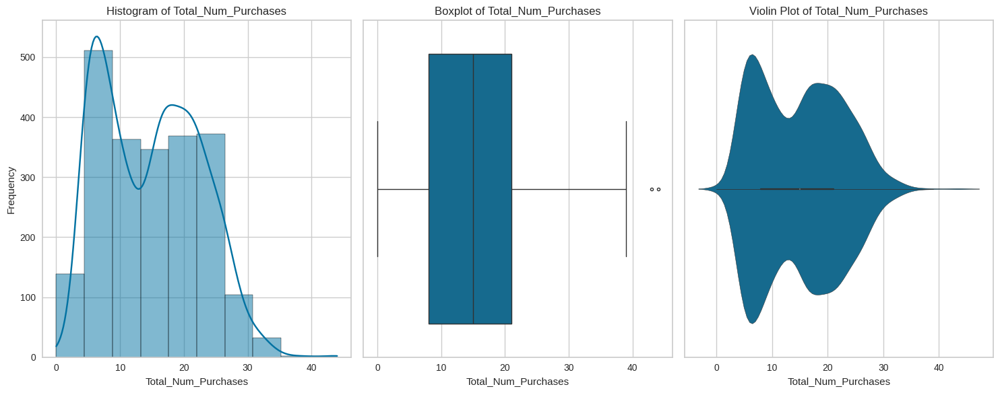

In [717]:
visualize_column(df,'Total_Num_Purchases')

In [718]:
df['Total_Num_Purchases'].skew()

np.float64(0.25211097124738713)

In [719]:
r=df['Total_Num_Purchases'].corr(df['Total_Purchases_transformed'])
r

np.float64(0.8729458403493898)

In [720]:
#VIF

In [721]:
vif=1/(1-r**2)
vif

np.float64(4.202288771409987)

Here the VIF for these two columns is 4.2 < 5 ,so we have to remove one column of create new column

In [722]:
# creating new column purchase ration
df['Purchases_Ratio'] = df['Total_Purchases'] / (df['Total_Num_Purchases'] + 1) # here we are adding 1 from preventing error by 0,as there may be 0 Total_num_purchases

In [723]:
df['Purchases_Ratio']

,Purchases_Ratio
0,62.192308
1,3.857143
2,35.272727
3,5.888889
4,21.100000
...,...
2235,70.578947
2236,19.304348
2237,62.050000
2238,35.125000


In [724]:
df['Purchases_Ratio'].describe()

,Purchases_Ratio
count,2240.000000
mean,30.929840
std,32.018331
min,0.500000
25%,8.444444
50%,21.841667
75%,43.416667
max,839.500000


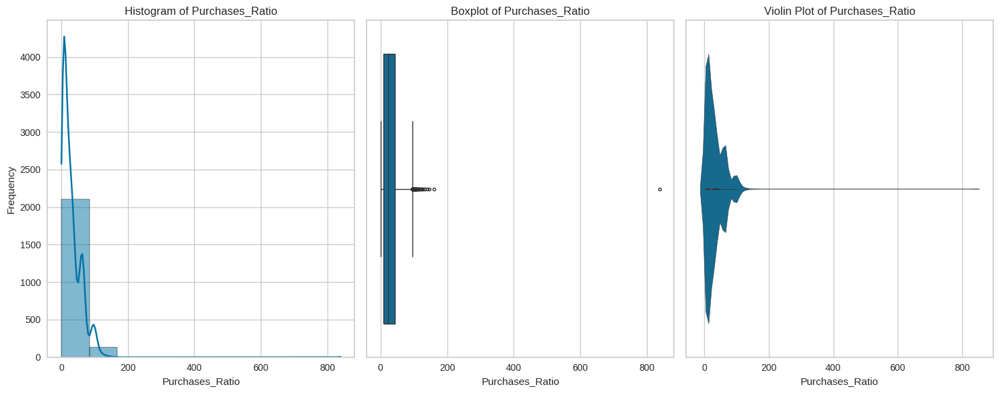

In [725]:
visualize_column(df,'Purchases_Ratio')

In [726]:
df['Purchases_Ratio'].skew()

np.float64(7.919499163418127)

In [727]:
# Suppose our DataFrame is df and column to transform is 'NumWebVisitsMonth'
transformed_col, report = transform_column_skew(df, 'Purchases_Ratio')

print(f"Original skew: {report['original_skew']:.2f}")
print(f"Best skew: {report['best_skew']:.2f}")
print(f"Transformation applied: {report['transformation']}")


Original skew: 7.92
Best skew: -0.01
Transformation applied: yeo-johnson


In [728]:
df['Purchases_Ratio_transformed']=transformed_col

In [729]:
df['Purchases_Ratio_transformed'].describe()

,Purchases_Ratio_transformed
count,2240.000000
mean,3.318254
std,1.075318
min,0.409368
25%,2.368661
50%,3.371241
75%,4.154242
max,7.926419


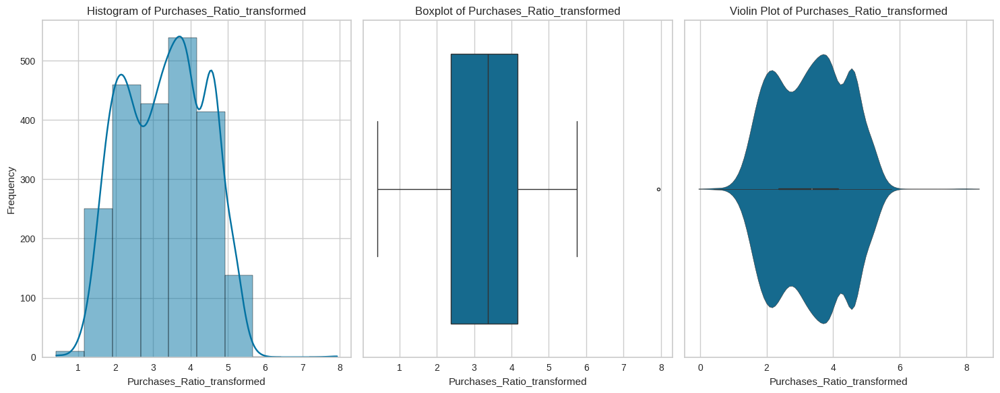

In [730]:
visualize_column(df,'Purchases_Ratio_transformed')

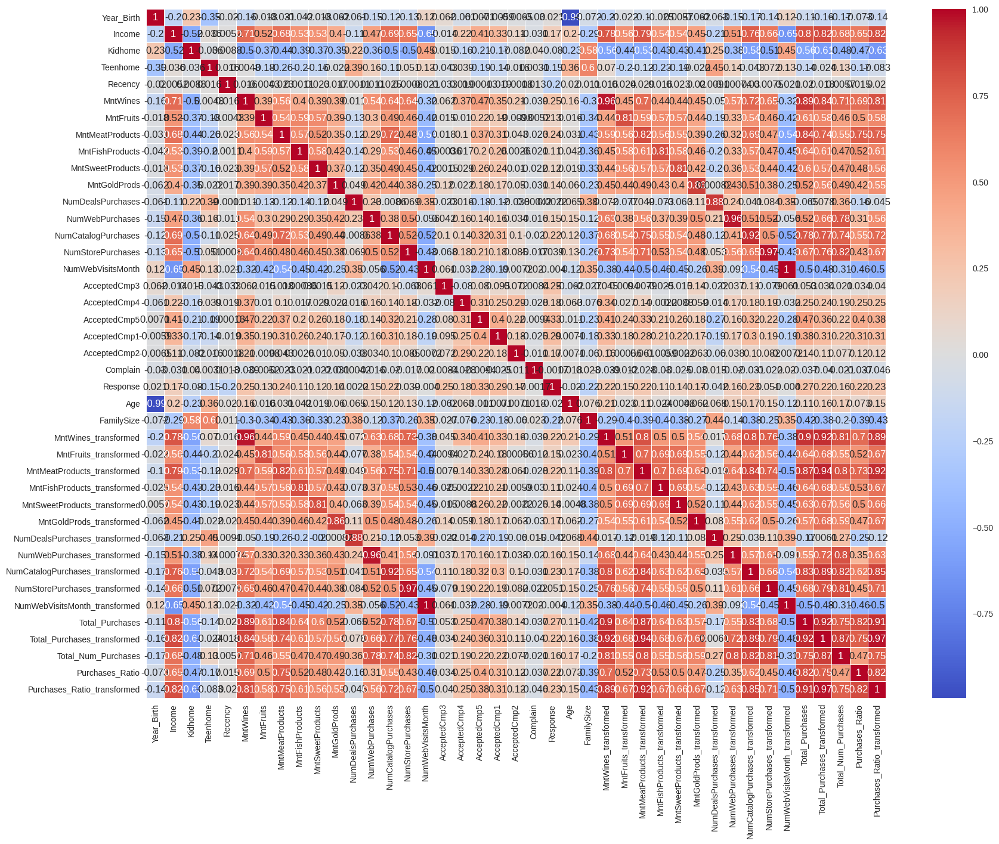

In [731]:
plt.figure(figsize=(20,15))
sns.heatmap(df.corr(numeric_only=True),annot=True,cmap='coolwarm',linewidth=0.5)
plt.show()

here we can drop the year_birt;h

In [732]:
df.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumDealsPurchases_transformed,NumWebPurchases_transformed,NumCatalogPurchases_transformed,NumStorePurchases_transformed,NumWebVisitsMonth_transformed,Total_Purchases,Total_Purchases_transformed,Total_Num_Purchases,Purchases_Ratio,Purchases_Ratio_transformed
0,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,...,1.007909,2.828427,2.397895,1.609438,7,1617,15.169530,25,62.192308,4.579434
1,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,...,0.850732,1.000000,0.693147,1.098612,5,27,4.531195,6,3.857143,1.640857
2,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,...,0.588245,2.828427,1.098612,2.397895,4,776,12.645096,21,35.272727,3.913160
3,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,...,0.850732,1.414214,0.000000,1.609438,6,53,5.782352,8,5.888889,2.020487
4,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,...,1.195171,2.236068,1.386294,1.945910,5,422,10.785691,19,21.100000,3.333013


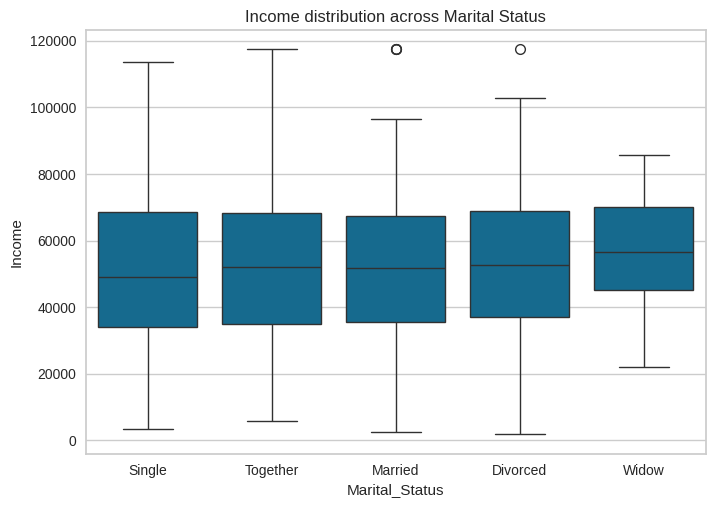

In [733]:
sns.boxplot(x='Marital_Status', y='Income', data=df)
plt.title("Income distribution across Marital Status")
plt.show()


Here almost martial status has the same distribution of income for every one but the together and married have the highest income among all,and there are less number of widows in the data.

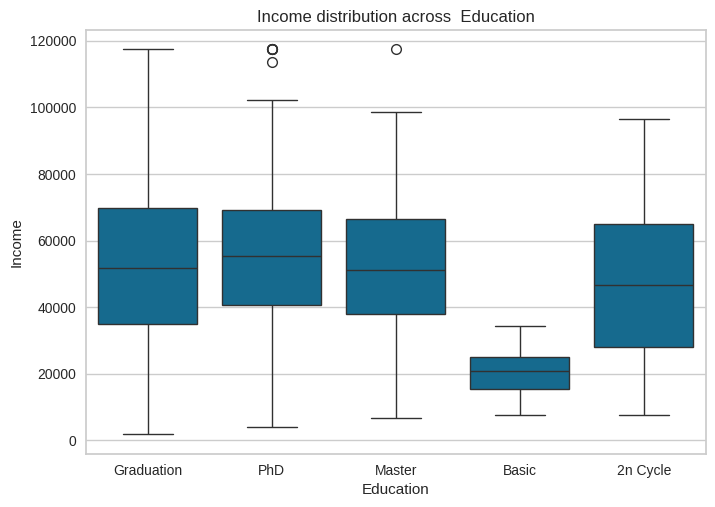

In [734]:
sns.boxplot(x='Education', y='Income', data=df)
plt.title("Income distribution across  Education")
plt.show()

From the above the PHD and graduates have more income and most of the salaries are range from 20000 to 700000 and the Basic Education has lowest salary.

<Axes: xlabel='Marital_Status'>

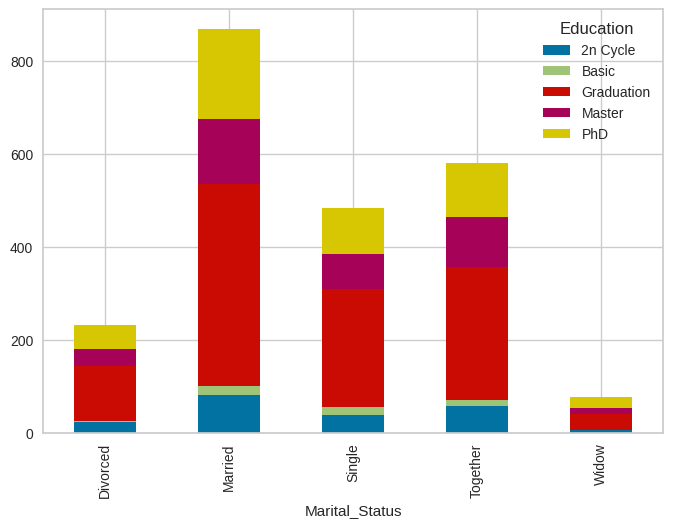

In [735]:
cr=pd.crosstab(df['Marital_Status'],df['Education'])
cr.plot(kind='bar',stacked='True')

From the above chart we can find that are more Graduates in every martial status married

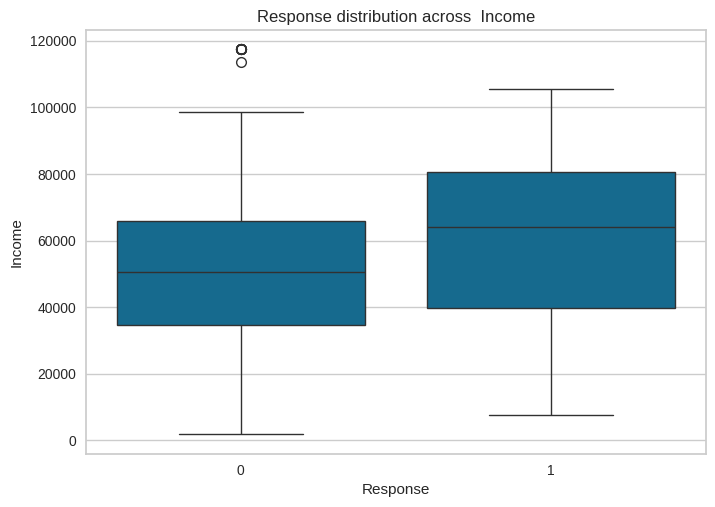

In [736]:
sns.boxplot(x='Response', y='Income', data=df)
plt.title("Response distribution across  Income")
plt.show()

From this the income ranges from 50 to 80k are mostly gave +ve Response and the income from 20 to 60 k are mostly have -ve response and the customers with high income almost decline the campaign

In [737]:
ttest_ind(df[df['Response']==1]['Income'],df[df['Response']==0]['Income'])

TtestResult(statistic=np.float64(7.989762600971118), pvalue=np.float64(2.1431529301669987e-15), df=np.float64(2238.0))

Here the p<0.05 so these two features are significant,where these two are statastically different,means they carry different information.

In [738]:
df['Customer_Since_Days'] = (pd.Timestamp.today() - df['Dt_Customer']).dt.days

In [739]:
df[['Customer_Since_Days', 'Age','Income','Purchases_Ratio']].corr()


,Customer_Since_Days,Age,Income,Purchases_Ratio
Customer_Since_Days,1.000000,-0.019615,-0.024842,0.116986
Age,-0.019615,1.000000,0.204921,0.073356
Income,-0.024842,0.204921,1.000000,0.647398
Purchases_Ratio,0.116986,0.073356,0.647398,1.000000


<Axes: xlabel='Customer_Since_Days', ylabel='Income'>

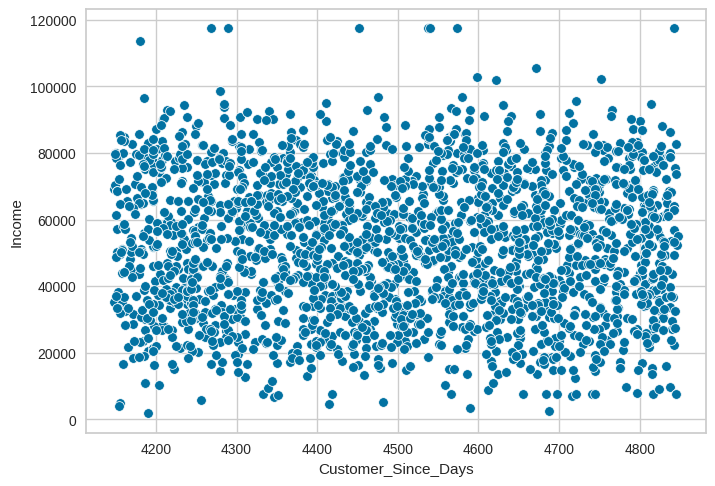

In [740]:
sns.scatterplot(x='Customer_Since_Days', y='Income', data=df)

In [741]:
df['Year']=df['Dt_Customer'].dt.year
# Count number of customers per year
customers_per_year = df['Year'].value_counts().sort_index().reset_index()
customers_per_year.columns = ['Year', 'Num_Customers']
# Display the result
print(customers_per_year)

   Year  Num_Customers
0  2012            494
1  2013           1189
2  2014            557


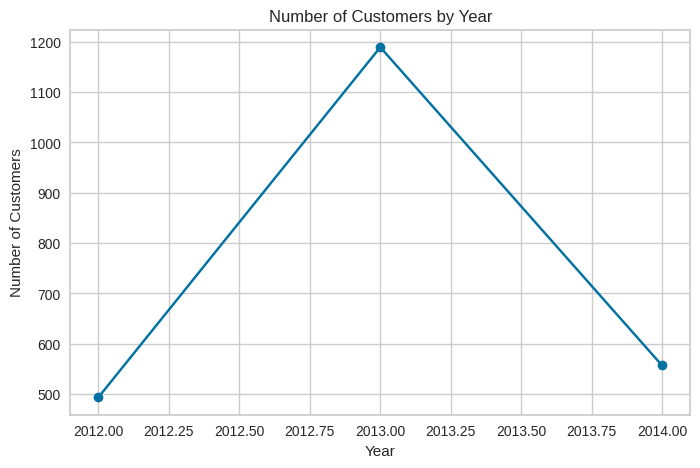

In [742]:
# Plot the trend
plt.figure(figsize=(8,5))
plt.plot(customers_per_year['Year'], customers_per_year['Num_Customers'], marker='o')
plt.title('Number of Customers by Year')
plt.xlabel('Year')
plt.ylabel('Number of Customers')
plt.grid(True)
plt.show()

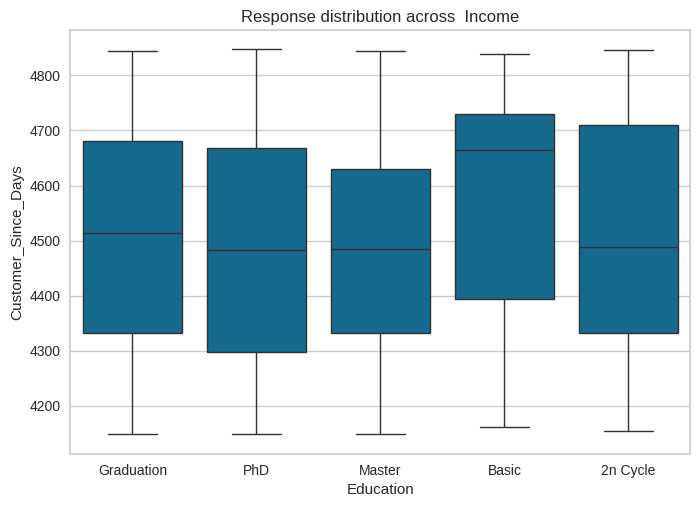

In [743]:
sns.boxplot(x='Education', y='Customer_Since_Days', data=df)
plt.title("Response distribution across  Income")
plt.show()

From the above plot the basic education level customers have joined long ago than others

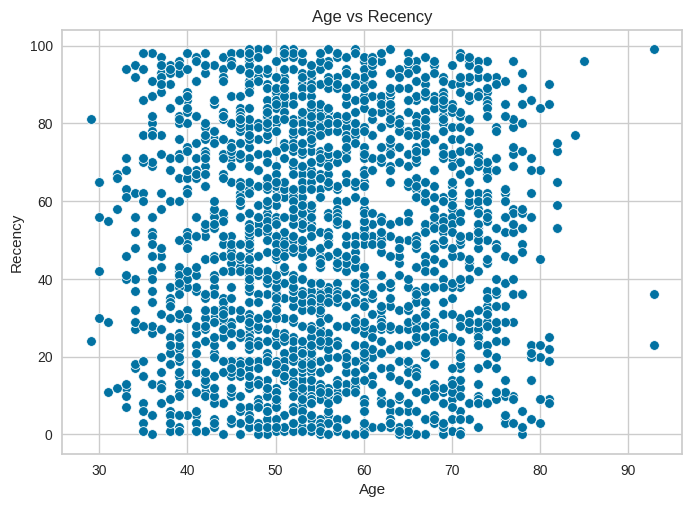

In [744]:
# Age vs Recency
sns.scatterplot(x='Age', y='Recency', data=df)
plt.title('Age vs Recency')
plt.show()

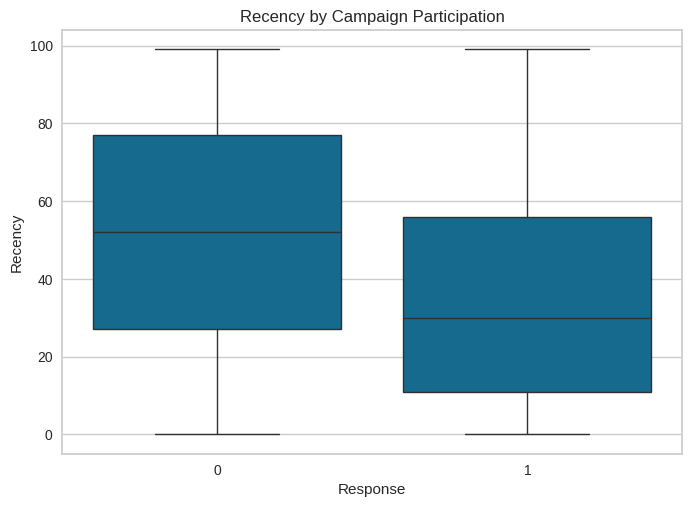

In [745]:
# Campaigns vs Recency
sns.boxplot(x='Response', y='Recency', data=df)
plt.title('Recency by Campaign Participation')
plt.show()

In [746]:
recency_0 = df[df['Response'] == 0]['Recency']
recency_1 = df[df['Response'] == 1]['Recency']
ttest_ind(recency_0, recency_1, equal_var=False)

TtestResult(statistic=np.float64(9.786012401420239), pvalue=np.float64(1.0851343821468196e-20), df=np.float64(465.80529391766504))

Customers who accepted the campaign have significantly higher recency values,

-> They made their last purchase a long time ago (they are less recent customers).

-> Customers who did not accept the campaign are more recent buyers.

['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2']


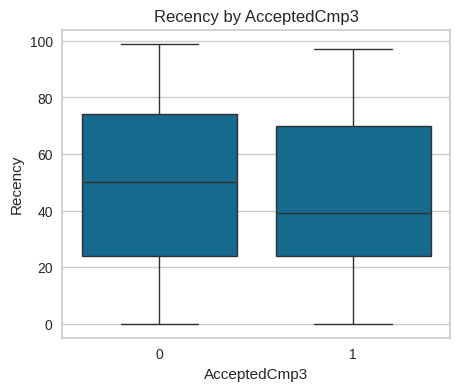

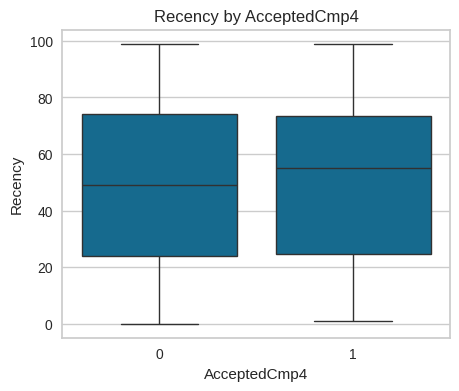

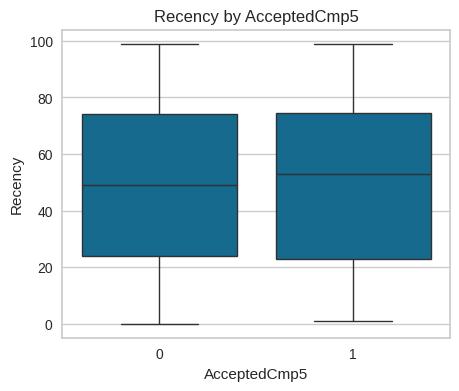

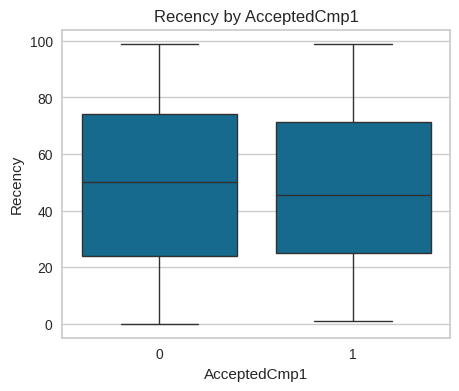

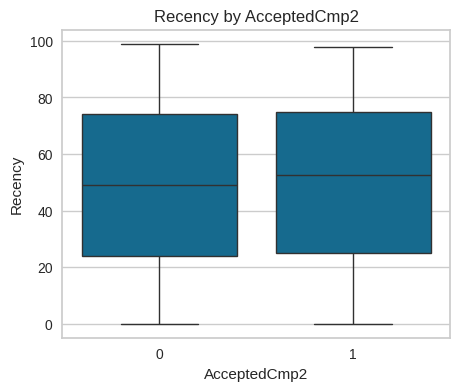

In [747]:
campaign_cols = [col for col in df.columns if 'acceptedcmp' in col.lower()]
print(campaign_cols)
for col in campaign_cols:
    plt.figure(figsize=(5,4))
    sns.boxplot(x=col, y='Recency', data=df)
    plt.title(f"Recency by {col}")
    plt.show()

In [748]:
for col in campaign_cols:
    rec0 = df[df[col] == 0]['Recency']
    rec1 = df[df[col] == 1]['Recency']
    t_stat, p_val = ttest_ind(rec0, rec1, equal_var=False)
    print(f"{col}: t={t_stat:.3f}, p={p_val:.3f}")

AcceptedCmp3: t=1.584, p=0.115
AcceptedCmp4: t=-0.888, p=0.376
AcceptedCmp5: t=-0.006, p=0.995
AcceptedCmp1: t=0.930, p=0.354
AcceptedCmp2: t=0.077, p=0.939


There is no clear evidence that recency (how recent the last purchase was) affects whether a customer accepts any campaign.

In [749]:
education_order = {
    'Basic': 1,
    '2n Cycle': 2,
    'Graduation': 3,
    'Master': 4,
    'PhD': 5
}

df['Education_Ordinal'] = df['Education'].map(education_order)



In [750]:
df=pd.get_dummies(df,columns=['Marital_Status'],drop_first=True,dtype=int)

In [751]:
df['campaign']=df['AcceptedCmp1']+df['AcceptedCmp2']+df['AcceptedCmp3']+df['AcceptedCmp4']+df['AcceptedCmp5']+df['Response']

In [752]:
df.head()

,Year_Birth,Education,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,...,Purchases_Ratio,Purchases_Ratio_transformed,Customer_Since_Days,Year,Education_Ordinal,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow,campaign
0,1957,Graduation,58138.0,0,0,2012-09-04,58,635,88,546,...,62.192308,4.579434,4811,2012,3,0,1,0,0,1
1,1954,Graduation,46344.0,1,1,2014-03-08,38,11,1,6,...,3.857143,1.640857,4261,2014,3,0,1,0,0,0
2,1965,Graduation,71613.0,0,0,2013-08-21,26,426,49,127,...,35.272727,3.913160,4460,2013,3,0,0,1,0,0
3,1984,Graduation,26646.0,1,0,2014-02-10,26,11,4,20,...,5.888889,2.020487,4287,2014,3,0,0,1,0,0
4,1981,PhD,58293.0,1,0,2014-01-19,94,173,43,118,...,21.100000,3.333013,4309,2014,5,1,0,0,0,0


In [753]:
df.columns

Index(['Year_Birth', 'Education', 'Income', 'Kidhome', 'Teenhome',
       'Dt_Customer', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
       'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
       'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3',
       'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2',
       'Complain', 'Response', 'Age', 'FamilySize', 'MntWines_transformed',
       'MntFruits_transformed', 'MntMeatProducts_transformed',
       'MntFishProducts_transformed', 'MntSweetProducts_transformed',
       'MntGoldProds_transformed', 'NumDealsPurchases_transformed',
       'NumWebPurchases_transformed', 'NumCatalogPurchases_transformed',
       'NumStorePurchases_transformed', 'NumWebVisitsMonth_transformed',
       'Total_Purchases', 'Total_Purchases_transformed', 'Total_Num_Purchases',
       'Purchases_Ratio', 'Purchases_Ratio_transformed', 'Customer_Since_Days',
     

In [754]:
EDA_df=df[['Income','Complain', 'Response', 'Age', 'FamilySize', 'MntWines_transformed',
       'MntFruits_transformed', 'MntMeatProducts_transformed',
       'MntFishProducts_transformed', 'MntSweetProducts_transformed',
       'MntGoldProds_transformed', 'NumDealsPurchases_transformed',
       'NumWebPurchases_transformed', 'NumCatalogPurchases_transformed',
       'NumStorePurchases_transformed', 'NumWebVisitsMonth_transformed',
        'Total_Purchases_transformed', 'Total_Num_Purchases',
      'Purchases_Ratio_transformed', 'Customer_Since_Days',
       'Education_Ordinal', 'Marital_Status_Married',
       'Marital_Status_Single', 'Marital_Status_Together',
       'Marital_Status_Widow', 'campaign']]

In [755]:
EDA_df.columns.duplicated().sum()

np.int64(0)

In [756]:
EDA_df

,Income,Complain,Response,Age,FamilySize,MntWines_transformed,MntFruits_transformed,MntMeatProducts_transformed,MntFishProducts_transformed,MntSweetProducts_transformed,...,Total_Purchases_transformed,Total_Num_Purchases,Purchases_Ratio_transformed,Customer_Since_Days,Education_Ordinal,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow,campaign
0,58138.0,0,1,68.0,1,25.199206,4.488636,6.304449,5.153292,4.488636,...,15.169530,25,4.579434,4811,3,0,1,0,0,1
1,46344.0,0,0,71.0,3,3.316625,0.693147,1.945910,1.098612,0.693147,...,4.531195,6,1.640857,4261,3,0,1,0,0,0
2,71613.0,0,0,60.0,2,20.639767,3.912023,4.852030,4.718499,3.091042,...,12.645096,21,3.913160,4460,3,0,0,1,0,0
3,26646.0,0,0,41.0,3,3.316625,1.609438,3.044522,2.397895,1.386294,...,5.782352,8,2.020487,4287,3,0,0,1,0,0
4,58293.0,0,0,44.0,3,13.152946,3.784190,4.779123,3.850148,3.332205,...,10.785691,19,3.333013,4309,5,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,61223.0,0,0,58.0,3,26.627054,3.784190,5.209486,3.761200,4.779123,...,14.494592,18,4.731419,4529,3,1,0,0,0,0
2236,64014.0,0,0,79.0,5,20.149442,0.000000,3.433987,0.000000,0.000000,...,10.933245,22,3.235142,4167,5,0,0,1,0,1
2237,56981.0,0,0,44.0,1,30.133038,3.891820,5.384495,3.496508,2.564949,...,14.221576,19,4.576693,4303,3,0,0,0,0,1
2238,69245.0,0,0,69.0,3,20.688161,3.433987,5.370638,4.394449,3.433987,...,12.913738,23,3.908326,4304,4,0,0,1,0,0


In [757]:
EDA_df.dtypes

,0
Income,float64
Complain,int64
Response,int64
Age,float64
FamilySize,int64
MntWines_transformed,float64
MntFruits_transformed,float64
MntMeatProducts_transformed,float64
MntFishProducts_transformed,float64
MntSweetProducts_transformed,float64


In [758]:
EDA_df.corr()

,Income,Complain,Response,Age,FamilySize,MntWines_transformed,MntFruits_transformed,MntMeatProducts_transformed,MntFishProducts_transformed,MntSweetProducts_transformed,...,Total_Purchases_transformed,Total_Num_Purchases,Purchases_Ratio_transformed,Customer_Since_Days,Education_Ordinal,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow,campaign
Income,1.000000,-0.030829,0.166532,0.204921,-0.288967,0.783896,0.555903,0.785899,0.536856,0.543854,...,0.823674,0.678971,0.820799,-0.024842,0.178948,-0.009443,-0.022745,0.005458,0.041731,0.352135
Complain,-0.030829,1.000000,-0.001707,0.018459,0.022844,-0.039319,-0.011832,-0.027746,-0.030175,-0.025259,...,-0.039676,-0.020583,-0.046098,0.033120,-0.044592,-0.001307,0.016579,-0.004627,-0.018355,-0.017609
Response,0.166532,-0.001707,1.000000,-0.020058,-0.217782,0.219715,0.148634,0.222175,0.112779,0.135565,...,0.223935,0.155138,0.229062,0.194481,0.098945,-0.075699,0.106608,-0.075770,0.051723,0.724600
Age,0.204921,0.018459,-0.020058,1.000000,0.075666,0.206119,0.022931,0.107076,0.024280,-0.004768,...,0.163913,0.174812,0.148229,-0.019615,0.190382,-0.050552,-0.121508,0.052675,0.165025,-0.007878
FamilySize,-0.288967,0.022844,-0.217782,0.075666,1.000000,-0.291631,-0.396148,-0.391425,-0.402684,-0.378641,...,-0.381787,-0.199334,-0.429817,-0.023357,0.046455,0.323718,-0.417498,0.249626,-0.151416,-0.241116
MntWines_transformed,0.783896,-0.039319,0.219715,0.206119,-0.291631,1.000000,0.509427,0.797707,0.500076,0.499407,...,0.921657,0.812988,0.888289,0.164111,0.235667,-0.010432,-0.031089,0.008057,0.047101,0.431715
MntFruits_transformed,0.555903,-0.011832,0.148634,0.022931,-0.396148,0.509427,1.000000,0.704529,0.693656,0.686639,...,0.678418,0.552850,0.673949,0.126470,-0.148528,-0.019376,0.022874,-0.013395,0.016053,0.188417
MntMeatProducts_transformed,0.785899,-0.027746,0.222175,0.107076,-0.391425,0.797707,0.704529,1.000000,0.704935,0.685692,...,0.938509,0.799675,0.919703,0.159236,0.093144,-0.013854,0.000411,0.007070,0.035790,0.314132
MntFishProducts_transformed,0.536856,-0.030175,0.112779,0.024280,-0.402684,0.500076,0.693656,0.704935,1.000000,0.689732,...,0.677434,0.549522,0.674550,0.130091,-0.159127,-0.020055,0.007083,0.003908,0.040346,0.154125
MntSweetProducts_transformed,0.543854,-0.025259,0.135565,-0.004768,-0.378641,0.499407,0.686639,0.685692,0.689732,1.000000,...,0.666668,0.561037,0.655373,0.116478,-0.153670,-0.012470,0.005879,0.002353,0.019935,0.188143


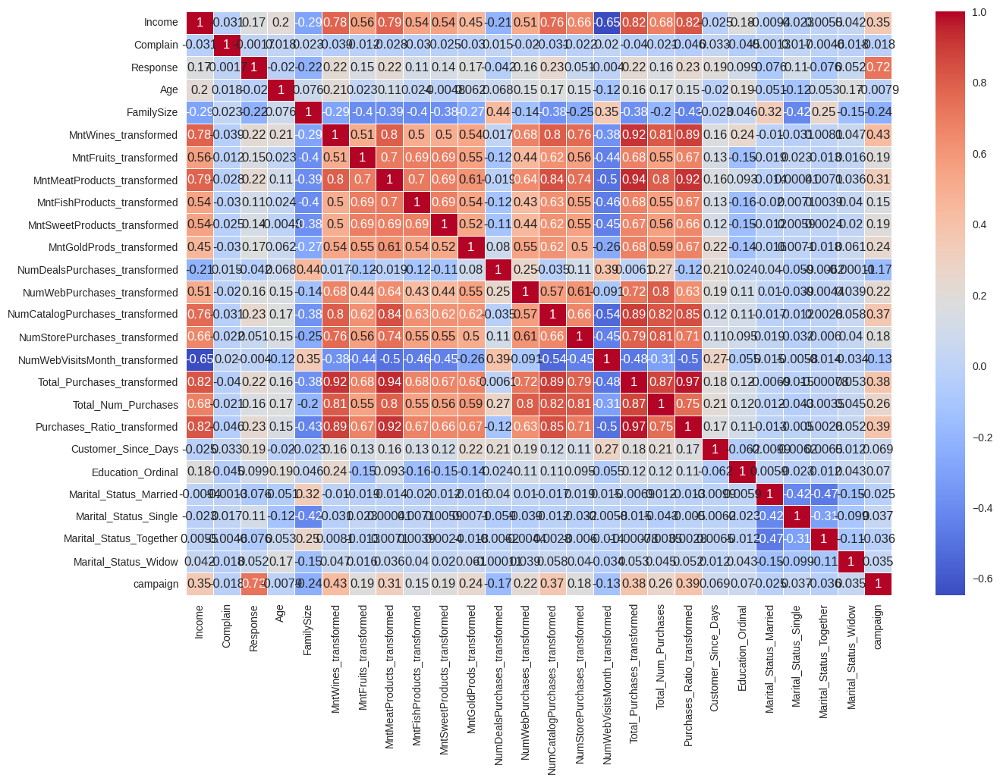

In [759]:
plt.figure(figsize=(15,10))
sns.heatmap(EDA_df.corr(),annot=True,cmap='coolwarm',linewidth=0.5)
plt.show()

Dropping the features which are having correlation > 8.5

In [760]:

corr_matrix = EDA_df.corr().abs()
upper = corr_matrix.where(
    np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)
)

to_drop = [column for column in upper.columns if any(upper[column] > 0.85)]
df_reduced = EDA_df.drop(columns=to_drop)
print("Dropped:", to_drop)

Dropped: ['Total_Purchases_transformed', 'Total_Num_Purchases', 'Purchases_Ratio_transformed']


In [761]:
df_reduced

,Income,Complain,Response,Age,FamilySize,MntWines_transformed,MntFruits_transformed,MntMeatProducts_transformed,MntFishProducts_transformed,MntSweetProducts_transformed,...,NumCatalogPurchases_transformed,NumStorePurchases_transformed,NumWebVisitsMonth_transformed,Customer_Since_Days,Education_Ordinal,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow,campaign
0,58138.0,0,1,68.0,1,25.199206,4.488636,6.304449,5.153292,4.488636,...,2.397895,1.609438,7,4811,3,0,1,0,0,1
1,46344.0,0,0,71.0,3,3.316625,0.693147,1.945910,1.098612,0.693147,...,0.693147,1.098612,5,4261,3,0,1,0,0,0
2,71613.0,0,0,60.0,2,20.639767,3.912023,4.852030,4.718499,3.091042,...,1.098612,2.397895,4,4460,3,0,0,1,0,0
3,26646.0,0,0,41.0,3,3.316625,1.609438,3.044522,2.397895,1.386294,...,0.000000,1.609438,6,4287,3,0,0,1,0,0
4,58293.0,0,0,44.0,3,13.152946,3.784190,4.779123,3.850148,3.332205,...,1.386294,1.945910,5,4309,5,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,61223.0,0,0,58.0,3,26.627054,3.784190,5.209486,3.761200,4.779123,...,1.386294,1.609438,5,4529,3,1,0,0,0,0
2236,64014.0,0,0,79.0,5,20.149442,0.000000,3.433987,0.000000,0.000000,...,1.098612,1.791759,7,4167,5,0,0,1,0,1
2237,56981.0,0,0,44.0,1,30.133038,3.891820,5.384495,3.496508,2.564949,...,1.386294,2.639057,6,4303,3,0,0,0,0,1
2238,69245.0,0,0,69.0,3,20.688161,3.433987,5.370638,4.394449,3.433987,...,1.791759,2.397895,3,4304,4,0,0,1,0,0


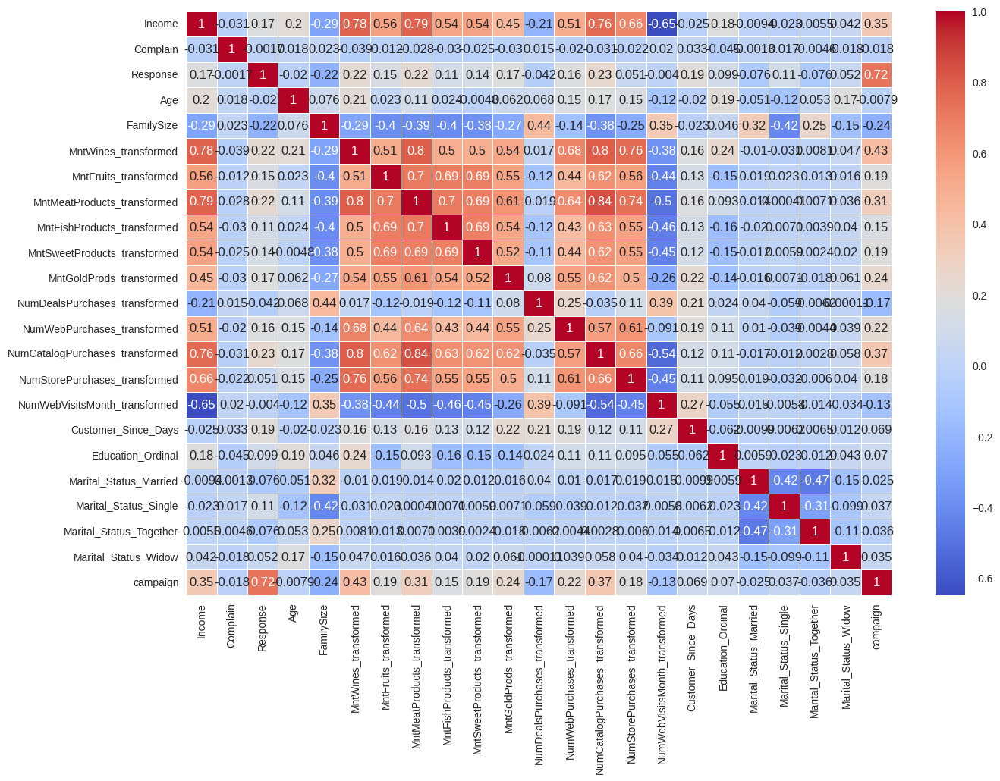

In [762]:

plt.figure(figsize=(15,10))
sns.heatmap(df_reduced.corr(),annot=True,cmap='coolwarm',linewidth=0.5)
plt.show()

# Multivariate Analysis

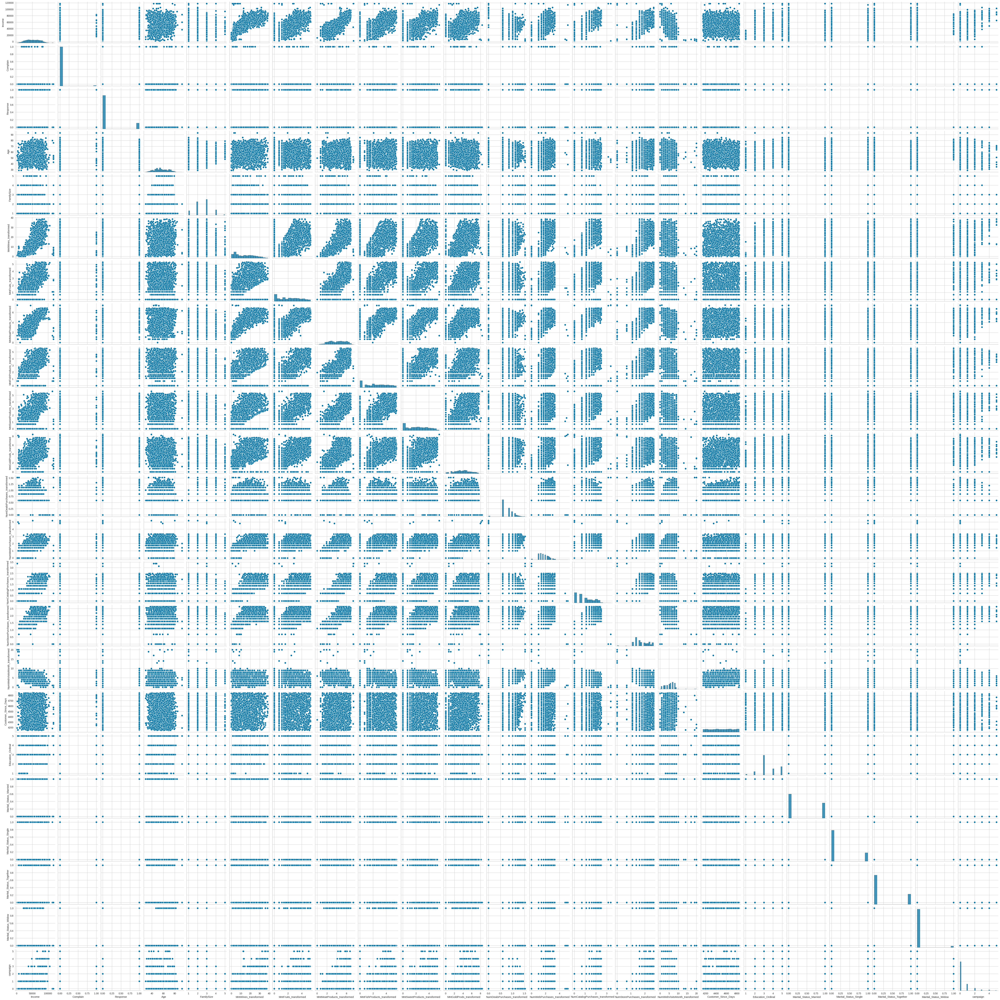

In [763]:
sns.pairplot(df_reduced)

In [764]:
df_reduced.dtypes

,0
Income,float64
Complain,int64
Response,int64
Age,float64
FamilySize,int64
MntWines_transformed,float64
MntFruits_transformed,float64
MntMeatProducts_transformed,float64
MntFishProducts_transformed,float64
MntSweetProducts_transformed,float64


In [765]:
df_reduced.head()

,Income,Complain,Response,Age,FamilySize,MntWines_transformed,MntFruits_transformed,MntMeatProducts_transformed,MntFishProducts_transformed,MntSweetProducts_transformed,...,NumCatalogPurchases_transformed,NumStorePurchases_transformed,NumWebVisitsMonth_transformed,Customer_Since_Days,Education_Ordinal,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow,campaign
0,58138.0,0,1,68.0,1,25.199206,4.488636,6.304449,5.153292,4.488636,...,2.397895,1.609438,7,4811,3,0,1,0,0,1
1,46344.0,0,0,71.0,3,3.316625,0.693147,1.945910,1.098612,0.693147,...,0.693147,1.098612,5,4261,3,0,1,0,0,0
2,71613.0,0,0,60.0,2,20.639767,3.912023,4.852030,4.718499,3.091042,...,1.098612,2.397895,4,4460,3,0,0,1,0,0
3,26646.0,0,0,41.0,3,3.316625,1.609438,3.044522,2.397895,1.386294,...,0.000000,1.609438,6,4287,3,0,0,1,0,0
4,58293.0,0,0,44.0,3,13.152946,3.784190,4.779123,3.850148,3.332205,...,1.386294,1.945910,5,4309,5,1,0,0,0,0


In [766]:
df_reduced.to_csv("EDA_Data.csv")

In [767]:
df_reduced.columns

Index(['Income', 'Complain', 'Response', 'Age', 'FamilySize',
       'MntWines_transformed', 'MntFruits_transformed',
       'MntMeatProducts_transformed', 'MntFishProducts_transformed',
       'MntSweetProducts_transformed', 'MntGoldProds_transformed',
       'NumDealsPurchases_transformed', 'NumWebPurchases_transformed',
       'NumCatalogPurchases_transformed', 'NumStorePurchases_transformed',
       'NumWebVisitsMonth_transformed', 'Customer_Since_Days',
       'Education_Ordinal', 'Marital_Status_Married', 'Marital_Status_Single',
       'Marital_Status_Together', 'Marital_Status_Widow', 'campaign'],
      dtype='object')

In [768]:
df_reduced.describe()

,Income,Complain,Response,Age,FamilySize,MntWines_transformed,MntFruits_transformed,MntMeatProducts_transformed,MntFishProducts_transformed,MntSweetProducts_transformed,...,NumCatalogPurchases_transformed,NumStorePurchases_transformed,NumWebVisitsMonth_transformed,Customer_Since_Days,Education_Ordinal,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow,campaign
count,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000
mean,51876.329177,0.009375,0.149107,56.147768,2.596875,14.301935,2.238966,4.126719,2.534820,2.239643,...,1.005809,1.800624,5.316518,4501.582143,3.460268,0.387500,0.215625,0.258929,0.034375,0.446875
std,20938.680462,0.096391,0.356274,11.771725,0.905785,9.971698,1.570430,1.561170,1.657324,1.594163,...,0.771292,0.486662,2.426645,202.122512,1.004337,0.487288,0.411347,0.438144,0.182231,0.890543
min,1730.000000,0.000000,0.000000,29.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,4148.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,35538.750000,0.000000,0.000000,48.000000,2.000000,4.873192,0.693147,2.833213,1.386294,0.693147,...,0.000000,1.386294,3.000000,4328.750000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,51381.500000,0.000000,0.000000,55.000000,3.000000,13.171926,2.197225,4.219508,2.564949,2.197225,...,1.098612,1.791759,6.000000,4503.500000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,68289.750000,0.000000,0.000000,66.000000,3.000000,22.455510,3.526361,5.451038,3.931826,3.526361,...,1.609438,2.197225,7.000000,4677.000000,4.000000,1.000000,0.000000,1.000000,0.000000,1.000000
max,117416.250000,1.000000,1.000000,93.000000,5.000000,38.639358,5.298317,7.453562,5.560682,5.575949,...,3.367296,2.639057,20.000000,4847.000000,5.000000,1.000000,1.000000,1.000000,1.000000,5.000000


In [769]:
from sklearn.feature_selection import VarianceThreshold

sel = VarianceThreshold(threshold=0.01)
sel.fit(df_reduced)
low_variance = df_reduced.columns[~sel.get_support()]
print("Low variance features:", low_variance)


Low variance features: Index(['Complain'], dtype='object')


In [770]:
df_reduced.drop(columns=low_variance,inplace=True)

In [771]:
#scaling
from sklearn.preprocessing import StandardScaler,MinMaxScaler
sc=StandardScaler()
sc.fit(df_reduced)
standard_EDA_df=sc.transform(df_reduced)

In [772]:
# Applying scaling(Standard Scaler) for numerical data, the data comes as mean 0 and standard eviation to 1

In [773]:
standard_EDA_df=pd.DataFrame(standard_EDA_df,columns=df_reduced.columns,)

In [774]:
standard_EDA_df.describe()

,Income,Response,Age,FamilySize,MntWines_transformed,MntFruits_transformed,MntMeatProducts_transformed,MntFishProducts_transformed,MntSweetProducts_transformed,MntGoldProds_transformed,...,NumCatalogPurchases_transformed,NumStorePurchases_transformed,NumWebVisitsMonth_transformed,Customer_Since_Days,Education_Ordinal,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow,campaign
count,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03,...,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03
mean,-3.965082e-17,-7.295751e-17,-2.164935e-16,2.347329e-16,-8.247371e-17,1.871519e-16,-6.185528e-16,9.357594e-17,1.157804e-16,2.315608e-16,...,8.405974e-17,-3.092764e-16,-6.344132e-17,1.419499e-15,3.489272e-17,1.586033e-18,4.440892e-17,7.137148e-17,-3.647876e-17,9.516197e-18
std,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00,...,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00
min,-2.395448e+00,-4.186121e-01,-2.306699e+00,-1.763368e+00,-1.434573e+00,-1.426020e+00,-2.643940e+00,-1.529807e+00,-1.405216e+00,-2.139085e+00,...,-1.304348e+00,-3.700775e+00,-2.191381e+00,-1.749736e+00,-2.450190e+00,-7.953949e-01,-5.243094e-01,-5.910986e-01,-1.886762e-01,-5.019124e-01
25%,-7.804325e-01,-4.186121e-01,-6.923019e-01,-6.591062e-01,-9.457614e-01,-9.845478e-01,-8.287339e-01,-6.931551e-01,-9.703158e-01,-6.875744e-01,...,-1.304348e+00,-8.515601e-01,-9.548307e-01,-8.552770e-01,-4.583826e-01,-7.953949e-01,-5.243094e-01,-5.910986e-01,-1.886762e-01,-5.019124e-01
50%,-2.363758e-02,-4.186121e-01,-9.752387e-02,4.451555e-01,-1.133469e-01,-2.658544e-02,5.944845e-02,1.818336e-02,-2.661480e-02,4.154987e-03,...,1.203493e-01,-1.821805e-02,2.817201e-01,9.490706e-03,-4.583826e-01,-7.953949e-01,-5.243094e-01,-5.910986e-01,-1.886762e-01,-5.019124e-01
75%,7.840554e-01,-4.186121e-01,8.371273e-01,4.451555e-01,8.178542e-01,8.199549e-01,8.484756e-01,8.431166e-01,8.073229e-01,6.908815e-01,...,7.827958e-01,8.151240e-01,6.939037e-01,8.680727e-01,5.375214e-01,1.257237e+00,-5.243094e-01,1.691765e+00,-1.886762e-01,6.212482e-01
max,3.130787e+00,2.388846e+00,3.131271e+00,2.653679e+00,2.441195e+00,1.948533e+00,2.131469e+00,1.826159e+00,2.093293e+00,2.489087e+00,...,3.062413e+00,1.723211e+00,6.052291e+00,1.709335e+00,1.533425e+00,1.257237e+00,1.907271e+00,1.691765e+00,5.300086e+00,5.113891e+00


In [775]:
standard_EDA_df.columns

Index(['Income', 'Response', 'Age', 'FamilySize', 'MntWines_transformed',
       'MntFruits_transformed', 'MntMeatProducts_transformed',
       'MntFishProducts_transformed', 'MntSweetProducts_transformed',
       'MntGoldProds_transformed', 'NumDealsPurchases_transformed',
       'NumWebPurchases_transformed', 'NumCatalogPurchases_transformed',
       'NumStorePurchases_transformed', 'NumWebVisitsMonth_transformed',
       'Customer_Since_Days', 'Education_Ordinal', 'Marital_Status_Married',
       'Marital_Status_Single', 'Marital_Status_Together',
       'Marital_Status_Widow', 'campaign'],
      dtype='object')

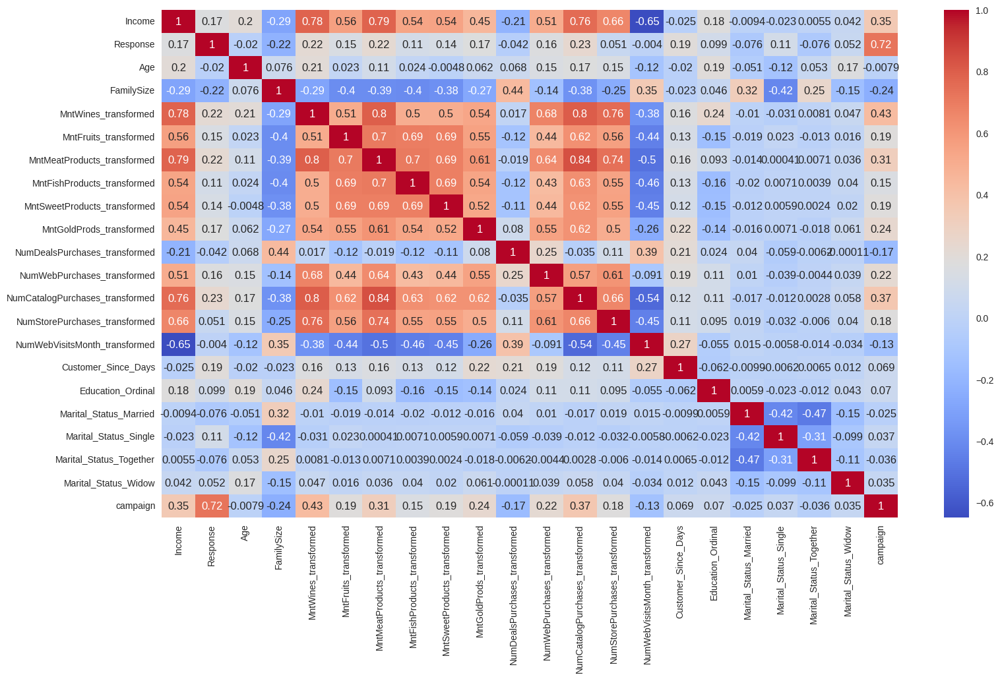

In [776]:
corr = standard_EDA_df.corr()
plt.figure(figsize=(18,10))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.show()

In [777]:
standard_EDA_df.reset_index(drop=True, inplace=True)

In [778]:
standard_EDA_df.shape

(2240, 22)

In [779]:
standard_EDA_df

,Income,Response,Age,FamilySize,MntWines_transformed,MntFruits_transformed,MntMeatProducts_transformed,MntFishProducts_transformed,MntSweetProducts_transformed,MntGoldProds_transformed,...,NumCatalogPurchases_transformed,NumStorePurchases_transformed,NumWebVisitsMonth_transformed,Customer_Since_Days,Education_Ordinal,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow,campaign
0,0.299115,2.388846,1.007064,-1.763368,1.093064,1.432838,1.395245,1.580292,1.411082,1.089796,...,1.805279,-0.392939,0.693904,1.531185,-0.458383,-0.795395,1.907271,-0.591099,-0.188676,0.621248
1,-0.264275,-0.418612,1.261969,0.445156,-1.101895,-0.984548,-1.397218,-0.866776,-0.970316,-0.937974,...,-0.405464,-1.442826,-0.130463,-1.190545,-0.458383,-0.795395,1.907271,-0.591099,-0.188676,-0.501912
2,0.942804,-0.418612,0.327318,-0.659106,0.635724,1.065587,0.464698,1.317887,0.534192,0.448772,...,0.120349,1.227557,-0.542647,-0.205773,-0.458383,-0.795395,-0.524309,1.691765,-0.188676,-0.501912
3,-1.205232,-0.418612,-1.287080,0.445156,-1.101895,-0.400953,-0.693351,-0.082637,-0.535416,-1.043096,...,-1.304348,-0.392939,0.281720,-1.061881,-0.458383,-0.795395,-0.524309,1.691765,-0.188676,-0.501912
4,0.306519,-0.418612,-1.032175,0.445156,-0.115251,0.984169,0.417988,0.793822,0.685504,-0.341747,...,0.493420,0.298604,-0.130463,-0.953012,1.533425,1.257237,-0.524309,-0.591099,-0.188676,-0.501912
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,0.446483,-0.418612,0.157381,0.445156,1.236286,0.984169,0.693716,0.740141,1.593342,2.087553,...,0.493420,-0.392939,-0.130463,0.135680,-0.458383,1.257237,-0.524309,-0.591099,-0.188676,-0.501912
2236,0.579806,-0.418612,1.941715,2.653679,0.586541,-1.426020,-0.443825,-1.529807,-1.405216,-0.762599,...,0.120349,-0.018218,0.693904,-1.655713,1.533425,-0.795395,-0.524309,1.691765,-0.188676,0.621248
2237,0.243846,-0.418612,-1.032175,-1.763368,1.587958,1.052720,0.805842,0.580395,0.204106,0.004155,...,0.493420,1.723211,0.281720,-0.982703,-0.458383,-0.795395,-0.524309,-0.591099,-0.188676,0.621248
2238,0.829687,-0.418612,1.092032,0.445156,0.640578,0.761121,0.796964,1.122318,0.749365,0.764621,...,1.019233,1.227557,-0.954831,-0.977755,0.537521,-0.795395,-0.524309,1.691765,-0.188676,-0.501912


In [780]:
from sklearn.decomposition import PCA
p=PCA(n_components=0.90)
p.fit(standard_EDA_df)

PCA(n_components=0.9)

In [781]:
print("PCA expects:", p.n_features_in_)

PCA expects: 22


weights of the original data features

In [782]:
W=p.components_.T
W

array([[ 0.30947758, -0.00134682, -0.10749653,  0.23779007,  0.02789379,
         0.00958423, -0.08814084,  0.01201624,  0.00497379, -0.09283327,
        -0.26001856, -0.02975765],
       [ 0.10367319, -0.12962176,  0.55182916,  0.14503501,  0.10969264,
         0.28784086,  0.07755599, -0.13623172,  0.06858886,  0.3360248 ,
         0.07784748,  0.01907176],
       [ 0.05461855,  0.19023449, -0.05973976,  0.34444502, -0.17777722,
        -0.23537697,  0.27707805, -0.13615974,  0.78409405,  0.02977041,
         0.13999034, -0.08522932],
       [-0.17671932,  0.47406277, -0.08270419,  0.06790291,  0.02741495,
         0.20105994, -0.08050596, -0.18022123,  0.01383892,  0.1888747 ,
        -0.20949618,  0.09699708],
       [ 0.31443995,  0.14331516,  0.09246642,  0.16679817, -0.01779113,
        -0.06192584, -0.11516502,  0.05746331, -0.06097003, -0.2700887 ,
        -0.14532695, -0.13714692],
       [ 0.28617517, -0.05878284, -0.10592493, -0.21348123,  0.01523034,
         0.07004219,  

In [783]:
p.n_components_

np.int64(12)

In [784]:
p.explained_variance_ratio_

array([0.33266228, 0.09606874, 0.08197707, 0.07553592, 0.06790852,
       0.05893526, 0.05015277, 0.03502556, 0.03424908, 0.02471891,
       0.02295101, 0.02060225])

In [785]:
PCA_data=p.transform(standard_EDA_df)
PCA_data

array([[ 3.90640548, -0.85884859,  2.96890032, ...,  0.86262438,
         0.91167451, -0.01018684],
       [-2.97581946, -1.45051108, -0.31092303, ...,  0.37697918,
        -0.59011095,  0.34910028],
       [ 2.4615818 ,  0.03654159, -1.42788192, ..., -0.67392525,
         0.66041214, -0.75402769],
       ...,
       [ 2.09589536, -1.41595901, -0.48669471, ..., -0.87923552,
        -0.09617367, -1.09064031],
       [ 2.57863378,  1.00606117, -1.68773904, ...,  0.39551131,
         0.52689192,  0.21447123],
       [-1.12109275,  1.90142727,  2.43758534, ...,  1.20413884,
         0.00489761,  0.63380314]])

In [786]:
# create column names (PC1, PC2, ...)
component_names = [f'PC{i+1}' for i in range(p.n_components_)]
component_names

['PC1',
 'PC2',
 'PC3',
 'PC4',
 'PC5',
 'PC6',
 'PC7',
 'PC8',
 'PC9',
 'PC10',
 'PC11',
 'PC12']

In [787]:
PCA_data=pd.DataFrame(PCA_data,columns=component_names)

In [788]:
p.explained_variance_ratio_.cumsum()

array([0.33266228, 0.42873102, 0.51070808, 0.586244  , 0.65415252,
       0.71308778, 0.76324055, 0.79826611, 0.83251519, 0.8572341 ,
       0.88018511, 0.90078735])

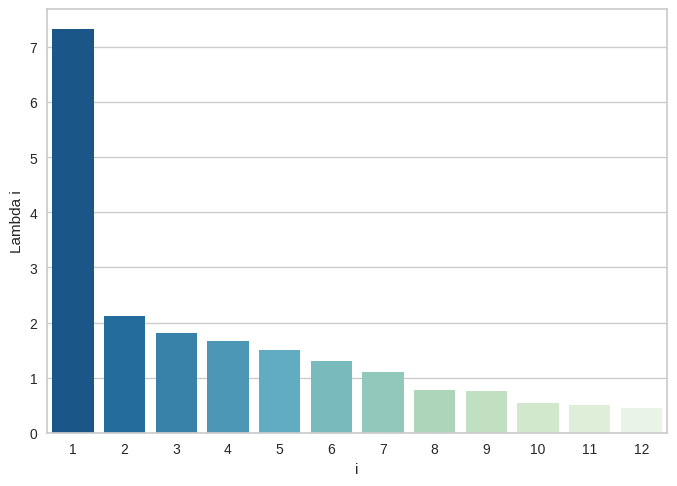

In [789]:
sns.barplot(x = list(range(1,p.n_components_+1)), y = p.explained_variance_, palette = 'GnBu_r')
plt.xlabel('i')
plt.ylabel('Lambda i');

# Model Building

# AgglomerativeClustering

In [790]:
from sklearn.cluster import AgglomerativeClustering
AC = AgglomerativeClustering(n_clusters=5)
# fit model and predict clusters
yhat_AC = AC.fit_predict(PCA_data)
PCA_data['Clusters'] = yhat_AC
#Adding the Clusters feature to the orignal dataframe.
standard_EDA_df['Clusters'] = yhat_AC

In [791]:
standard_EDA_df['Clusters'].value_counts()

,count
Clusters,
1,756
0,711
2,523
4,173
3,77


In [792]:
from sklearn.metrics import silhouette_score,davies_bouldin_score
print("davies_bouldin_score",davies_bouldin_score(PCA_data,yhat_AC))
print("silhouette_score:",silhouette_score(PCA_data,yhat_AC))

davies_bouldin_score 1.6293546035675817
silhouette_score: 0.19499193924728248


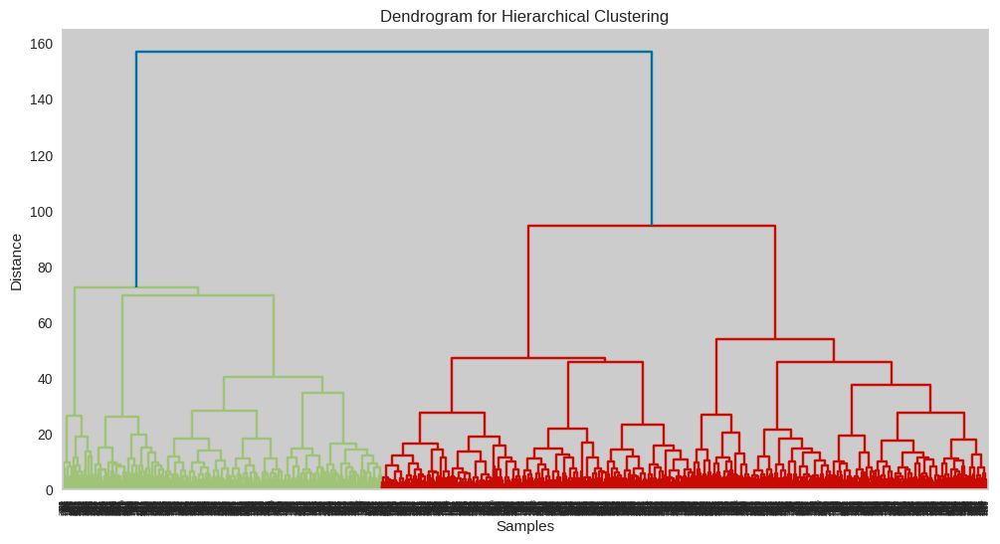

In [793]:
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

Z = linkage(PCA_data, method='ward')  # 'ward' minimizes variance within clusters

plt.figure(figsize=(12, 6))
dendrogram(Z)
plt.title("Dendrogram for Hierarchical Clustering")
plt.xlabel("Samples")
plt.ylabel("Distance")
plt.show()


From the aboove dendogram the number of clusters are 2 (scear and distinct seperation )

WE cantake 3-4 for seperation of sub groups.


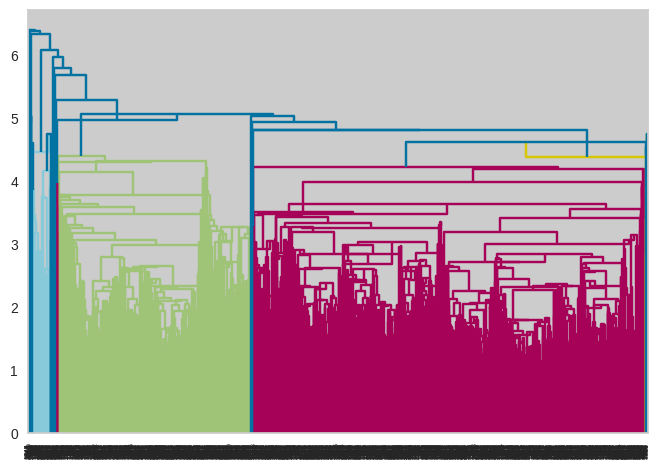

In [794]:
import scipy.cluster.hierarchy as sch

dendogram=sch.dendrogram(sch.linkage(PCA_data,method='centroid'))
plt.show()

In [795]:
linkages = ['ward', 'complete', 'average','single']
metric = ['euclidean', 'manhattan', 'cosine']
n_clusters = [3,4,5]
best_score = -1
best_params = {}
for link in linkages:
    for n in n_clusters:
  # Ward linkage works only with Euclidean
        if link == 'ward':
            affs = ['euclidean']
        else:
            affs = metric

        for aff in affs:
            model = AgglomerativeClustering(
                n_clusters=n, linkage=link, metric=aff
            )
            labels = model.fit_predict(PCA_data)
            score = silhouette_score(PCA_data, labels)
            if score > best_score:
                best_score = score
                best_params = {'n_clusters': n, 'linkage': link, 'metric': aff}

print(f"Best Score: {best_score:.3f}")
print("Best Parameters:", best_params)


Best Score: 0.215
Best Parameters: {'n_clusters': 4, 'linkage': 'complete', 'metric': 'manhattan'}


In [796]:
agg_model=AgglomerativeClustering(n_clusters=4, linkage='complete', metric='manhattan')
labels = agg_model.fit_predict(PCA_data)
agg_score = silhouette_score(PCA_data, labels)
agg_score

np.float64(0.215294157741353)

In [797]:
scores={}
scores['agg_score']=agg_score
scores

{'agg_score': np.float64(0.215294157741353)}

In [798]:
davies_bouldin_score(PCA_data,labels)

np.float64(1.4512579819659082)

In [799]:
unique,counts=np.unique(labels,return_counts=True)
value_counts=dict(zip(unique,counts))
value_counts

{np.int64(0): np.int64(1086),
 np.int64(1): np.int64(173),
 np.int64(2): np.int64(904),
 np.int64(3): np.int64(77)}

# KMeans

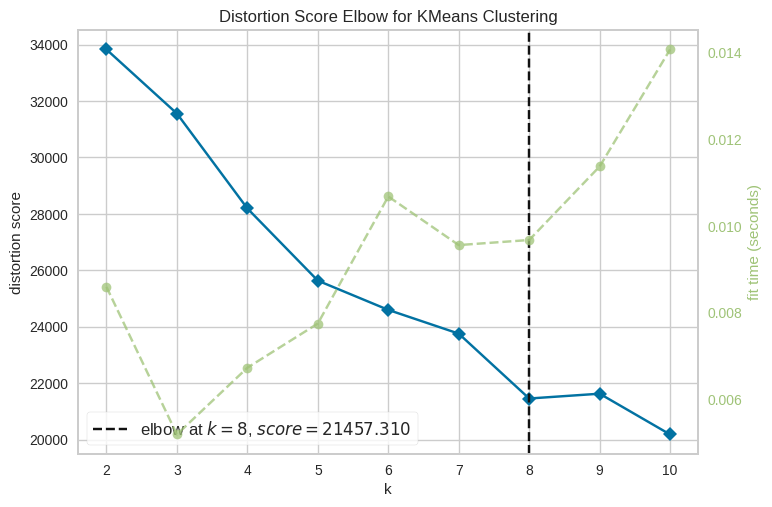

In [800]:
from sklearn.cluster import KMeans,AgglomerativeClustering,DBSCAN
from yellowbrick.cluster import KElbowVisualizer
Elbow_M = KElbowVisualizer(KMeans(), k=10)
Elbow_M.fit(PCA_data)
Elbow_M.show();

In [801]:
'''from sklearn.cluster import KMeans,AgglomerativeClustering,DBSCAN
from yellowbrick.cluster import KElbowVisualizer
Elbow_M = KElbowVisualizer(KMeans(), k=10,metric='silhouette')
Elbow_M.fit(PCA_data)
Elbow_M.show()''';

In [802]:
wcss=[]
for i in range(2,20):
    kmeans_model=KMeans(n_clusters=i).fit(PCA_data)
    wcss.append(kmeans_model.inertia_)
wcss

[33829.09458443558,
 29555.796818920724,
 26984.63465980493,
 25712.87067002739,
 24254.045841173494,
 23962.243176383567,
 22438.20957717885,
 20775.645070827315,
 20020.834058843506,
 19285.236643514552,
 18738.52826867839,
 17995.176048260364,
 17957.583170363283,
 16978.946101858117,
 16746.15930364231,
 16575.25115259563,
 16607.70610427341,
 15904.82727968505]

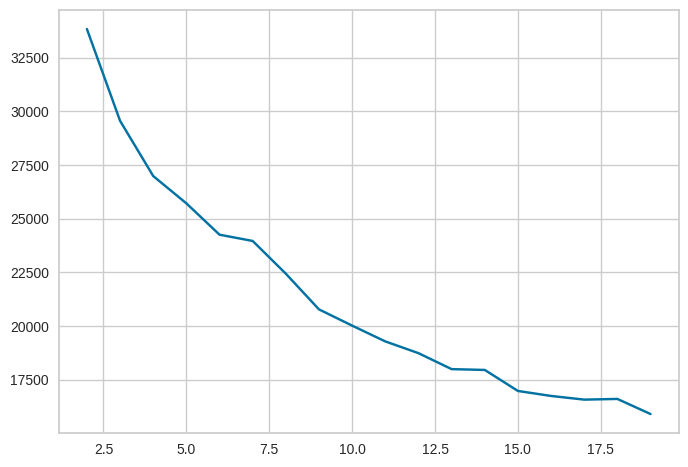

In [803]:
plt.plot(range(2,20),wcss)
plt.show()

From this WCSS graph the sharp drop from k=4 or 5,THe best elbow curve is at 5

In [804]:
inits = ['k-means++', 'random']
n_init_values = [10, 20,25,30,40,45, 50]
best_score = -1
best_params = {}
for init_method in inits:
    for n_init_val in n_init_values:
        kmeans = KMeans(n_clusters=5, init=init_method, n_init=n_init_val, max_iter=300, random_state=42)
        labels = kmeans.fit_predict(PCA_data)
        score = silhouette_score(PCA_data, labels)
        if score > best_score:
            best_score = score
            best_params = {'init': init_method, 'n_init': n_init_val}
print(f"Best Silhouette Score: {best_score:.3f}")
print("Best Parameters:", best_params)

Best Silhouette Score: 0.208
Best Parameters: {'init': 'k-means++', 'n_init': 45}


In [805]:
davies_bouldin_score(PCA_data,labels)

np.float64(1.5714770037904215)

In [806]:
kmeans_final_model=KMeans(n_clusters=5,init='k-means++',n_init=45,max_iter=300,random_state=42)
kmeans_final_model.fit(PCA_data)

KMeans(n_clusters=5, n_init=45, random_state=42)

In [807]:
clusters=kmeans_final_model.predict(PCA_data)

In [808]:
unique,counts=np.unique(clusters,return_counts=True)
value_counts=dict(zip(unique,counts))
value_counts

{np.int32(0): np.int64(864),
 np.int32(1): np.int64(585),
 np.int32(2): np.int64(539),
 np.int32(3): np.int64(77),
 np.int32(4): np.int64(175)}

In [809]:
kmeans_score=silhouette_score(PCA_data,clusters)
kmeans_score

np.float64(0.2084340313090928)

In [810]:
scores['kamean_score']=kmeans_score
scores

{'agg_score': np.float64(0.215294157741353),
 'kamean_score': np.float64(0.2084340313090928)}

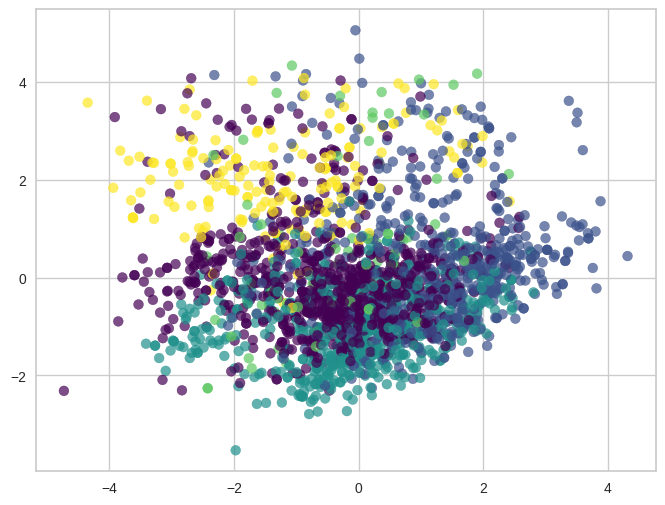

In [811]:
plt.figure(figsize=(8,6))
plt.scatter(PCA_data.iloc[:, 1], PCA_data.iloc[:, 2],
            c=clusters, cmap='viridis', s=50, alpha=0.7)

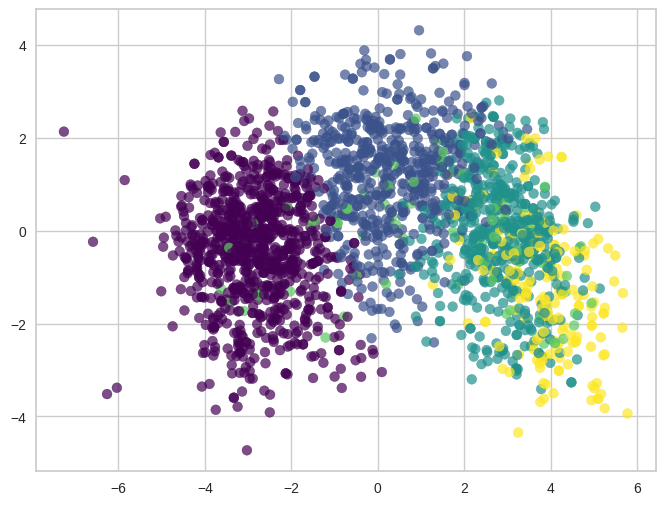

In [812]:
plt.figure(figsize=(8,6))
plt.scatter(PCA_data.iloc[:, 0], PCA_data.iloc[:, 1],
            c=clusters, cmap='viridis', s=50, alpha=0.7)

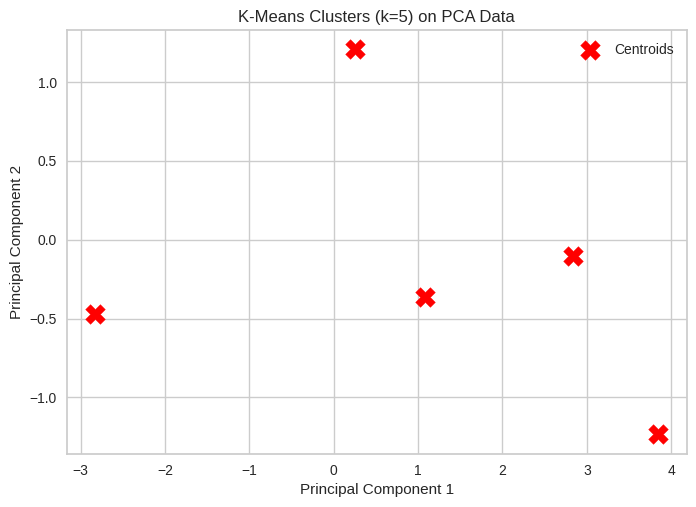

In [813]:
# Plot centroids
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1],
            c='red', s=200, marker='X', label='Centroids')

plt.title(f'K-Means Clusters (k={5}) on PCA Data')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

# DBSCAN

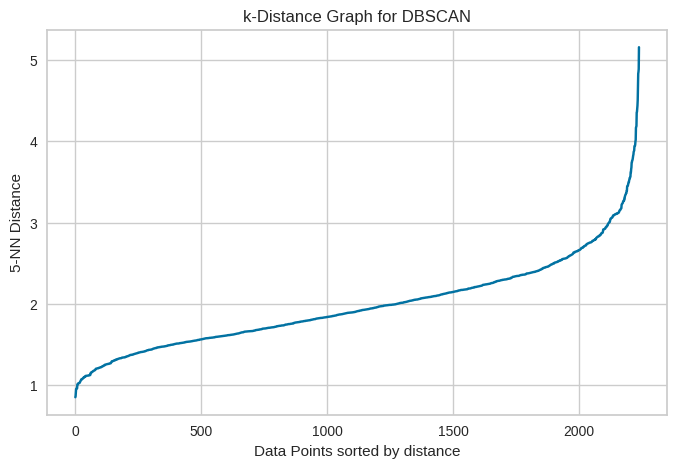

In [814]:
from sklearn.neighbors import NearestNeighbors
# Choose min_samples first
min_samples = 5
# Fit NearestNeighbors
neigh = NearestNeighbors(n_neighbors=min_samples)
nbrs = neigh.fit(PCA_data)
distances, indices = nbrs.kneighbors(PCA_data)

# Sort distances (the distance to the k-th nearest neighbor)
distances = np.sort(distances[:, min_samples - 1])

# Plot k-distance graph
plt.figure(figsize=(8,5))
plt.plot(distances)
plt.title("k-Distance Graph for DBSCAN")
plt.xlabel("Data Points sorted by distance")
plt.ylabel(f"{min_samples}-NN Distance")
plt.show()


From the above k-Distance graph the sharp rise beyon 2.5 to 3.0.

So the eps can be from 2.5 to 3.0

In [815]:
dbscan=DBSCAN(eps=2.5,min_samples=PCA_data.shape[1]+1)

In [816]:
labels = dbscan.fit_predict(PCA_data)

In [817]:
unique,counts=np.unique(labels,return_counts=True)
value_counts=dict(zip(unique,counts))
value_counts

{np.int64(-1): np.int64(418),
 np.int64(0): np.int64(1754),
 np.int64(1): np.int64(49),
 np.int64(2): np.int64(19)}

In [818]:
# Check how many clusters were formed
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
print("Estimated clusters:", n_clusters)
print("Noise points:", list(labels).count(-1))

Estimated clusters: 3
Noise points: 418


In [819]:
for eps in [2.0,2.3,2.5, 2.6,2.7,2.8,2.9,3.0,3.1,3.2,3.3]:
    dbscan = DBSCAN(eps=eps, min_samples=11)
    labels = dbscan.fit_predict(PCA_data)
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise = list(labels).count(-1)
    print(f"eps={eps:.4f} → clusters={n_clusters}, noise={n_noise}")

eps=2.0000 → clusters=10, noise=955
eps=2.3000 → clusters=3, noise=509
eps=2.5000 → clusters=6, noise=347
eps=2.6000 → clusters=4, noise=266
eps=2.7000 → clusters=4, noise=202
eps=2.8000 → clusters=4, noise=174
eps=2.9000 → clusters=3, noise=110
eps=3.0000 → clusters=3, noise=87
eps=3.1000 → clusters=3, noise=56
eps=3.2000 → clusters=2, noise=48
eps=3.3000 → clusters=2, noise=46


In [820]:
eps_values = [2.7,2.8,2.9,3.0]
min_samples_values =np.arange(5,15)

best_score = -1
best_params = {}

for eps in eps_values:
    for ms in min_samples_values:
        model = DBSCAN(eps=eps, min_samples=ms, metric='euclidean')
        labels = model.fit_predict(PCA_data)

        # Ignore if all points are in one cluster or only noise
        if len(set(labels)) <= 1:
            continue

        score = silhouette_score(PCA_data, labels)
        if score > best_score:
            best_score = score
            best_params = {'eps': eps, 'min_samples': ms}
print(f"Best Silhouette Score: {best_score:.3f}")
print("Best Parameters:", best_params)

Best Silhouette Score: 0.237
Best Parameters: {'eps': 3.0, 'min_samples': np.int64(6)}


In [821]:
unique,counts=np.unique(labels,return_counts=True)
value_counts=dict(zip(unique,counts))
value_counts

{np.int64(-1): np.int64(142),
 np.int64(0): np.int64(2083),
 np.int64(1): np.int64(15)}

In [822]:
dbscan_model = DBSCAN(eps=3.0, min_samples=6, metric='euclidean')
clusters = model.fit_predict(PCA_data)

In [823]:
dbscan_score=silhouette_score(PCA_data,clusters)
dbscan_score

np.float64(0.18971582754122276)

In [824]:
scores['dbscan_score']=dbscan_score
scores

{'agg_score': np.float64(0.215294157741353),
 'kamean_score': np.float64(0.2084340313090928),
 'dbscan_score': np.float64(0.18971582754122276)}

In [825]:
davies_bouldin_score(PCA_data,clusters)

np.float64(2.612981824625867)

In [826]:
unique,counts=np.unique(clusters,return_counts=True)
value_counts=dict(zip(unique,counts))
value_counts

{np.int64(-1): np.int64(142),
 np.int64(0): np.int64(2083),
 np.int64(1): np.int64(15)}

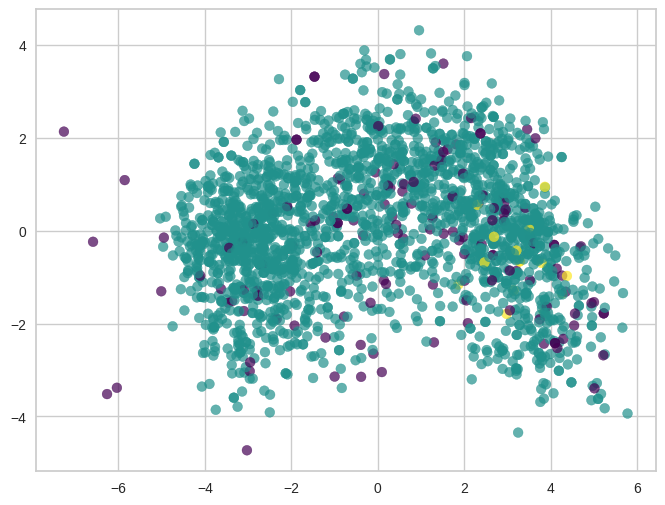

In [827]:
plt.figure(figsize=(8,6))
plt.scatter(PCA_data.iloc[:, 0], PCA_data.iloc[:, 1],
            c=clusters, cmap='viridis', s=50, alpha=0.7)

# OPTICS

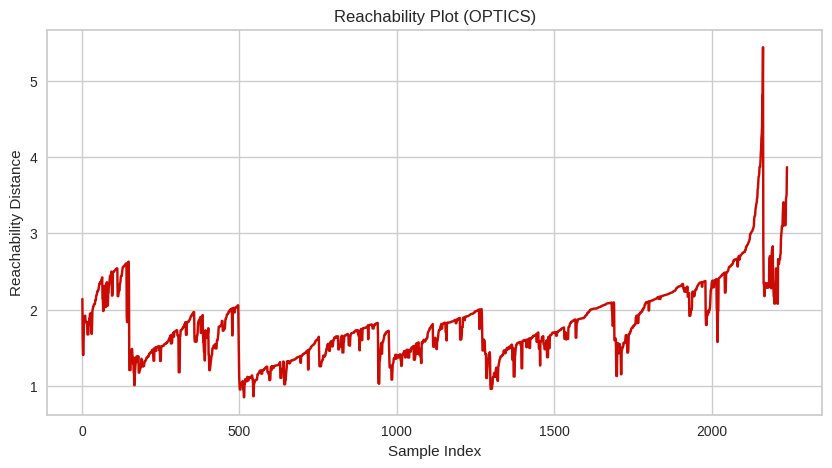

In [828]:
from sklearn.cluster import OPTICS

model = OPTICS(min_samples=5, xi=0.05, min_cluster_size=0.05)
labels = model.fit_predict(PCA_data)

plt.figure(figsize=(10, 5))
plt.plot(model.reachability_[model.ordering_], 'r-')
plt.title('Reachability Plot (OPTICS)')
plt.xlabel('Sample Index')
plt.ylabel('Reachability Distance')
plt.show()


The reachability distance increases sharply after around 2.5–3.0

It looks like there are 4-6 clusters .

In [829]:
from sklearn.cluster import OPTICS
from collections import Counter

# Try a few parameter sets
for xi in [0.03, 0.05, 0.07, 0.1]:
    for min_samples in [5, 10, 15]:
        optics = OPTICS(min_samples=min_samples, xi=xi, max_eps=3)
        optics.fit(PCA_data)
        labels = optics.labels_
        counts = Counter(labels)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        print(f"xi={xi}, min_samples={min_samples} → clusters={n_clusters}, noise={counts[-1] if -1 in counts else 0}")


xi=0.03, min_samples=5 → clusters=67, noise=1736
xi=0.03, min_samples=10 → clusters=13, noise=2056
xi=0.03, min_samples=15 → clusters=3, noise=2161
xi=0.05, min_samples=5 → clusters=47, noise=1920
xi=0.05, min_samples=10 → clusters=5, noise=2174
xi=0.05, min_samples=15 → clusters=1, noise=2218
xi=0.07, min_samples=5 → clusters=25, noise=2072
xi=0.07, min_samples=10 → clusters=4, noise=2169
xi=0.07, min_samples=15 → clusters=1, noise=159
xi=0.1, min_samples=5 → clusters=13, noise=2165
xi=0.1, min_samples=10 → clusters=3, noise=80
xi=0.1, min_samples=15 → clusters=1, noise=159


In [830]:
optics_model = OPTICS(min_samples=10, xi=0.1,max_eps=3)
labels = optics_model.fit_predict(PCA_data)
opt_score=silhouette_score(PCA_data,labels)
opt_score

np.float64(0.1826820886581649)

In [831]:
unique,counts=np.unique(labels,return_counts=True)
value_counts=dict(zip(unique,counts))
value_counts

{np.int64(-1): np.int64(80),
 np.int64(0): np.int64(2112),
 np.int64(1): np.int64(27),
 np.int64(2): np.int64(21)}

In [832]:
scores['opt_score']=opt_score

# GaussianMixture

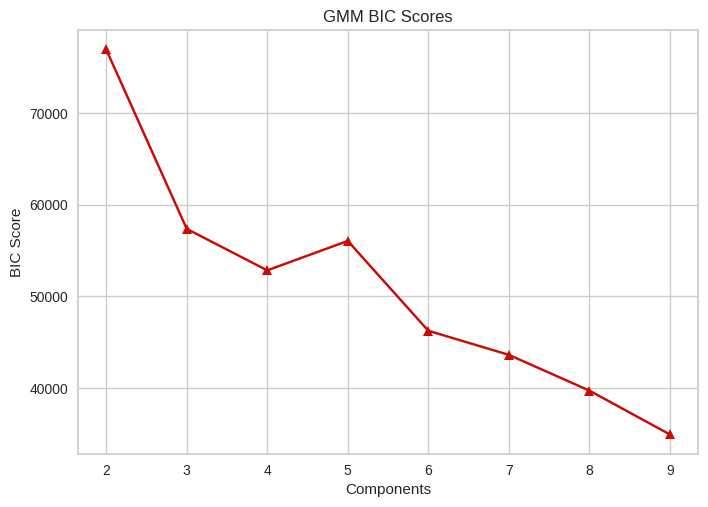

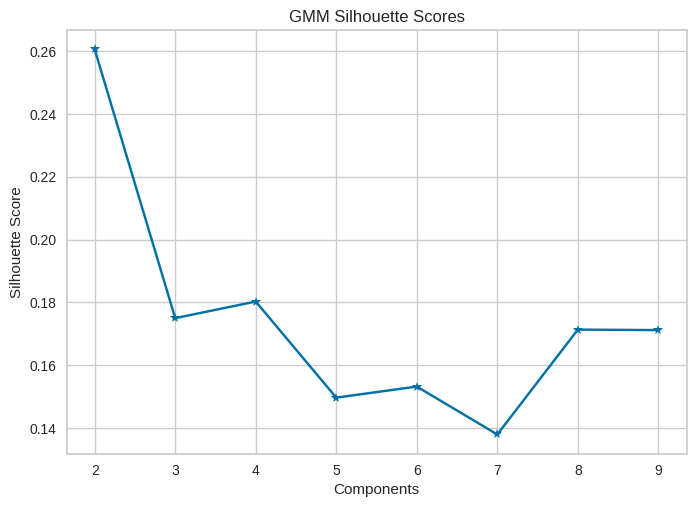

In [833]:
from sklearn.mixture import GaussianMixture

bics = []
sil_scores = []

for k in range(2, 10):
    gmm = GaussianMixture(n_components=k, random_state=42)
    gmm.fit(PCA_data)
    labels = gmm.predict(PCA_data)
    bics.append(gmm.bic(PCA_data))
    sil_scores.append(silhouette_score(PCA_data, labels))

plt.plot(range(2, 10), bics, 'r^-')
plt.xlabel('Components')
plt.ylabel('BIC Score')
plt.title('GMM BIC Scores')
plt.show()

plt.plot(range(2, 10), sil_scores, 'b*-')
plt.xlabel('Components')
plt.ylabel('Silhouette Score')
plt.title('GMM Silhouette Scores')
plt.show()


The optimal number of clusters for GMM is 2.

the highest silhouette score is at 2 components, but the BIC suggests 8-9

to balance both the clusters are 3-4

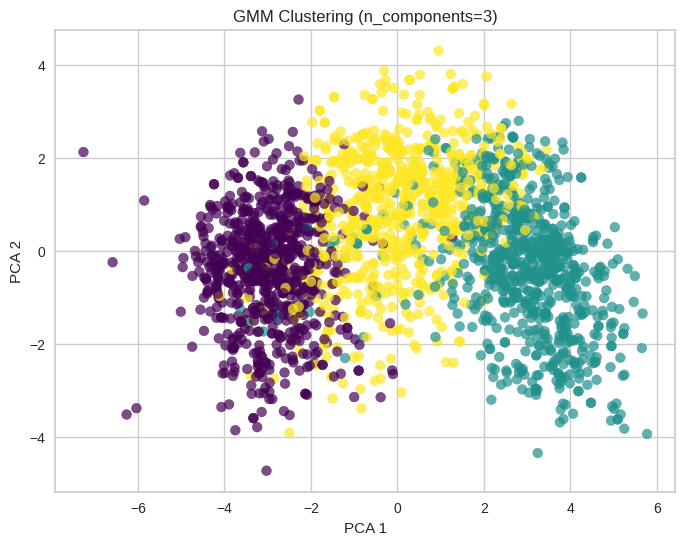

In [834]:
# Fit GMM with best number of components
best_n= 3  # from BIC curve
gmm = GaussianMixture(n_components=best_n, random_state=42)
labels = gmm.fit_predict(PCA_data)

# Plot clusters
plt.figure(figsize=(8,6))
plt.scatter(PCA_data.iloc[:, 0], PCA_data.iloc[:, 1],
            c=labels, cmap='viridis', s=50, alpha=0.7)
plt.title(f"GMM Clustering (n_components={best_n})")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.show()

In [835]:
unique,counts=np.unique(labels,return_counts=True)
value_counts=dict(zip(unique,counts))
value_counts

{np.int64(0): np.int64(756),
 np.int64(1): np.int64(773),
 np.int64(2): np.int64(711)}

In [836]:
cov_types = ['full', 'tied', 'diag', 'spherical']
best_score = -1
best_cov = None

for cov in cov_types:
    gmm = GaussianMixture(n_components=4, covariance_type=cov, random_state=42)
    labels = gmm.fit_predict(PCA_data)
    score = silhouette_score(PCA_data, labels)
    print(f"{cov} - Silhouette Score: {score:.3f}")
    if score > best_score:
        best_score = score
        best_cov = cov

print("Best covariance type:", best_cov)


full - Silhouette Score: 0.180
tied - Silhouette Score: 0.178
diag - Silhouette Score: 0.175
spherical - Silhouette Score: 0.189
Best covariance type: spherical


In [837]:
best_gmm = GaussianMixture(n_components=4, covariance_type='spherical', random_state=42)
labels = best_gmm.fit_predict(PCA_data)

gmm_score = silhouette_score(PCA_data, labels)
print("Final Silhouette Score:", gmm_score)


Final Silhouette Score: 0.1894265190264284


In [838]:
unique,counts=np.unique(labels,return_counts=True)
value_counts=dict(zip(unique,counts))
value_counts

{np.int64(0): np.int64(878),
 np.int64(1): np.int64(253),
 np.int64(2): np.int64(587),
 np.int64(3): np.int64(522)}

In [839]:
scores['gmm_score']=gmm_score

In [840]:
scores

{'agg_score': np.float64(0.215294157741353),
 'kamean_score': np.float64(0.2084340313090928),
 'dbscan_score': np.float64(0.18971582754122276),
 'opt_score': np.float64(0.1826820886581649),
 'gmm_score': np.float64(0.1894265190264284)}

From all the above clustering models the optics got best silhouette score but the clusters are imbalances as the most of the data pionts are under same cluster,So we don't take it.after that the k-means performs well with well defined clusters and better silhoutte score ,then the final models is **K-Means**

In [841]:
final_model=KMeans(n_clusters=5,init='k-means++',n_init=45,max_iter=300,random_state=42)
final_model.fit(PCA_data)

KMeans(n_clusters=5, n_init=45, random_state=42)

In [845]:
clusters=final_model.predict(PCA_data)

In [846]:
EDA_df['clusters']=clusters

In [849]:
EDA_df['clusters'].unique()

array([4, 0, 2, 1, 3], dtype=int32)

In [850]:
EDA_df.to_csv('EDA_df_clusters.csv')

# Deployment

In [842]:
import joblib
# Save your preprocessing pipeline and final model
joblib.dump(sc, "scaler.pkl")          # StandardScaler
joblib.dump(p, "pca.pkl")              # PCA

['pca.pkl']

In [843]:
joblib.dump(final_model,'final_model.pkl')

['final_model.pkl']